### Importar Librerias Practicas

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
import tempfile
import os

### Librerias para los Modelos 

In [2]:
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve, GridSearchCV, cross_validate, cross_val_predict
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc
from sklearn.impute import SimpleImputer
from tqdm import tqdm
import pymc as pm
import arviz as az
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import scikit_posthocs as sp
from sklearn.pipeline import make_pipeline
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
import baycomp

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


### Leer archivos

In [3]:
ruta = r'C:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\Data\train_cleaned.csv'

In [4]:
df = pd.read_csv(f'{ruta}')

In [5]:
df.shape

(8693, 23)

In [6]:
print(df)

       Age  RoomService  FoodCourt  ShoppingMall     Spa  VRDeck  Transported  \
0     39.0          0.0        0.0           0.0     0.0     0.0            0   
1     24.0        109.0        9.0          25.0   549.0    44.0            1   
2     58.0         43.0     3576.0           0.0  6715.0    49.0            0   
3     33.0          0.0     1283.0         371.0  3329.0   193.0            0   
4     16.0        303.0       70.0         151.0   565.0     2.0            1   
...    ...          ...        ...           ...     ...     ...          ...   
8688  41.0          0.0     6819.0           0.0  1643.0    74.0            0   
8689  18.0          0.0        0.0           0.0     0.0     0.0            0   
8690  26.0          0.0        0.0        1872.0     1.0     0.0            1   
8691  32.0          0.0     1049.0           0.0   353.0  3235.0            0   
8692  44.0        126.0     4688.0           0.0     0.0    12.0            1   

      HomePlanet_0.0  HomeP

### Entrenamiento de Varios Clasificadores


In [7]:
# Separar las características (X) y la variable objetivo (y)
X = df.drop(columns=['Transported'])
y = df['Transported']

In [8]:
# División en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [9]:
# Definir los clasificadores, incluyendo XGBoost
classifiers = {
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'XGBoost': XGBClassifier(random_state=42),
    'Support Vector Classifier': SVC(probability=True),
    'KNN Classifier': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'AdaBoost': AdaBoostClassifier(random_state=42),
    'CatBoost': CatBoostClassifier(random_state=42),
    'Extra Trees': ExtraTreesClassifier(random_state=42)
}

# Definir las métricas para la validación cruzada
scoring = {
    'Accuracy': 'accuracy',
    'Precision': 'precision_weighted',
    'Recall': 'recall_weighted',
    'F1': 'f1_weighted',
    'ROC AUC': 'roc_auc'
}

# Evaluar los clasificadores utilizando 5-fold cross-validation y guardar los resultados por métrica
results = {}
for name, model in tqdm(classifiers.items(), desc="Evaluando Modelos"):
    results[name] = {}
    for metric_name, metric in tqdm(scoring.items(), desc=f"Evaluando métricas para {name}", leave=False):
        scores = cross_val_score(model, X, y, cv=5, scoring=metric)
        results[name][metric_name] = scores  # Guardar los 5 resultados individuales

# Convertir los resultados a un DataFrame para cada métrica
accuracy_df = pd.DataFrame({model: results[model]['Accuracy'] for model in classifiers.keys()})
precision_df = pd.DataFrame({model: results[model]['Precision'] for model in classifiers.keys()})
recall_df = pd.DataFrame({model: results[model]['Recall'] for model in classifiers.keys()})
f1_df = pd.DataFrame({model: results[model]['F1'] for model in classifiers.keys()})
roc_auc_df = pd.DataFrame({model: results[model]['ROC AUC'] for model in classifiers.keys()})

# Mostrar los DataFrames con los resultados
print("Accuracy:\n", accuracy_df)
print("Precision:\n", precision_df)
print("Recall:\n", recall_df)
print("F1 Score:\n", f1_df)
print("ROC AUC:\n", roc_auc_df)

Evaluando Modelos:   0%|          | 0/10 [00:00<?, ?it/s]c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocess

Learning rate set to 0.023581
0:	learn: 0.6821162	total: 155ms	remaining: 2m 35s
1:	learn: 0.6705354	total: 164ms	remaining: 1m 22s
2:	learn: 0.6595636	total: 171ms	remaining: 56.8s
3:	learn: 0.6482238	total: 177ms	remaining: 44.1s
4:	learn: 0.6400585	total: 182ms	remaining: 36.1s
5:	learn: 0.6299371	total: 185ms	remaining: 30.7s
6:	learn: 0.6209779	total: 190ms	remaining: 26.9s
7:	learn: 0.6142773	total: 195ms	remaining: 24.2s
8:	learn: 0.6077699	total: 200ms	remaining: 22s
9:	learn: 0.6011756	total: 204ms	remaining: 20.2s
10:	learn: 0.5924959	total: 208ms	remaining: 18.7s
11:	learn: 0.5864684	total: 213ms	remaining: 17.6s
12:	learn: 0.5809542	total: 216ms	remaining: 16.4s
13:	learn: 0.5742574	total: 218ms	remaining: 15.4s
14:	learn: 0.5684274	total: 221ms	remaining: 14.5s
15:	learn: 0.5628476	total: 224ms	remaining: 13.8s
16:	learn: 0.5567485	total: 227ms	remaining: 13.1s
17:	learn: 0.5520213	total: 230ms	remaining: 12.5s
18:	learn: 0.5478166	total: 232ms	remaining: 12s
19:	learn: 0.

938:	learn: 0.3189108	total: 2.19s	remaining: 142ms
939:	learn: 0.3188958	total: 2.19s	remaining: 140ms
940:	learn: 0.3188171	total: 2.19s	remaining: 137ms
941:	learn: 0.3187246	total: 2.19s	remaining: 135ms
942:	learn: 0.3186367	total: 2.2s	remaining: 133ms
943:	learn: 0.3185300	total: 2.2s	remaining: 130ms
944:	learn: 0.3184658	total: 2.2s	remaining: 128ms
945:	learn: 0.3184019	total: 2.2s	remaining: 126ms
946:	learn: 0.3183545	total: 2.21s	remaining: 123ms
947:	learn: 0.3182668	total: 2.21s	remaining: 121ms
948:	learn: 0.3181932	total: 2.21s	remaining: 119ms
949:	learn: 0.3181582	total: 2.21s	remaining: 116ms
950:	learn: 0.3180596	total: 2.21s	remaining: 114ms
951:	learn: 0.3180296	total: 2.22s	remaining: 112ms
952:	learn: 0.3179745	total: 2.22s	remaining: 109ms
953:	learn: 0.3179494	total: 2.22s	remaining: 107ms
954:	learn: 0.3178674	total: 2.22s	remaining: 105ms
955:	learn: 0.3178058	total: 2.23s	remaining: 102ms
956:	learn: 0.3177672	total: 2.23s	remaining: 100ms
957:	learn: 0.31

970:	learn: 0.3167030	total: 2.27s	remaining: 67.9ms
971:	learn: 0.3166316	total: 2.28s	remaining: 65.6ms
972:	learn: 0.3165894	total: 2.28s	remaining: 63.2ms
973:	learn: 0.3164593	total: 2.28s	remaining: 60.9ms
974:	learn: 0.3163936	total: 2.28s	remaining: 58.5ms
975:	learn: 0.3163261	total: 2.28s	remaining: 56.2ms
976:	learn: 0.3162588	total: 2.29s	remaining: 53.8ms
977:	learn: 0.3161695	total: 2.29s	remaining: 51.5ms
978:	learn: 0.3160877	total: 2.29s	remaining: 49.1ms
979:	learn: 0.3160511	total: 2.29s	remaining: 46.8ms
980:	learn: 0.3159770	total: 2.3s	remaining: 44.5ms
981:	learn: 0.3158809	total: 2.3s	remaining: 42.2ms
982:	learn: 0.3158671	total: 2.31s	remaining: 39.9ms
983:	learn: 0.3157612	total: 2.31s	remaining: 37.5ms
984:	learn: 0.3156694	total: 2.31s	remaining: 35.2ms
985:	learn: 0.3155762	total: 2.31s	remaining: 32.9ms
986:	learn: 0.3155054	total: 2.32s	remaining: 30.5ms
987:	learn: 0.3154363	total: 2.32s	remaining: 28.2ms
988:	learn: 0.3153215	total: 2.32s	remaining: 25

983:	learn: 0.3157612	total: 2.78s	remaining: 45.1ms
984:	learn: 0.3156694	total: 2.78s	remaining: 42.3ms
985:	learn: 0.3155762	total: 2.78s	remaining: 39.5ms
986:	learn: 0.3155054	total: 2.79s	remaining: 36.7ms
987:	learn: 0.3154363	total: 2.79s	remaining: 33.9ms
988:	learn: 0.3153215	total: 2.79s	remaining: 31.1ms
989:	learn: 0.3152567	total: 2.79s	remaining: 28.2ms
990:	learn: 0.3152053	total: 2.8s	remaining: 25.4ms
991:	learn: 0.3151409	total: 2.8s	remaining: 22.6ms
992:	learn: 0.3150911	total: 2.8s	remaining: 19.8ms
993:	learn: 0.3150526	total: 2.81s	remaining: 16.9ms
994:	learn: 0.3150049	total: 2.81s	remaining: 14.1ms
995:	learn: 0.3149257	total: 2.81s	remaining: 11.3ms
996:	learn: 0.3147727	total: 2.81s	remaining: 8.47ms
997:	learn: 0.3146814	total: 2.82s	remaining: 5.65ms
998:	learn: 0.3146106	total: 2.82s	remaining: 2.82ms
999:	learn: 0.3145258	total: 2.82s	remaining: 0us
Learning rate set to 0.023581
0:	learn: 0.6821162	total: 3.29ms	remaining: 3.28s
1:	learn: 0.6705354	tota

992:	learn: 0.3150911	total: 2.5s	remaining: 17.6ms
993:	learn: 0.3150526	total: 2.5s	remaining: 15.1ms
994:	learn: 0.3150049	total: 2.5s	remaining: 12.6ms
995:	learn: 0.3149257	total: 2.5s	remaining: 10.1ms
996:	learn: 0.3147727	total: 2.51s	remaining: 7.55ms
997:	learn: 0.3146814	total: 2.51s	remaining: 5.03ms
998:	learn: 0.3146106	total: 2.51s	remaining: 2.52ms
999:	learn: 0.3145258	total: 2.52s	remaining: 0us
Learning rate set to 0.023581
0:	learn: 0.6821162	total: 3.88ms	remaining: 3.88s
1:	learn: 0.6705354	total: 7.7ms	remaining: 3.84s
2:	learn: 0.6595636	total: 10.9ms	remaining: 3.63s
3:	learn: 0.6482238	total: 14ms	remaining: 3.49s
4:	learn: 0.6400585	total: 17.1ms	remaining: 3.41s
5:	learn: 0.6299371	total: 19.9ms	remaining: 3.3s
6:	learn: 0.6209779	total: 22.5ms	remaining: 3.19s
7:	learn: 0.6142773	total: 24.9ms	remaining: 3.09s
8:	learn: 0.6077699	total: 27.4ms	remaining: 3.01s
9:	learn: 0.6011756	total: 29.9ms	remaining: 2.96s
10:	learn: 0.5924959	total: 32.3ms	remaining: 2

Evaluando Modelos:  90%|█████████ | 9/10 [03:35<00:31, 31.23s/it]

979:	learn: 0.3160511	total: 2.43s	remaining: 49.6ms
980:	learn: 0.3159770	total: 2.43s	remaining: 47.1ms
981:	learn: 0.3158809	total: 2.44s	remaining: 44.6ms
982:	learn: 0.3158671	total: 2.44s	remaining: 42.2ms
983:	learn: 0.3157612	total: 2.44s	remaining: 39.7ms
984:	learn: 0.3156694	total: 2.44s	remaining: 37.2ms
985:	learn: 0.3155762	total: 2.44s	remaining: 34.7ms
986:	learn: 0.3155054	total: 2.45s	remaining: 32.2ms
987:	learn: 0.3154363	total: 2.45s	remaining: 29.8ms
988:	learn: 0.3153215	total: 2.45s	remaining: 27.3ms
989:	learn: 0.3152567	total: 2.46s	remaining: 24.8ms
990:	learn: 0.3152053	total: 2.46s	remaining: 22.3ms
991:	learn: 0.3151409	total: 2.46s	remaining: 19.8ms
992:	learn: 0.3150911	total: 2.46s	remaining: 17.4ms
993:	learn: 0.3150526	total: 2.46s	remaining: 14.9ms
994:	learn: 0.3150049	total: 2.47s	remaining: 12.4ms
995:	learn: 0.3149257	total: 2.47s	remaining: 9.92ms
996:	learn: 0.3147727	total: 2.47s	remaining: 7.44ms
997:	learn: 0.3146814	total: 2.47s	remaining: 

Evaluando Modelos: 100%|██████████| 10/10 [03:45<00:00, 22.52s/it]

Accuracy:
    Logistic Regression  Random Forest  Gradient Boosting   XGBoost  \
0             0.780909       0.782634           0.785509  0.778608   
1             0.783209       0.774008           0.793560  0.786659   
2             0.799310       0.796435           0.799310  0.802185   
3             0.782509       0.799194           0.814730  0.809551   
4             0.792865       0.790564           0.803797  0.800921   

   Support Vector Classifier  KNN Classifier  Decision Tree  AdaBoost  \
0                   0.769983        0.766532       0.729730  0.775158   
1                   0.772283        0.765382       0.727430  0.788959   
2                   0.789534        0.767108       0.737205  0.793560   
3                   0.800345        0.772152       0.735328  0.789988   
4                   0.799194        0.785386       0.732451  0.795167   

   CatBoost  Extra Trees  
0  0.783784     0.759057  
1  0.795860     0.774008  
2  0.812536     0.783784  
3  0.818182     0.771

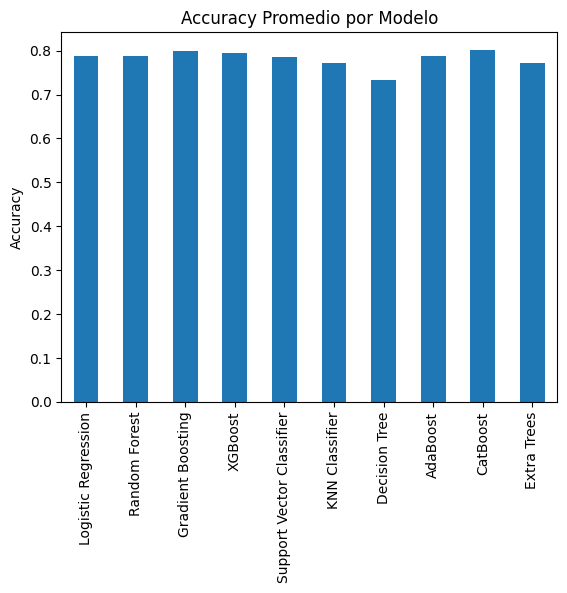

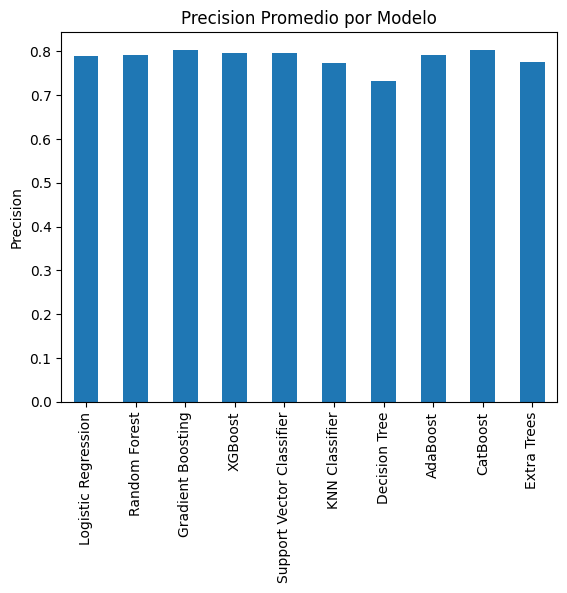

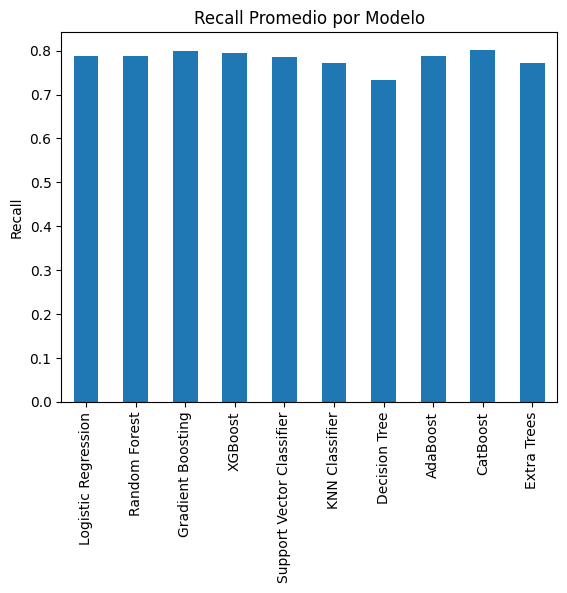

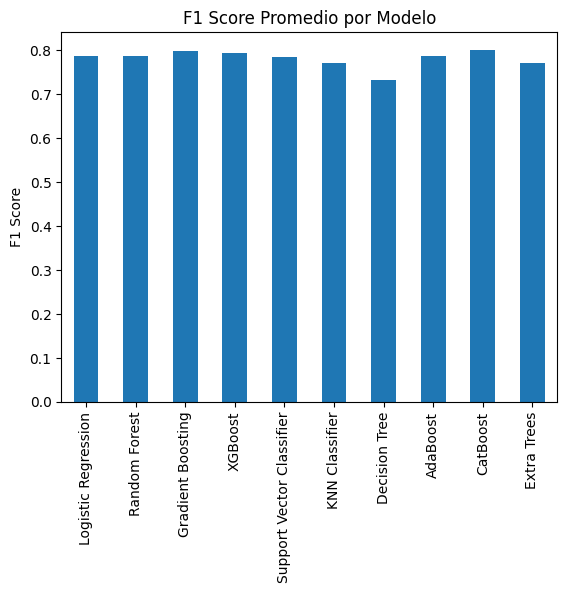

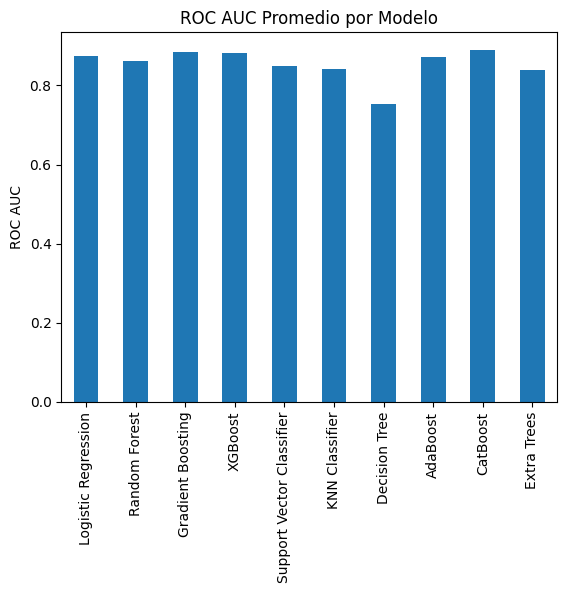

In [10]:
# Calcular los promedios de cada métrica
accuracy_mean = accuracy_df.mean()
precision_mean = precision_df.mean()
recall_mean = recall_df.mean()
f1_mean = f1_df.mean()
roc_auc_mean = roc_auc_df.mean()

# Visualizar los resultados
accuracy_mean.plot(kind='bar', title='Accuracy Promedio por Modelo')
plt.ylabel('Accuracy')
plt.show()

precision_mean.plot(kind='bar', title='Precision Promedio por Modelo')
plt.ylabel('Precision')
plt.show()

recall_mean.plot(kind='bar', title='Recall Promedio por Modelo')
plt.ylabel('Recall')
plt.show()

f1_mean.plot(kind='bar', title='F1 Score Promedio por Modelo')
plt.ylabel('F1 Score')
plt.show()

roc_auc_mean.plot(kind='bar', title='ROC AUC Promedio por Modelo')
plt.ylabel('ROC AUC')
plt.show()


Logistic Regression          5.9
Random Forest                5.7
Gradient Boosting            9.1
XGBoost                      7.8
Support Vector Classifier    5.1
KNN Classifier               2.6
Decision Tree                1.0
AdaBoost                     5.8
CatBoost                     9.3
Extra Trees                  2.7
dtype: float64


c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'Series.swapaxes' is deprecated and will be removed in a future version. Please use 'Series.transpose' instead.
  return bound(*args, **kwds)
c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\scikit_posthocs\_plotting.py:498: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  key=lambda x: ranks[list(x)].min()
c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\scikit_posthocs\_plotting.py:518: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavi

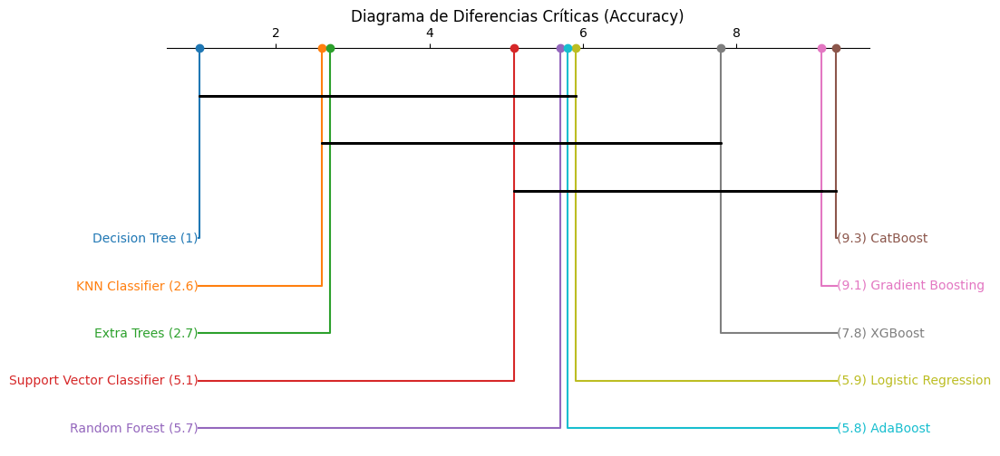

Logistic Regression          5.8
Random Forest                5.6
Gradient Boosting            8.8
XGBoost                      7.4
Support Vector Classifier    6.8
KNN Classifier               2.4
Decision Tree                1.0
AdaBoost                     5.6
CatBoost                     9.0
Extra Trees                  2.6
dtype: float64


c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'Series.swapaxes' is deprecated and will be removed in a future version. Please use 'Series.transpose' instead.
  return bound(*args, **kwds)
c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\scikit_posthocs\_plotting.py:498: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  key=lambda x: ranks[list(x)].min()
c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\scikit_posthocs\_plotting.py:518: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavi

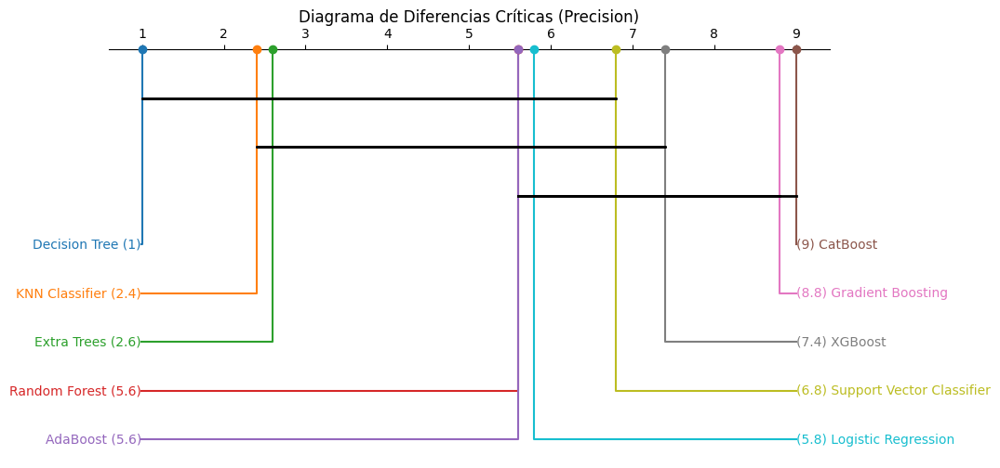

Logistic Regression          5.9
Random Forest                5.7
Gradient Boosting            9.1
XGBoost                      7.8
Support Vector Classifier    5.1
KNN Classifier               2.6
Decision Tree                1.0
AdaBoost                     5.8
CatBoost                     9.3
Extra Trees                  2.7
dtype: float64


c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'Series.swapaxes' is deprecated and will be removed in a future version. Please use 'Series.transpose' instead.
  return bound(*args, **kwds)
c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\scikit_posthocs\_plotting.py:498: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  key=lambda x: ranks[list(x)].min()
c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\scikit_posthocs\_plotting.py:518: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavi

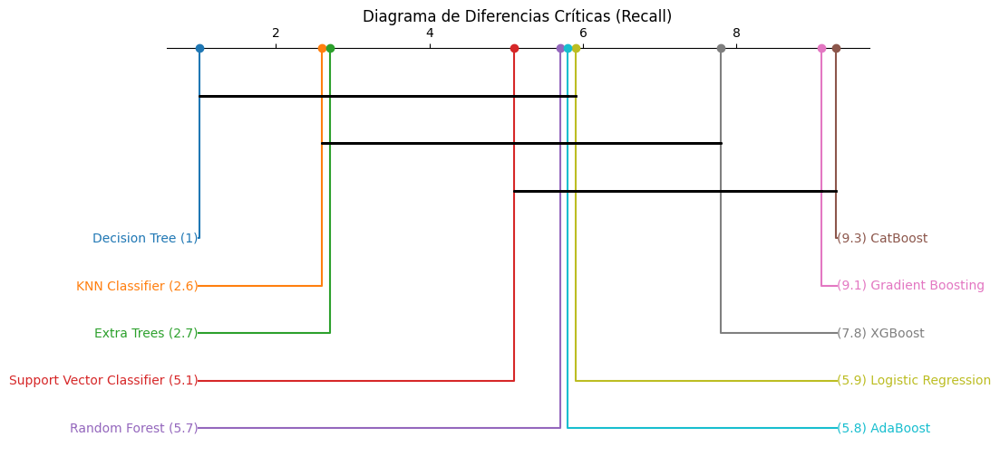

c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'Series.swapaxes' is deprecated and will be removed in a future version. Please use 'Series.transpose' instead.
  return bound(*args, **kwds)


Logistic Regression          5.8
Random Forest                5.6
Gradient Boosting            9.2
XGBoost                      7.8
Support Vector Classifier    4.8
KNN Classifier               2.8
Decision Tree                1.0
AdaBoost                     5.8
CatBoost                     9.4
Extra Trees                  2.8
dtype: float64


c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\scikit_posthocs\_plotting.py:498: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  key=lambda x: ranks[list(x)].min()
c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\scikit_posthocs\_plotting.py:518: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  [ranks[i] for i in bar],


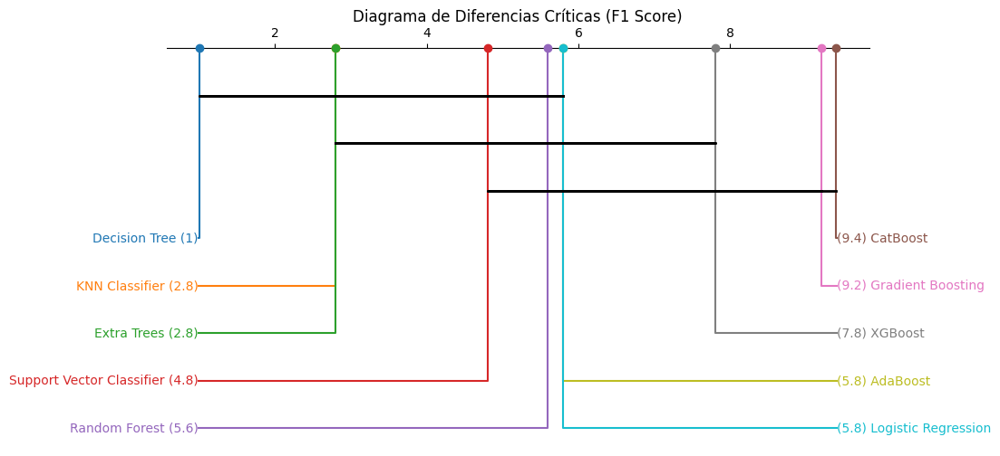

c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'Series.swapaxes' is deprecated and will be removed in a future version. Please use 'Series.transpose' instead.
  return bound(*args, **kwds)


Logistic Regression           6.6
Random Forest                 5.0
Gradient Boosting             8.4
XGBoost                       8.6
Support Vector Classifier     3.4
KNN Classifier                3.0
Decision Tree                 1.0
AdaBoost                      6.4
CatBoost                     10.0
Extra Trees                   2.6
dtype: float64


c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\scikit_posthocs\_plotting.py:498: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  key=lambda x: ranks[list(x)].min()
c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\scikit_posthocs\_plotting.py:518: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  [ranks[i] for i in bar],


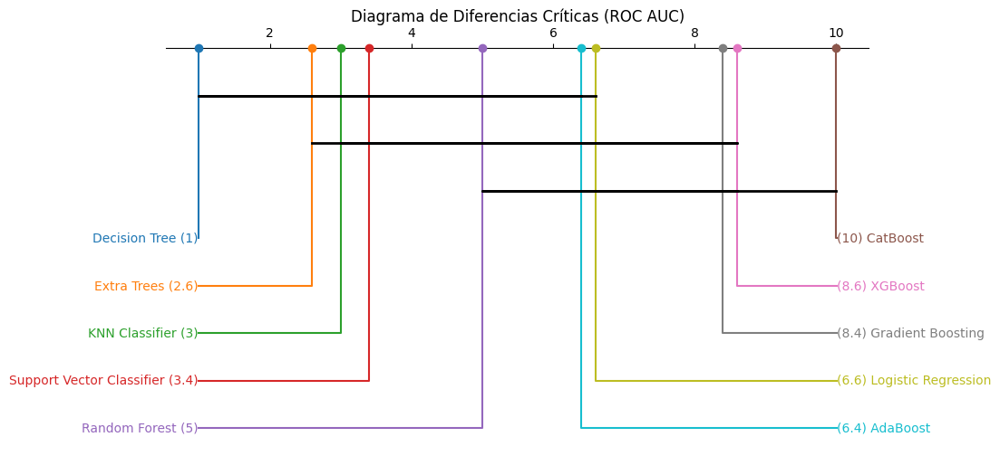

In [11]:
# Function to calculate and visualize critical differences using scikit-posthocs
def calcular_diferencias_criticas(df, metric_name):
    try:
        # Calcular los rangos promedio de los modelos
        avg_rank = df.rank(axis=1).mean(axis=0)
        print(avg_rank)

        # Realizar la prueba post-hoc de Nemenyi
        cd_result = sp.posthoc_nemenyi_friedman(df.values)

        # Graficar el diagrama de diferencias críticas
        plt.figure(figsize=(10, 6), dpi=100)
        plt.title(f'Diagrama de Diferencias Críticas ({metric_name})')
        sp.critical_difference_diagram(avg_rank, cd_result)
        plt.show()

    except ValueError as e:
        print(f"Error al calcular diferencias críticas para {metric_name}: {e}")

# Calcular y graficar diferencias críticas para cada métrica
calcular_diferencias_criticas(accuracy_df, 'Accuracy')
calcular_diferencias_criticas(precision_df, 'Precision')
calcular_diferencias_criticas(recall_df, 'Recall')
calcular_diferencias_criticas(f1_df, 'F1 Score')
calcular_diferencias_criticas(roc_auc_df, 'ROC AUC')


### Comparación Bayesiana

Imágenes guardadas en la carpeta temporal: C:\Users\MANUEL~1\AppData\Local\Temp\tmpt33jcy12
Comparación bayesiana entre Logistic Regression y Random Forest en Accuracy: (0.08604488573916723, 0.7986691369221687, 0.11528597733866408)


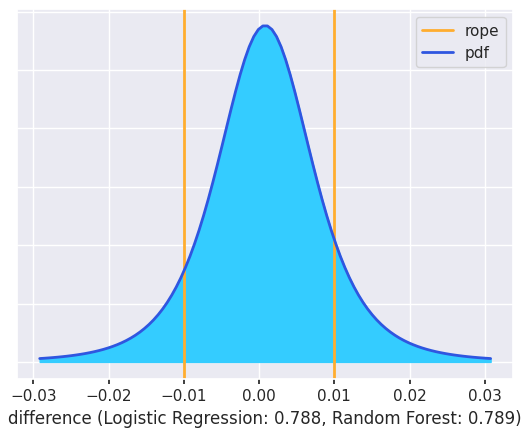

Comparación bayesiana entre Logistic Regression y Gradient Boosting en Accuracy: (0.029764022296266943, 0.39748954825537897, 0.5727464294483541)


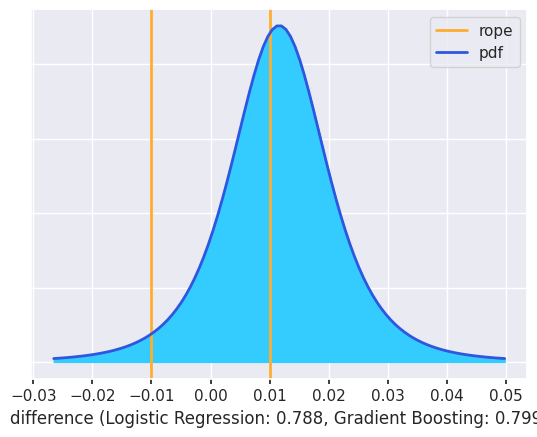

Comparación bayesiana entre Logistic Regression y XGBoost en Accuracy: (0.03966511464355913, 0.5656705653184373, 0.39466432003800356)


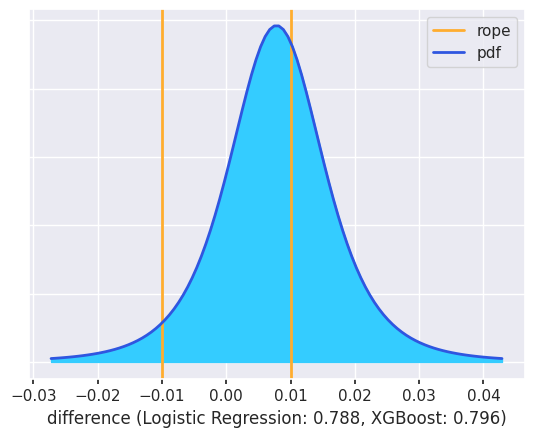

Comparación bayesiana entre Logistic Regression y Support Vector Classifier en Accuracy: (0.19310784766730274, 0.6771125905304265, 0.1297795618022708)


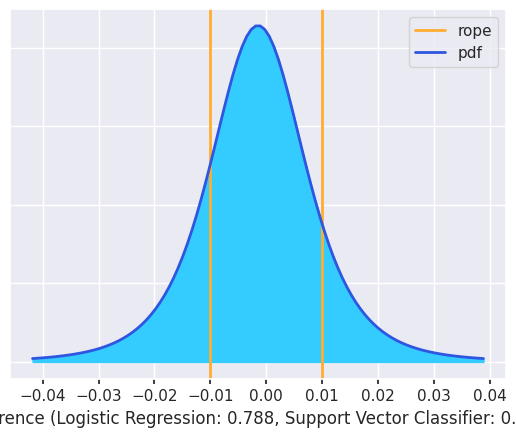

Comparación bayesiana entre Logistic Regression y KNN Classifier en Accuracy: (0.8123773389578794, 0.18012758756716285, 0.007495073474957703)


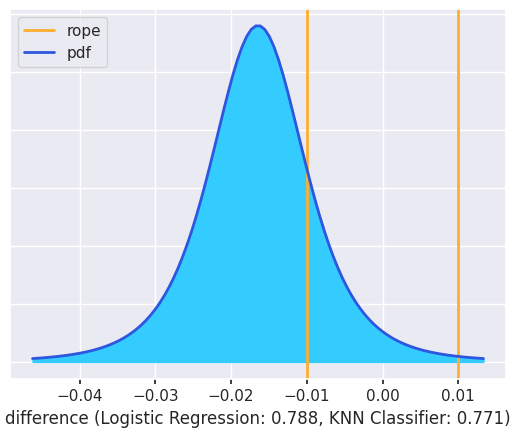

Comparación bayesiana entre Logistic Regression y Decision Tree en Accuracy: (0.9997941611033696, 0.00015673403989990842, 4.910485673048637e-05)


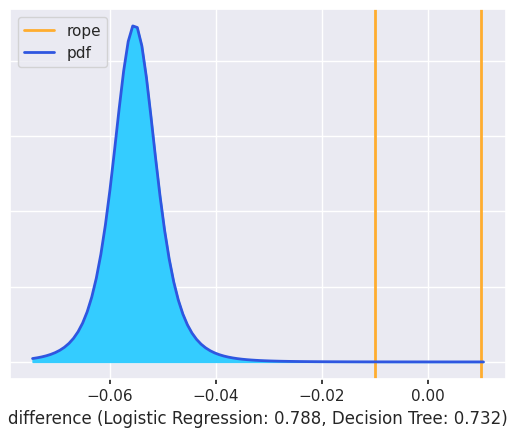

Comparación bayesiana entre Logistic Regression y AdaBoost en Accuracy: (0.03100110013981295, 0.921955308764636, 0.04704359109555101)


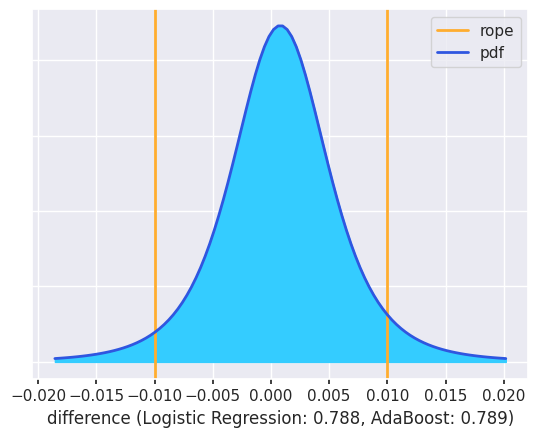

Comparación bayesiana entre Logistic Regression y CatBoost en Accuracy: (0.024055125350684683, 0.30289164182233963, 0.6730532328269757)


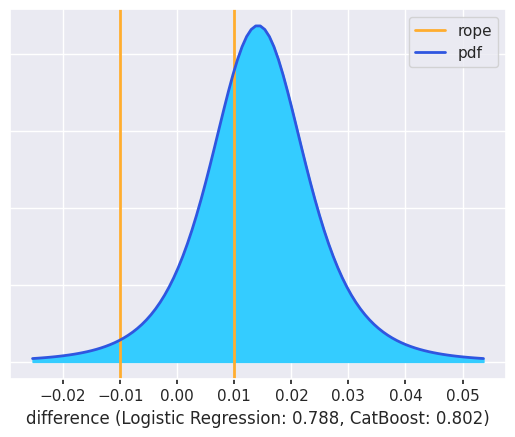

Comparación bayesiana entre Logistic Regression y Extra Trees en Accuracy: (0.8991056897738207, 0.10006766547812174, 0.0008266447480576034)


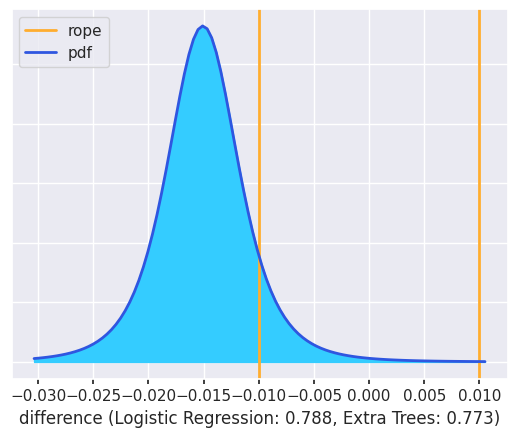

Comparación bayesiana entre Random Forest y Gradient Boosting en Accuracy: (0.007505498667536184, 0.43286356155861094, 0.5596309397738529)


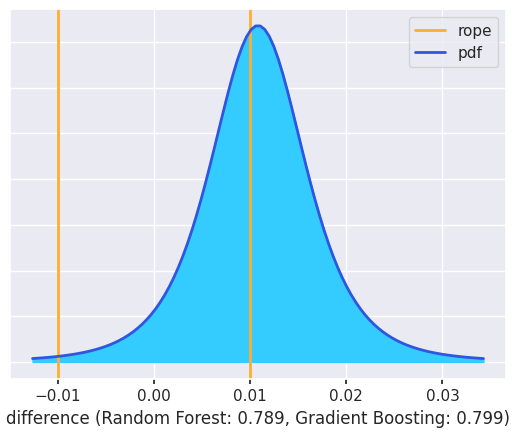

Comparación bayesiana entre Random Forest y XGBoost en Accuracy: (0.009491424995254566, 0.7199206275145408, 0.27058794749020465)


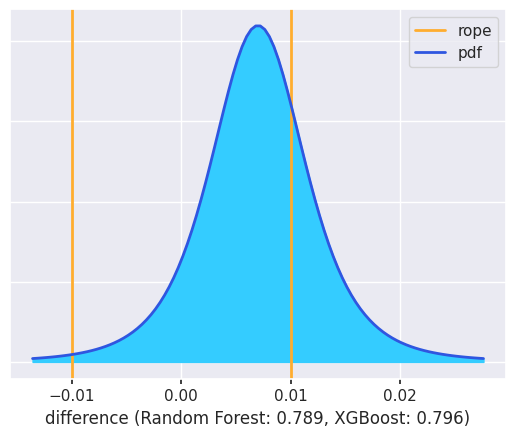

Comparación bayesiana entre Random Forest y Support Vector Classifier en Accuracy: (0.11379684725820784, 0.8435279145723915, 0.042675238169400664)


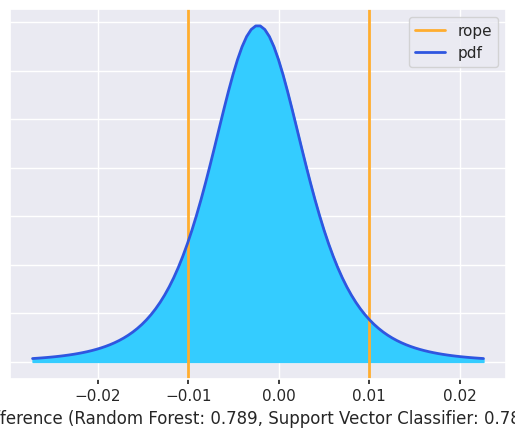

Comparación bayesiana entre Random Forest y KNN Classifier en Accuracy: (0.8141308711219637, 0.1761150018670986, 0.009754127010937697)


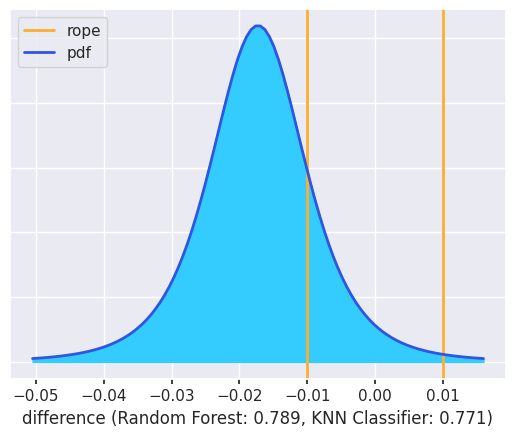

Comparación bayesiana entre Random Forest y Decision Tree en Accuracy: (0.9997584047873732, 0.00018258629126988168, 5.900892135690672e-05)


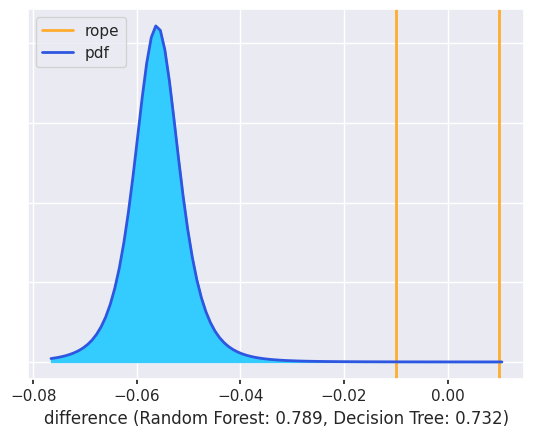

Comparación bayesiana entre Random Forest y AdaBoost en Accuracy: (0.10367411832781605, 0.7926712500454123, 0.10365463162677169)


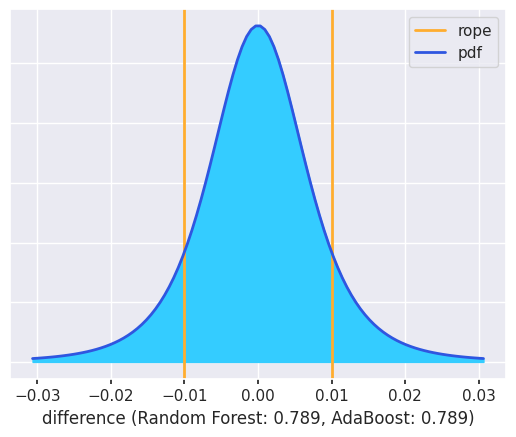

Comparación bayesiana entre Random Forest y CatBoost en Accuracy: (0.0071932372047150035, 0.2853623629045585, 0.7074443998907265)


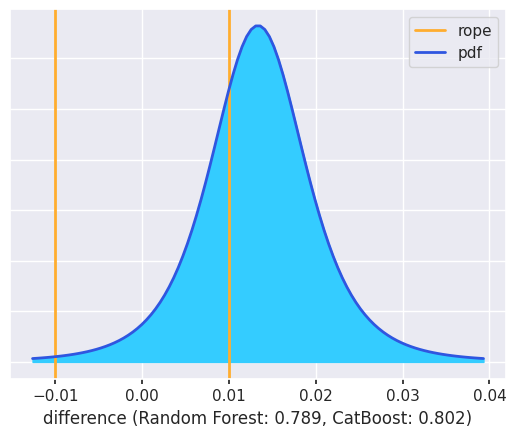

Comparación bayesiana entre Random Forest y Extra Trees en Accuracy: (0.7668801304390902, 0.22113873229683378, 0.011981137264076014)


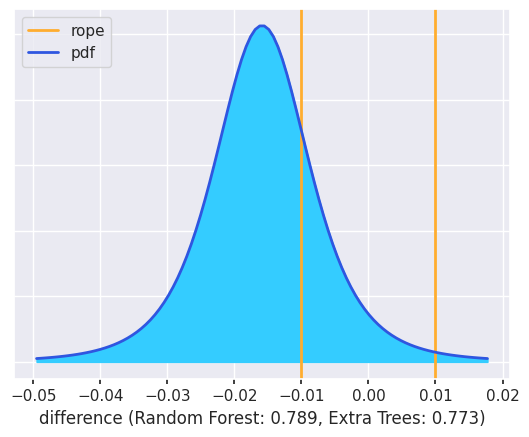

Comparación bayesiana entre Gradient Boosting y XGBoost en Accuracy: (0.04298184059616837, 0.953383706286909, 0.0036344531169225647)


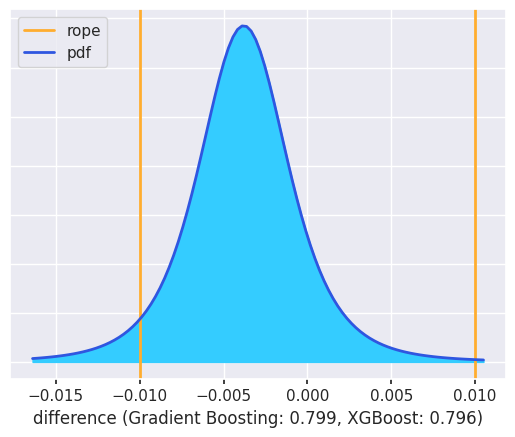

Comparación bayesiana entre Gradient Boosting y Support Vector Classifier en Accuracy: (0.7496059854383519, 0.24770962520296624, 0.0026843893586818712)


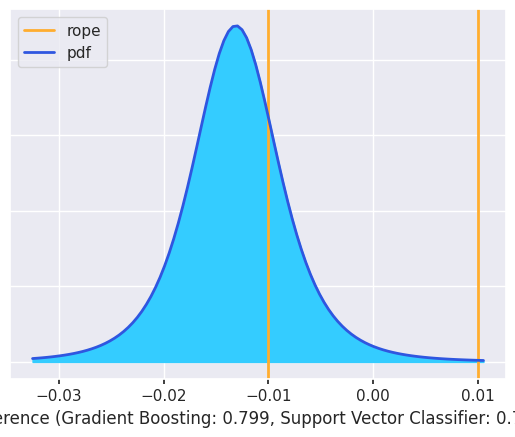

Comparación bayesiana entre Gradient Boosting y KNN Classifier en Accuracy: (0.9724365121627556, 0.025146730100087944, 0.0024167577371564386)


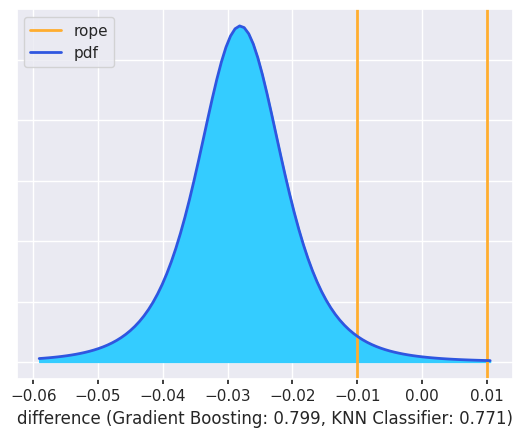

Comparación bayesiana entre Gradient Boosting y Decision Tree en Accuracy: (0.9996493912655551, 0.00024191785843796776, 0.00010869087600695604)


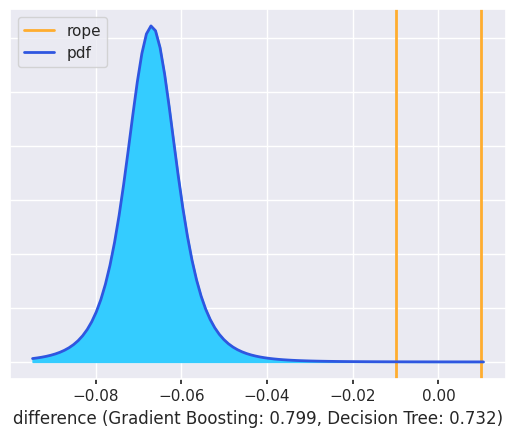

Comparación bayesiana entre Gradient Boosting y AdaBoost en Accuracy: (0.5558812596830759, 0.43477135971563285, 0.009347380601291255)


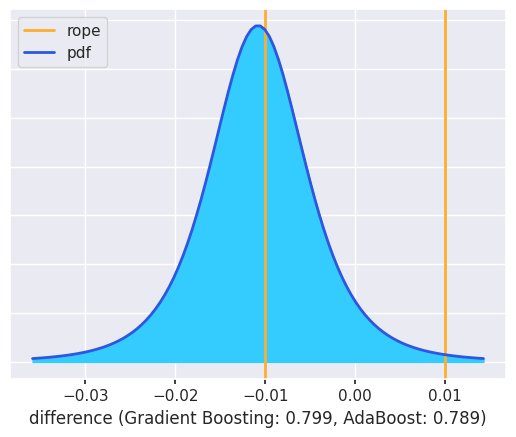

Comparación bayesiana entre Gradient Boosting y CatBoost en Accuracy: (0.025638890409475285, 0.8862425132244685, 0.08811859636605623)


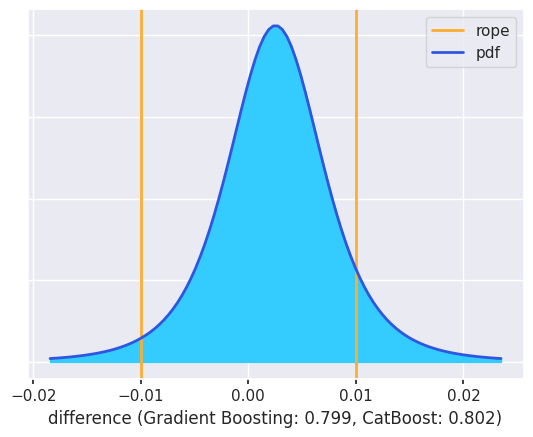

Comparación bayesiana entre Gradient Boosting y Extra Trees en Accuracy: (0.9585152478696437, 0.03788278901509334, 0.0036019631152629517)


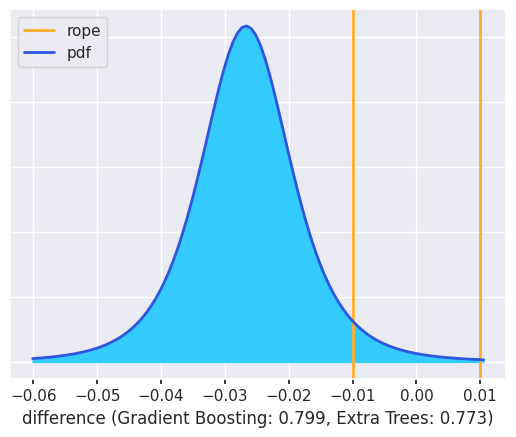

Comparación bayesiana entre XGBoost y Support Vector Classifier en Accuracy: (0.42228211172514696, 0.5756717508471554, 0.0020461374276976585)


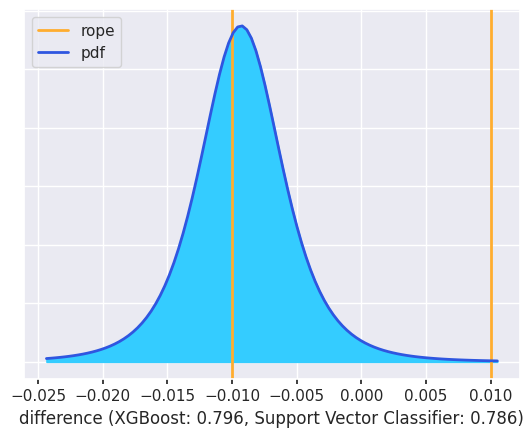

Comparación bayesiana entre XGBoost y KNN Classifier en Accuracy: (0.9318386230796193, 0.06261345085034398, 0.005547926070036735)


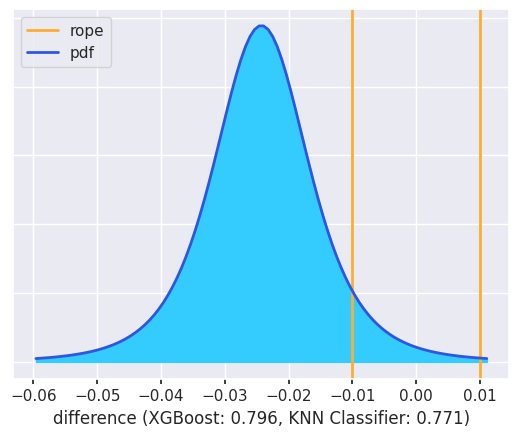

Comparación bayesiana entre XGBoost y Decision Tree en Accuracy: (0.9993981549868162, 0.00042639111940956376, 0.0001754538937742689)


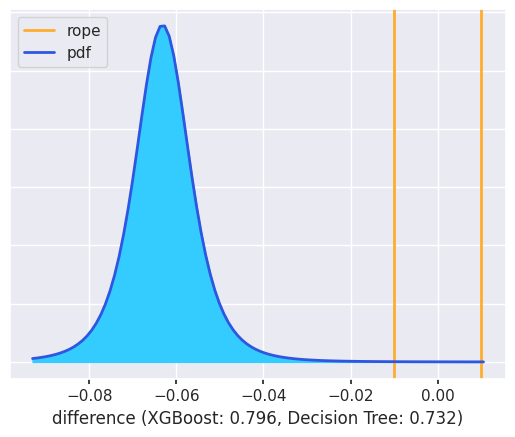

Comparación bayesiana entre XGBoost y AdaBoost en Accuracy: (0.3057563754240362, 0.6768200131383876, 0.017423611437576203)


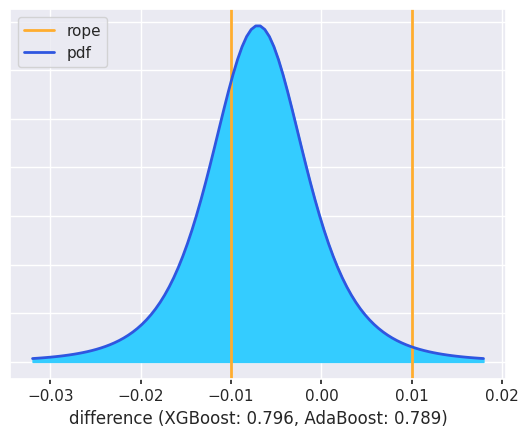

Comparación bayesiana entre XGBoost y CatBoost en Accuracy: (0.0038267730898084943, 0.8331345492683389, 0.16303867764185265)


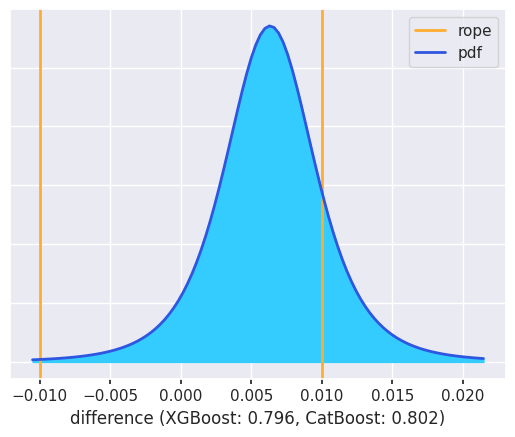

Comparación bayesiana entre XGBoost y Extra Trees en Accuracy: (0.9387680415053152, 0.0574429354439846, 0.0037890230507001688)


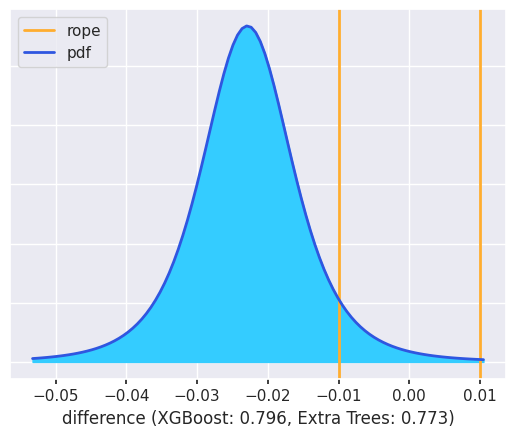

Comparación bayesiana entre Support Vector Classifier y KNN Classifier en Accuracy: (0.7423447695180972, 0.2461707591250326, 0.01148447135687014)


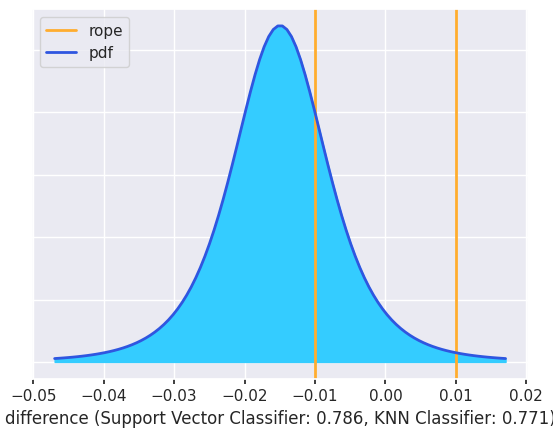

Comparación bayesiana entre Support Vector Classifier y Decision Tree en Accuracy: (0.9973839464074072, 0.0019694941495733698, 0.0006465594430193899)


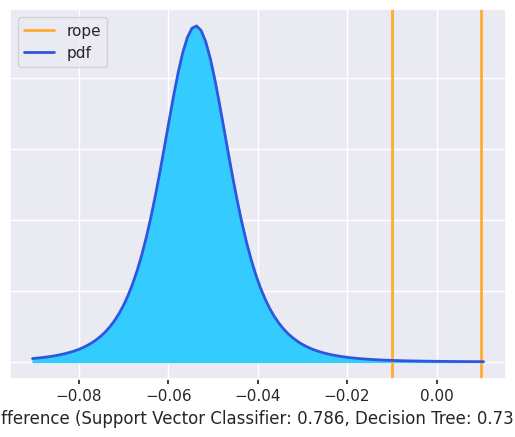

Comparación bayesiana entre Support Vector Classifier y AdaBoost en Accuracy: (0.07370716181629733, 0.7641277974384404, 0.16216504074526228)


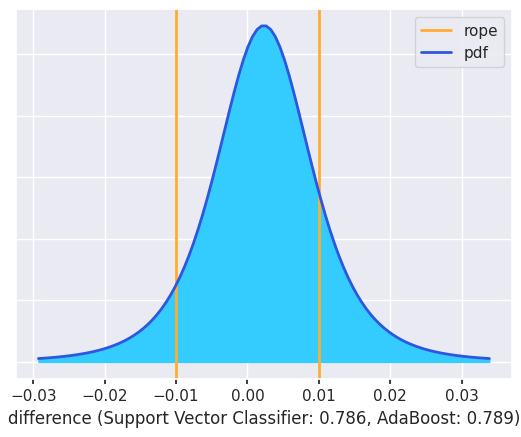

Comparación bayesiana entre Support Vector Classifier y CatBoost en Accuracy: (0.008237622332731813, 0.20732473188222444, 0.7844376457850437)


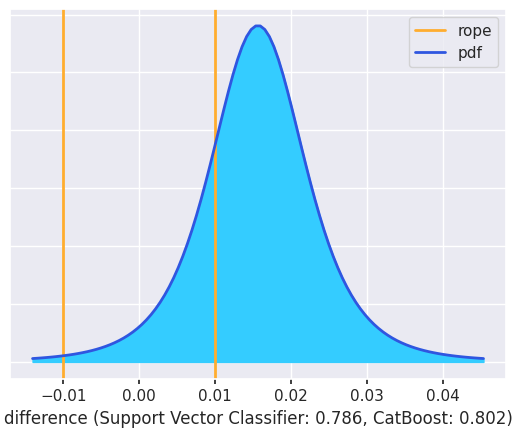

Comparación bayesiana entre Support Vector Classifier y Extra Trees en Accuracy: (0.6512573600205727, 0.323170350187029, 0.02557228979239834)


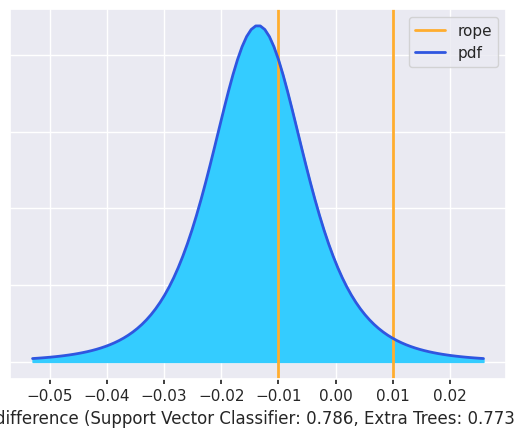

Comparación bayesiana entre KNN Classifier y Decision Tree en Accuracy: (0.99645574369234, 0.0030408283900509314, 0.000503427917609045)


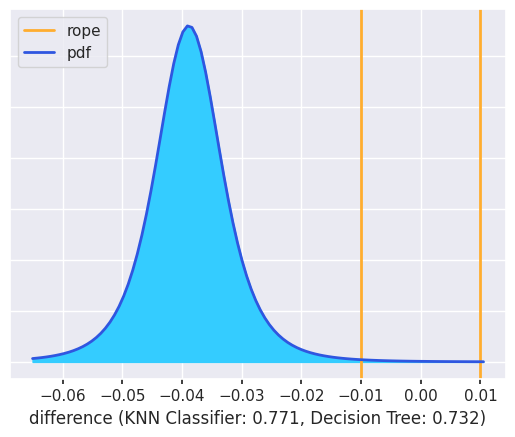

Comparación bayesiana entre KNN Classifier y AdaBoost en Accuracy: (0.003524476523320146, 0.12008238435796215, 0.8763931391187177)


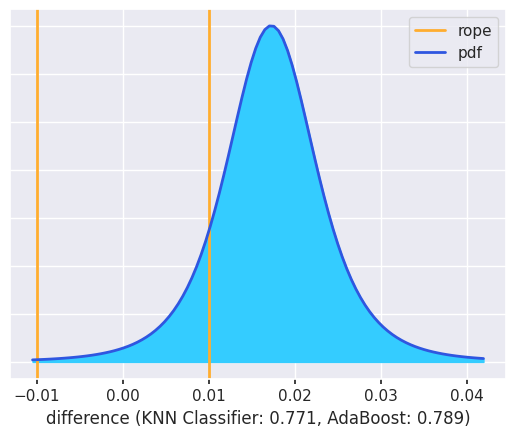

Comparación bayesiana entre KNN Classifier y CatBoost en Accuracy: (0.008100042759075032, 0.04820613869100865, 0.9436938185499163)


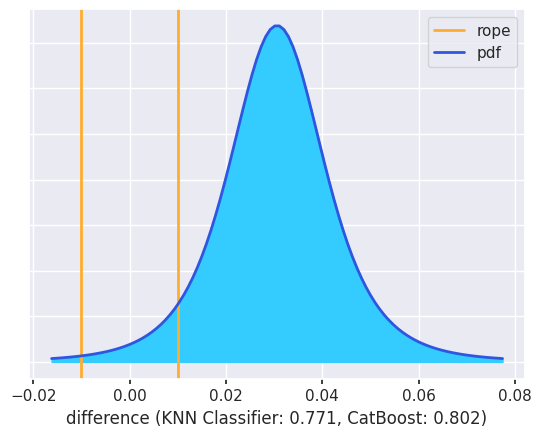

Comparación bayesiana entre KNN Classifier y Extra Trees en Accuracy: (0.1011557041173588, 0.7425132369267452, 0.15633105895589605)


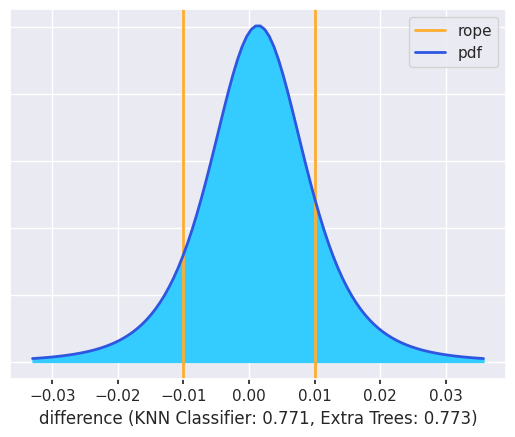

Comparación bayesiana entre Decision Tree y AdaBoost en Accuracy: (6.8832124156997e-05, 0.00021229858578120098, 0.9997188692900618)


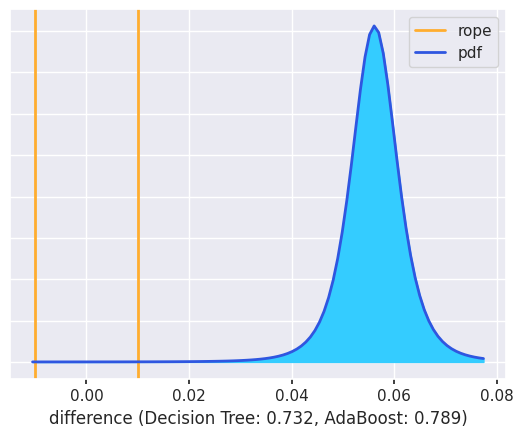

Comparación bayesiana entre Decision Tree y CatBoost en Accuracy: (0.00019047823955177666, 0.0003923456194722119, 0.999417176140976)


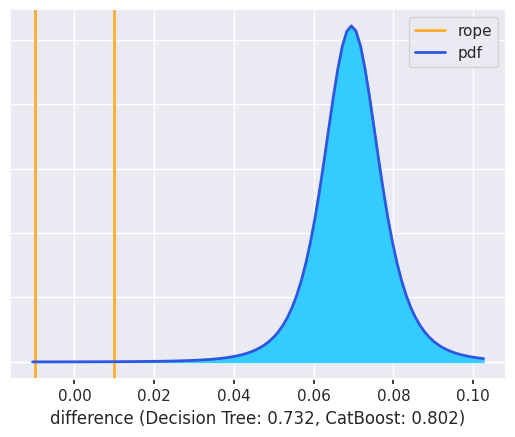

Comparación bayesiana entre Decision Tree y Extra Trees en Accuracy: (0.00029131936000528926, 0.0016919748526809109, 0.9980167057873138)


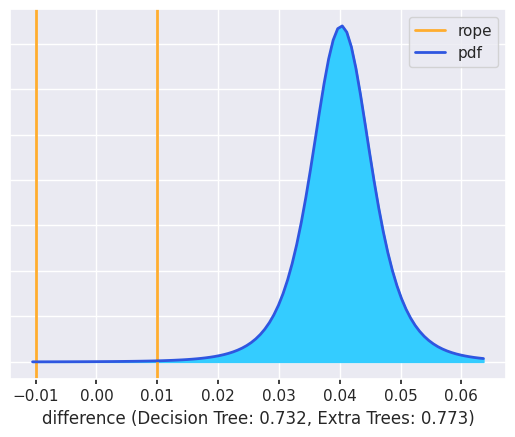

Comparación bayesiana entre AdaBoost y CatBoost en Accuracy: (0.012816358272243606, 0.3098609561093103, 0.6773226856184461)


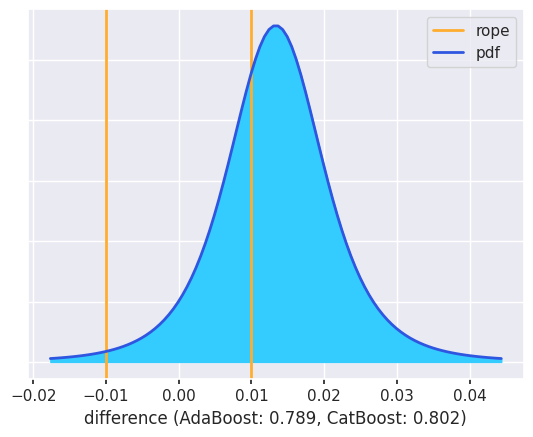

Comparación bayesiana entre AdaBoost y Extra Trees en Accuracy: (0.9554795417790558, 0.04422206327100531, 0.00029839494993888493)


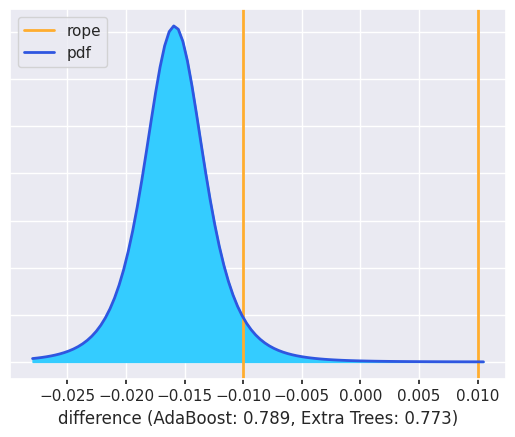

Comparación bayesiana entre CatBoost y Extra Trees en Accuracy: (0.9747500326364724, 0.022826325502840916, 0.002423641860686665)


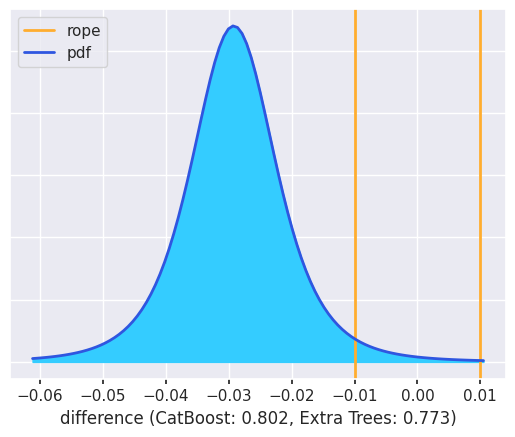

Imágenes guardadas en la carpeta temporal: C:\Users\MANUEL~1\AppData\Local\Temp\tmppw2m71w7
Comparación bayesiana entre Logistic Regression y Random Forest en Precision: (0.12535387385111438, 0.6966391132268559, 0.1780070129220297)


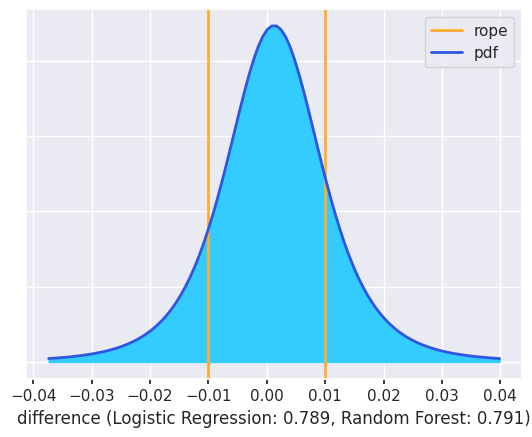

Comparación bayesiana entre Logistic Regression y Gradient Boosting en Precision: (0.02527918394194126, 0.3634052984388213, 0.6113155176192374)


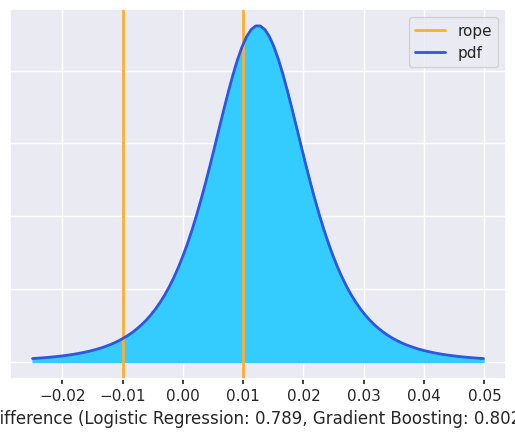

Comparación bayesiana entre Logistic Regression y XGBoost en Precision: (0.05619437355184784, 0.5670984657395043, 0.37670716070864785)


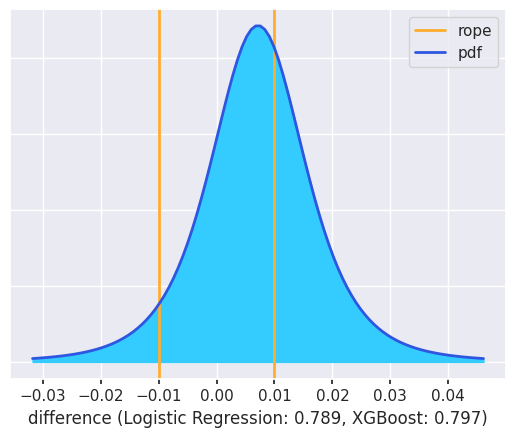

Comparación bayesiana entre Logistic Regression y Support Vector Classifier en Precision: (0.05146631936640139, 0.565735915037319, 0.38279776559627965)


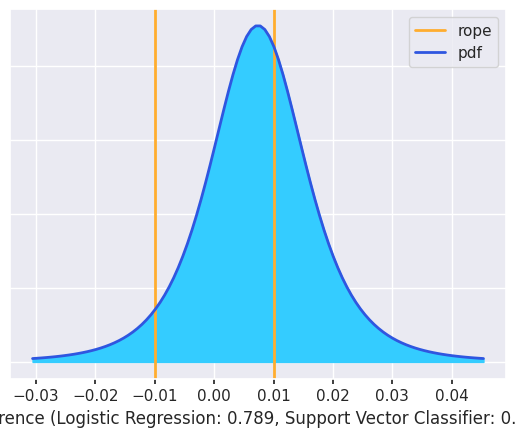

Comparación bayesiana entre Logistic Regression y KNN Classifier en Precision: (0.855211223407377, 0.1396035062845593, 0.005185270308063705)


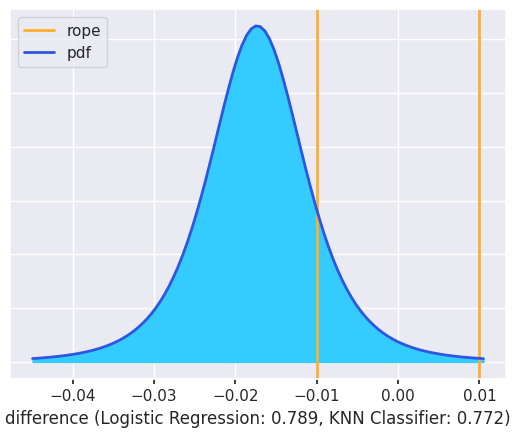

Comparación bayesiana entre Logistic Regression y Decision Tree en Precision: (0.9997779815066913, 0.0001674879198875212, 5.453057342119649e-05)


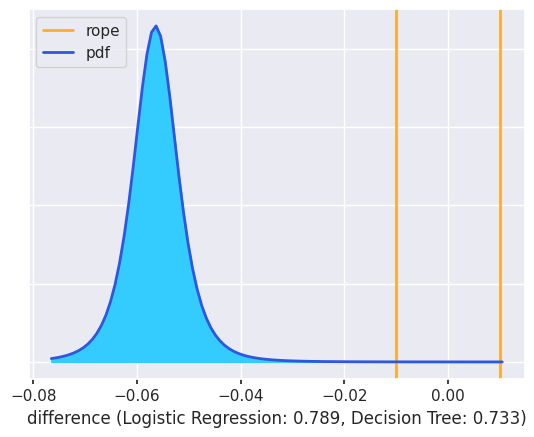

Comparación bayesiana entre Logistic Regression y AdaBoost en Precision: (0.024266564656140747, 0.9274034669935312, 0.0483299683503281)


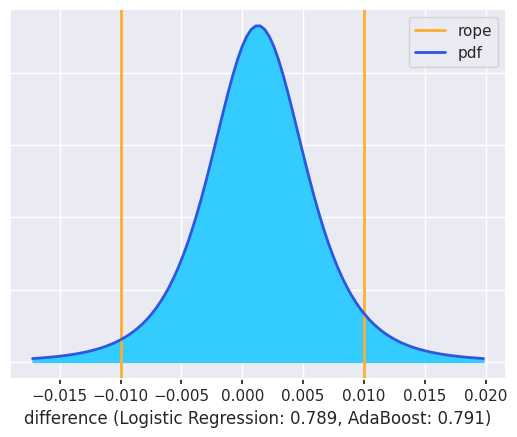

Comparación bayesiana entre Logistic Regression y CatBoost en Precision: (0.026574393424813082, 0.31157116122579365, 0.6618544453493933)


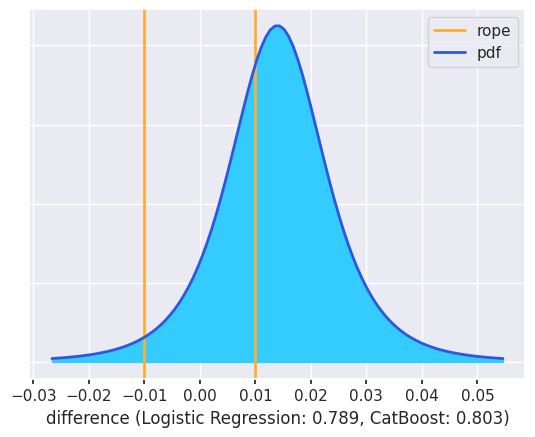

Comparación bayesiana entre Logistic Regression y Extra Trees en Precision: (0.7636780430317884, 0.23215337255122903, 0.004168584416982535)


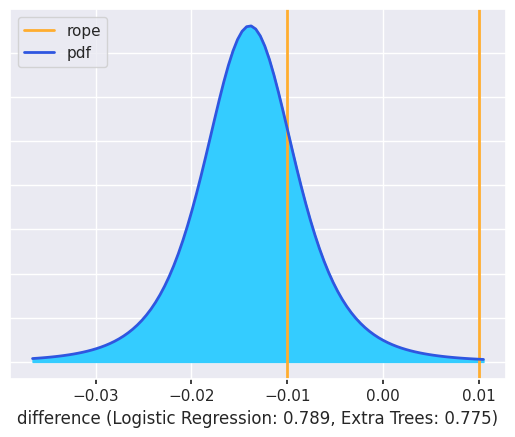

Comparación bayesiana entre Random Forest y Gradient Boosting en Precision: (0.016653761922878013, 0.4161368677589954, 0.5672093703181266)


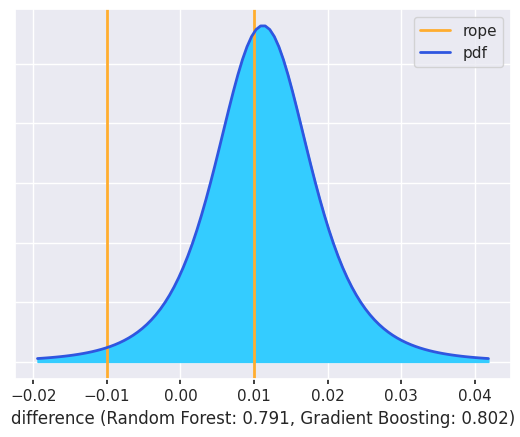

Comparación bayesiana entre Random Forest y XGBoost en Precision: (0.011568549777613095, 0.7845089363244437, 0.20392251389794314)


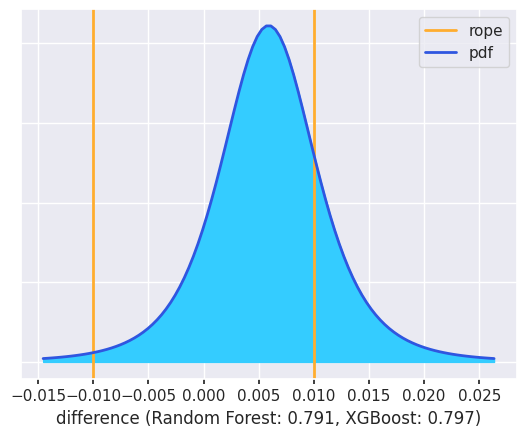

Comparación bayesiana entre Random Forest y Support Vector Classifier en Precision: (0.05008743507224894, 0.6327311281812732, 0.3171814367464779)


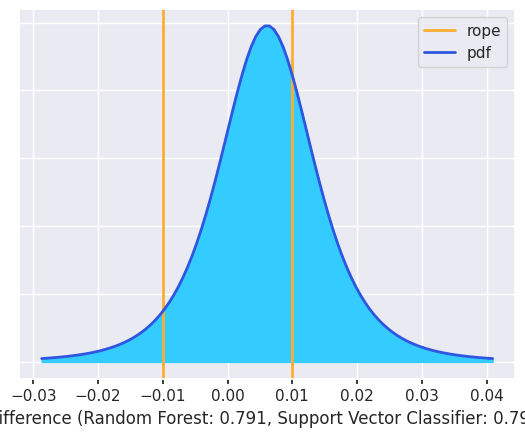

Comparación bayesiana entre Random Forest y KNN Classifier en Precision: (0.8184191073486474, 0.16817709380685397, 0.013403798844498604)


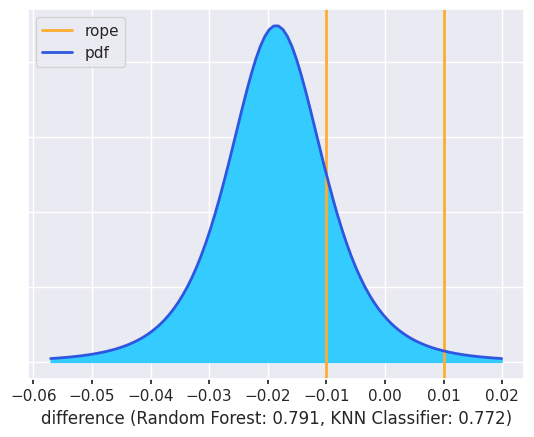

Comparación bayesiana entre Random Forest y Decision Tree en Precision: (0.9993139567961168, 0.0005082728530744207, 0.00017777035080879244)


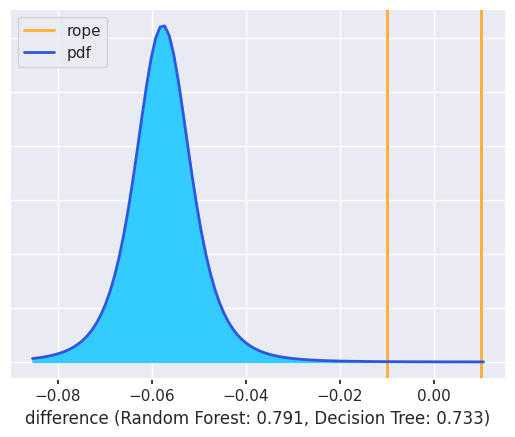

Comparación bayesiana entre Random Forest y AdaBoost en Precision: (0.1529964379703715, 0.6923407234455126, 0.154662838584116)


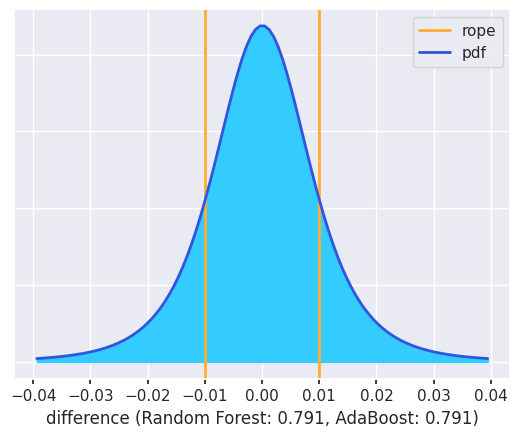

Comparación bayesiana entre Random Forest y CatBoost en Precision: (0.004534079307656855, 0.29657892507770545, 0.6988869956146377)


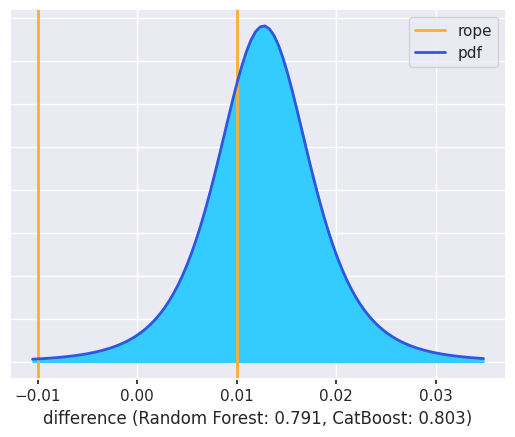

Comparación bayesiana entre Random Forest y Extra Trees en Precision: (0.7499314800266754, 0.23879849765737138, 0.011270022315953199)


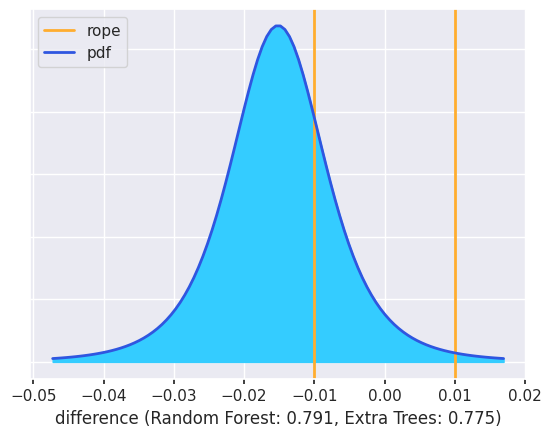

Comparación bayesiana entre Gradient Boosting y XGBoost en Precision: (0.15318013157574037, 0.8373956147554579, 0.00942425366880173)


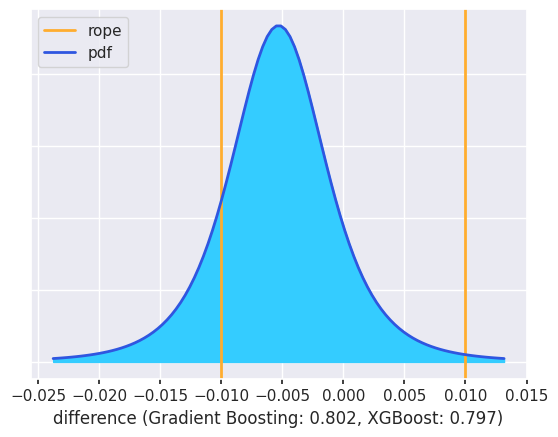

Comparación bayesiana entre Gradient Boosting y Support Vector Classifier en Precision: (0.17385327219667618, 0.8106769892420602, 0.015469738561263657)


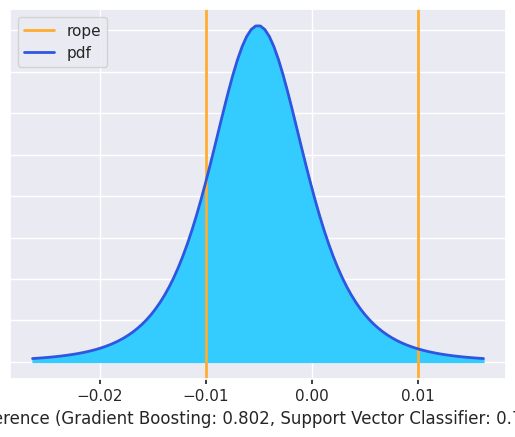

Comparación bayesiana entre Gradient Boosting y KNN Classifier en Precision: (0.9894592491455595, 0.00965881906960564, 0.0008819317848348662)


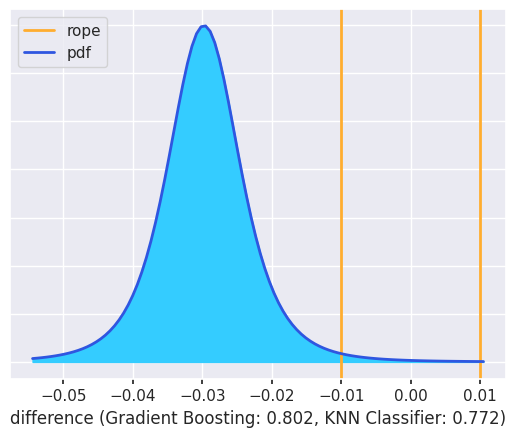

Comparación bayesiana entre Gradient Boosting y Decision Tree en Precision: (0.9998081955110075, 0.00013085066346507634, 6.095382552739892e-05)


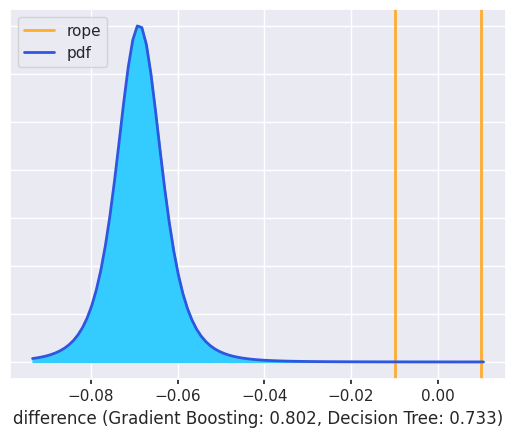

Comparación bayesiana entre Gradient Boosting y AdaBoost en Precision: (0.5824085250455913, 0.40983846876615626, 0.007753006188252476)


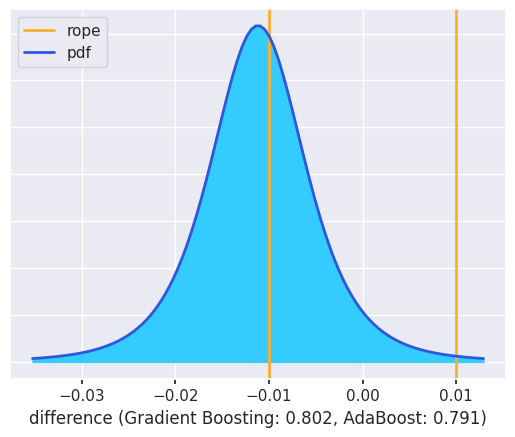

Comparación bayesiana entre Gradient Boosting y CatBoost en Precision: (0.04444757502460266, 0.8684444451524703, 0.08710797982292706)


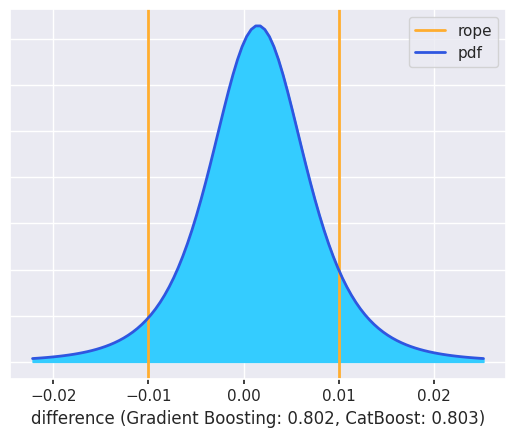

Comparación bayesiana entre Gradient Boosting y Extra Trees en Precision: (0.9607429465302256, 0.03604987892026024, 0.0032071745495141357)


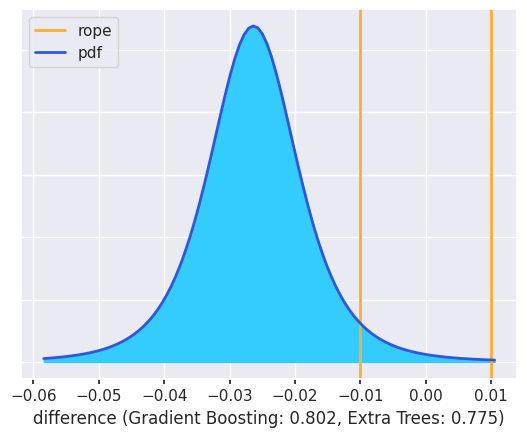

Comparación bayesiana entre XGBoost y Support Vector Classifier en Precision: (0.07794929049190152, 0.8371395524978107, 0.08491115701028784)


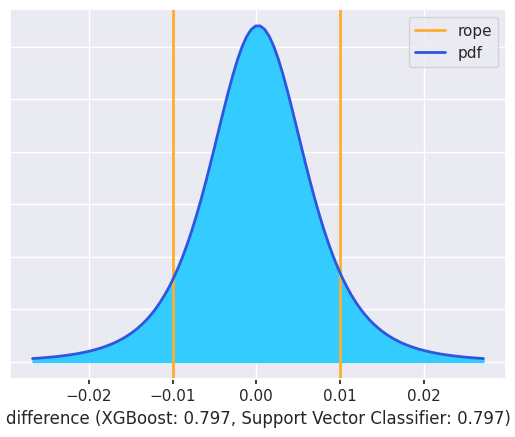

Comparación bayesiana entre XGBoost y KNN Classifier en Precision: (0.9393773740243881, 0.05588131744162961, 0.004741308533982247)


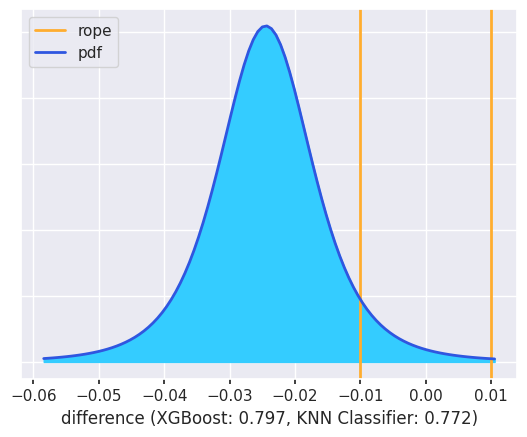

Comparación bayesiana entre XGBoost y Decision Tree en Precision: (0.9993960468035215, 0.0004264508065137118, 0.00017750238996483425)


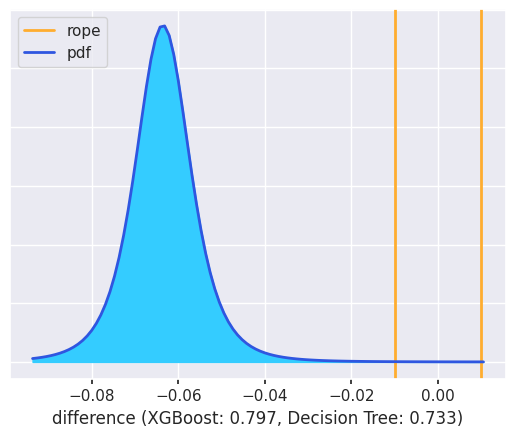

Comparación bayesiana entre XGBoost y AdaBoost en Precision: (0.2855869164387649, 0.6755632582547136, 0.03884982530652148)


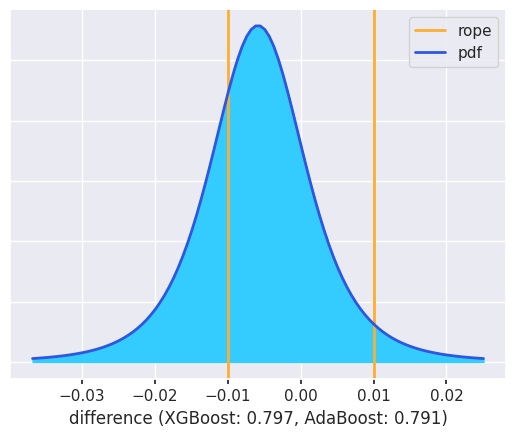

Comparación bayesiana entre XGBoost y CatBoost en Precision: (0.002519723773699294, 0.8229298305423325, 0.17455044568396827)


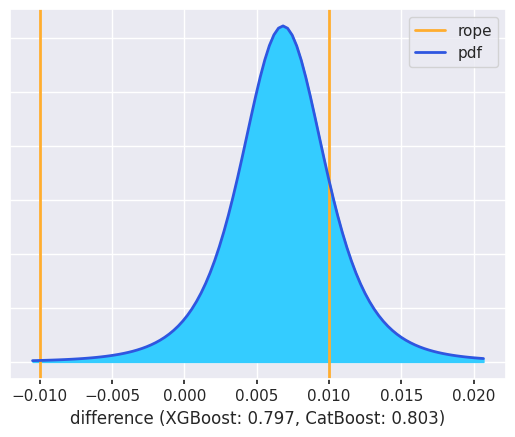

Comparación bayesiana entre XGBoost y Extra Trees en Precision: (0.9351696097267399, 0.06188213724291691, 0.002948253030343184)


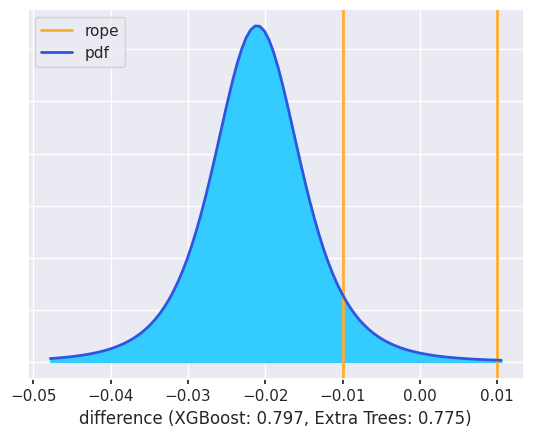

Comparación bayesiana entre Support Vector Classifier y KNN Classifier en Precision: (0.9943986432901475, 0.005370898241913613, 0.0002304584679388988)


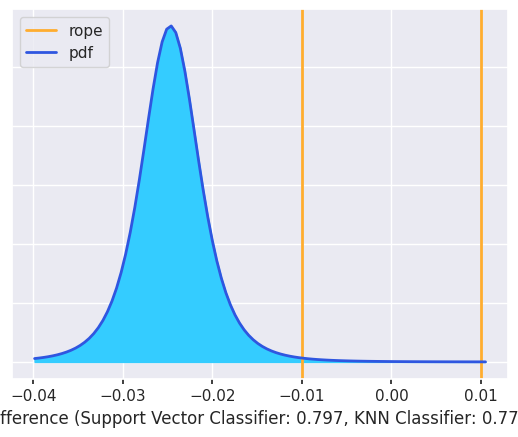

Comparación bayesiana entre Support Vector Classifier y Decision Tree en Precision: (0.999255811423606, 0.0005234601965879992, 0.00022072837980602333)


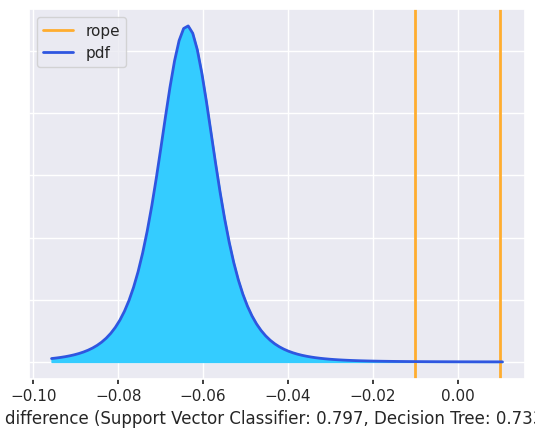

Comparación bayesiana entre Support Vector Classifier y AdaBoost en Precision: (0.27764271546882224, 0.6933047250459036, 0.029052559485274188)


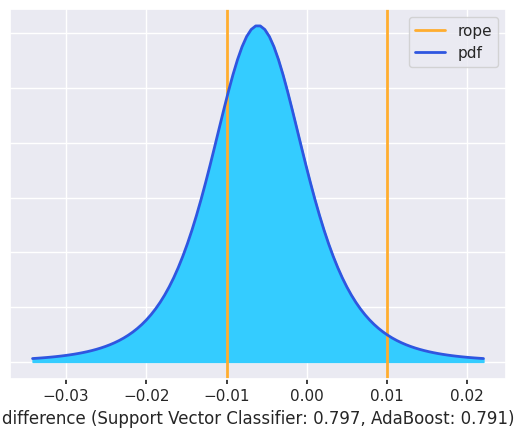

Comparación bayesiana entre Support Vector Classifier y CatBoost en Precision: (0.059258902405132666, 0.588100988295932, 0.3526401092989353)


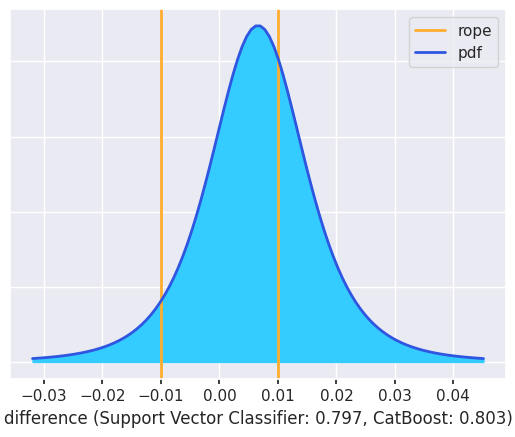

Comparación bayesiana entre Support Vector Classifier y Extra Trees en Precision: (0.8635195060509082, 0.12429068435647728, 0.012189809592614509)


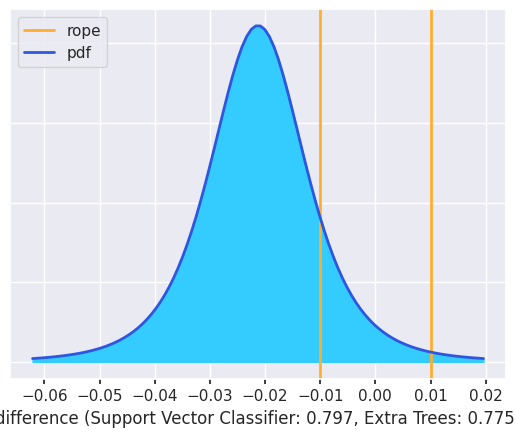

Comparación bayesiana entre KNN Classifier y Decision Tree en Precision: (0.9973774774392848, 0.002253902460883195, 0.0003686200998319622)


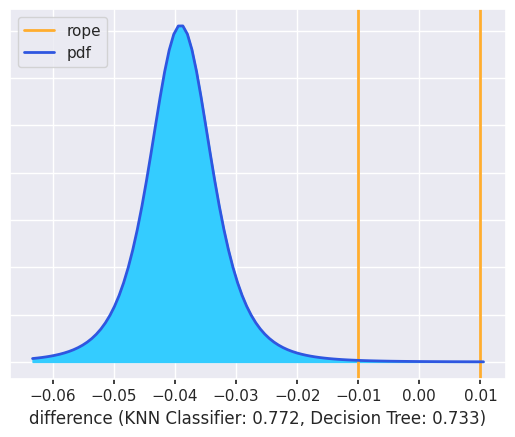

Comparación bayesiana entre KNN Classifier y AdaBoost en Precision: (0.0013550859770354842, 0.05738465858777031, 0.9412602554351942)


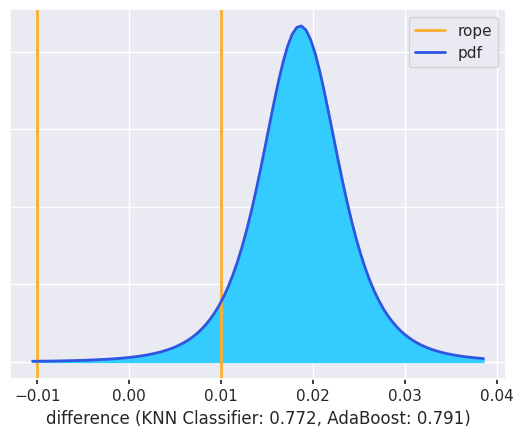

Comparación bayesiana entre KNN Classifier y CatBoost en Precision: (0.005359889932095585, 0.03493996289910262, 0.9597001471688018)


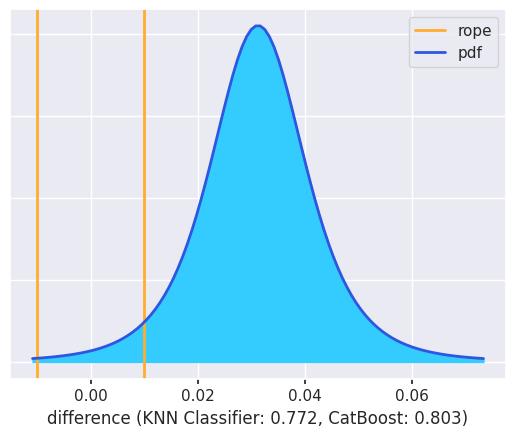

Comparación bayesiana entre KNN Classifier y Extra Trees en Precision: (0.08824655757455933, 0.6790155606381306, 0.23273788178731003)


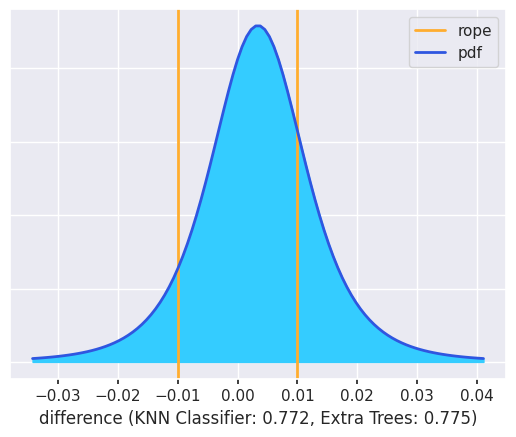

Comparación bayesiana entre Decision Tree y AdaBoost en Precision: (5.62121419117524e-05, 0.0001653669930274937, 0.9997784208650607)


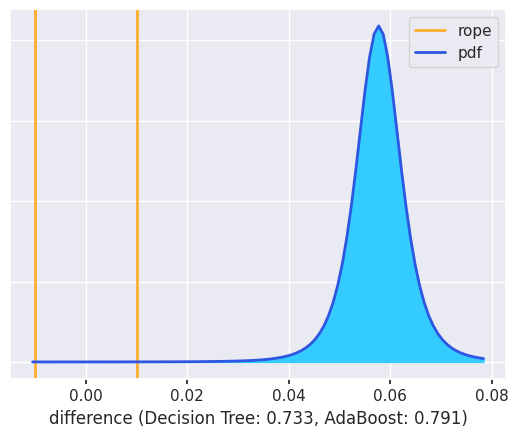

Comparación bayesiana entre Decision Tree y CatBoost en Precision: (0.00012122073043785821, 0.00024744005218602094, 0.9996313392173761)


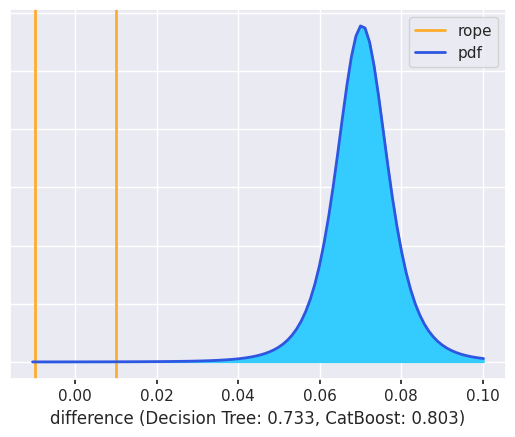

Comparación bayesiana entre Decision Tree y Extra Trees en Precision: (0.0003274172611667886, 0.0016735421694543673, 0.9979990405693788)


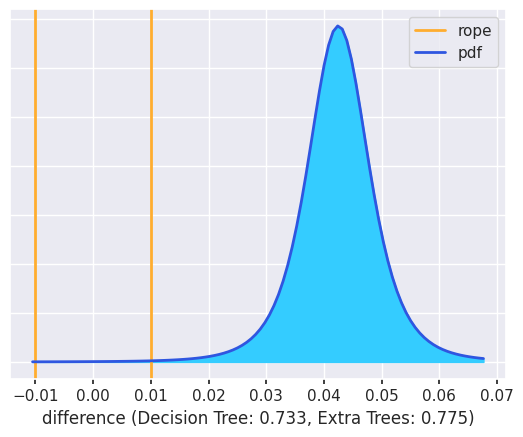

Comparación bayesiana entre AdaBoost y CatBoost en Precision: (0.019527296263057936, 0.3503676002655185, 0.6301051034714236)


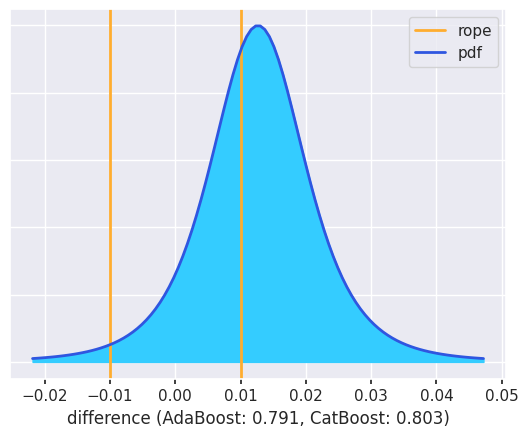

Comparación bayesiana entre AdaBoost y Extra Trees en Precision: (0.8256653345680136, 0.1709406751779292, 0.0033939902540571776)


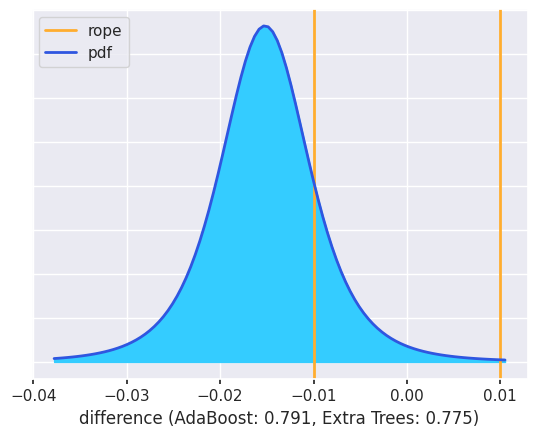

Comparación bayesiana entre CatBoost y Extra Trees en Precision: (0.9868665001952482, 0.012193723711537041, 0.000939776093214717)


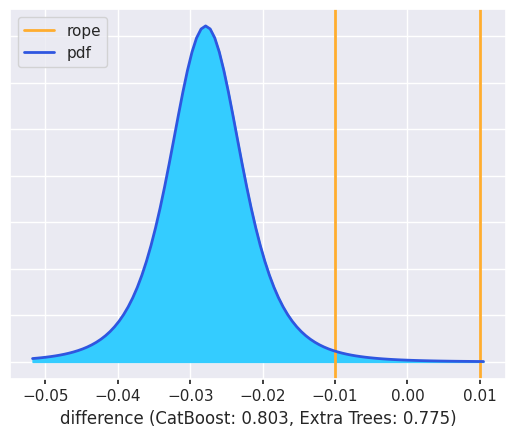

Imágenes guardadas en la carpeta temporal: C:\Users\MANUEL~1\AppData\Local\Temp\tmp8isyjhx7
Comparación bayesiana entre Logistic Regression y Random Forest en Recall: (0.08604488573916723, 0.7986691369221687, 0.11528597733866408)


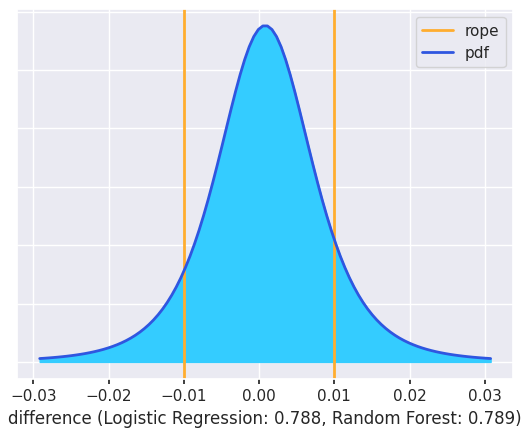

Comparación bayesiana entre Logistic Regression y Gradient Boosting en Recall: (0.029764022296266943, 0.39748954825537897, 0.5727464294483541)


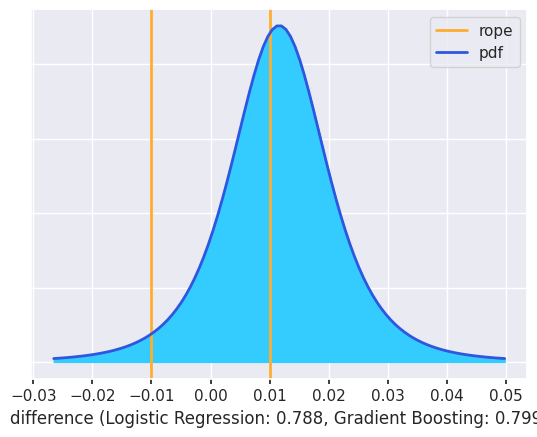

Comparación bayesiana entre Logistic Regression y XGBoost en Recall: (0.03966511464355913, 0.5656705653184373, 0.39466432003800356)


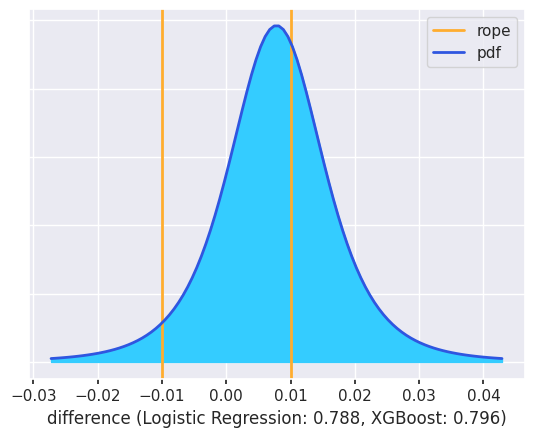

Comparación bayesiana entre Logistic Regression y Support Vector Classifier en Recall: (0.19310784766730274, 0.6771125905304265, 0.1297795618022708)


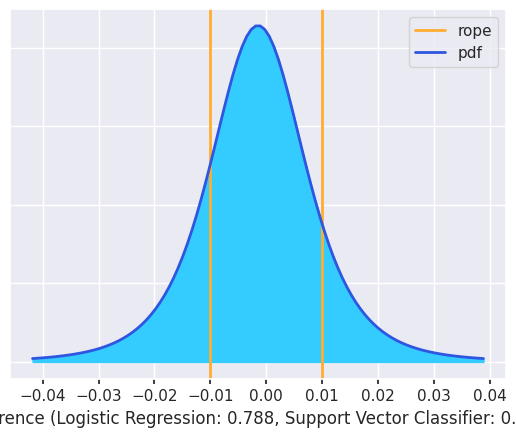

Comparación bayesiana entre Logistic Regression y KNN Classifier en Recall: (0.8123773389578794, 0.18012758756716285, 0.007495073474957703)


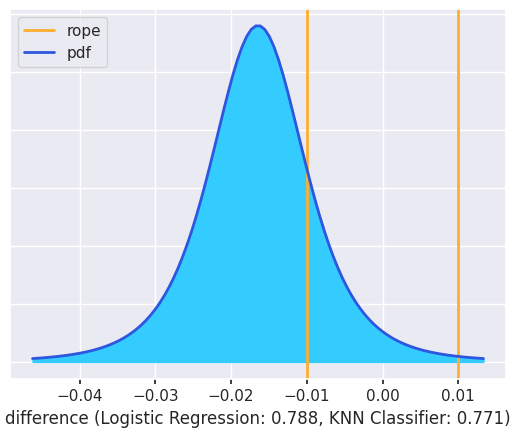

Comparación bayesiana entre Logistic Regression y Decision Tree en Recall: (0.9997941611033696, 0.00015673403989990842, 4.910485673048637e-05)


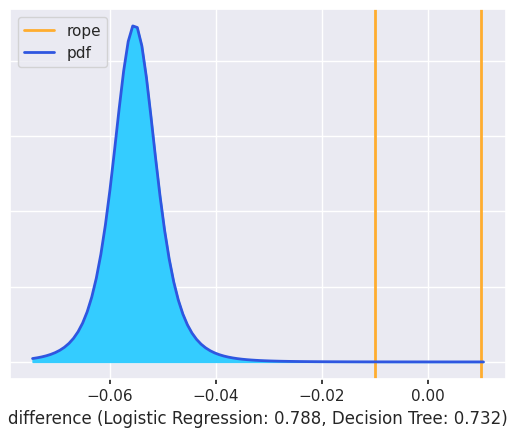

Comparación bayesiana entre Logistic Regression y AdaBoost en Recall: (0.03100110013981295, 0.921955308764636, 0.04704359109555101)


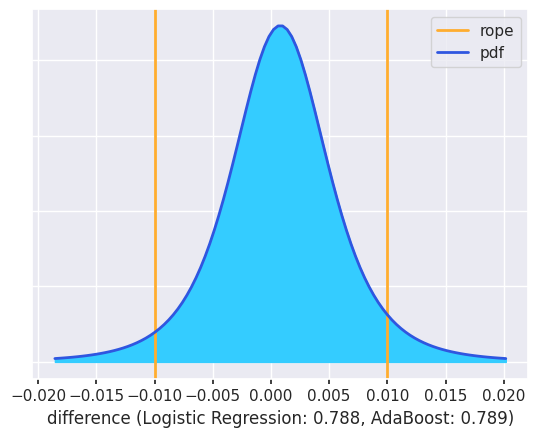

Comparación bayesiana entre Logistic Regression y CatBoost en Recall: (0.024055125350684683, 0.30289164182233963, 0.6730532328269757)


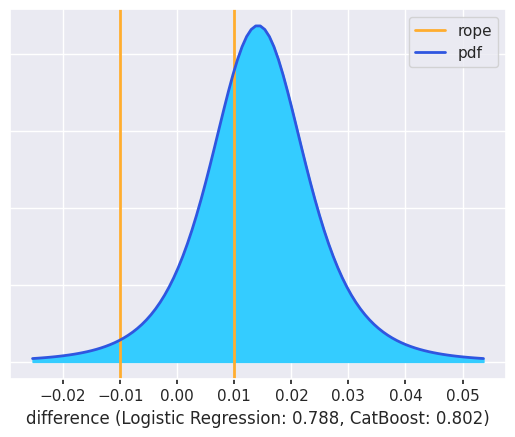

Comparación bayesiana entre Logistic Regression y Extra Trees en Recall: (0.8991056897738207, 0.10006766547812174, 0.0008266447480576034)


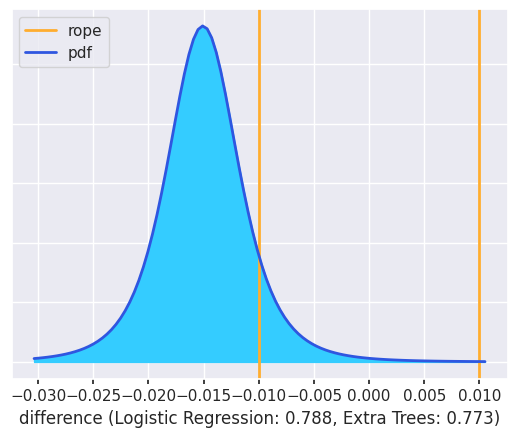

Comparación bayesiana entre Random Forest y Gradient Boosting en Recall: (0.007505498667536184, 0.43286356155861094, 0.5596309397738529)


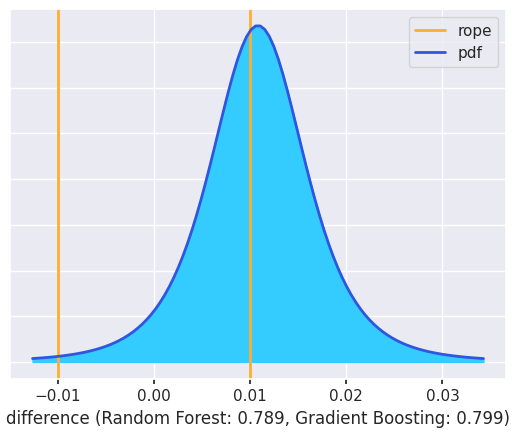

Comparación bayesiana entre Random Forest y XGBoost en Recall: (0.009491424995254566, 0.7199206275145408, 0.27058794749020465)


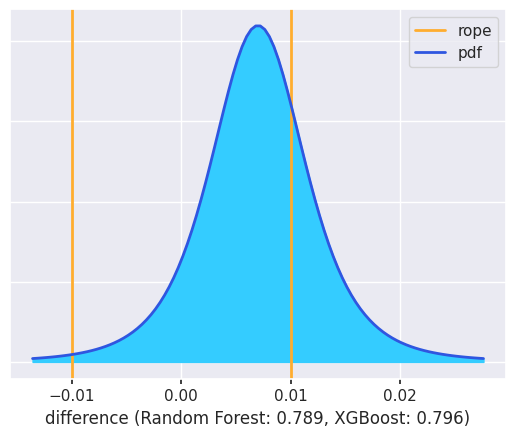

Comparación bayesiana entre Random Forest y Support Vector Classifier en Recall: (0.11379684725820784, 0.8435279145723915, 0.042675238169400664)


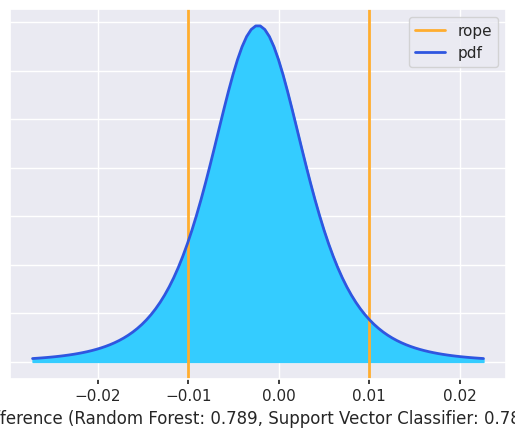

Comparación bayesiana entre Random Forest y KNN Classifier en Recall: (0.8141308711219637, 0.1761150018670986, 0.009754127010937697)


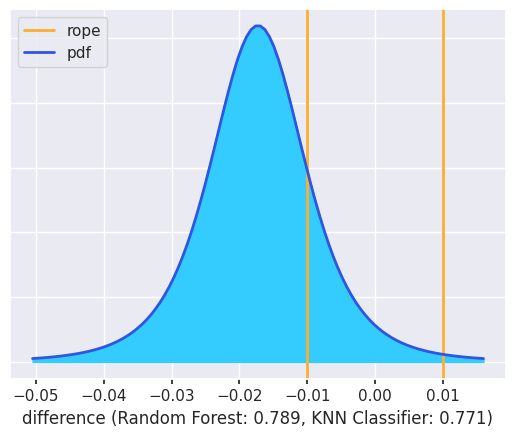

Comparación bayesiana entre Random Forest y Decision Tree en Recall: (0.9997584047873732, 0.00018258629126988168, 5.900892135690672e-05)


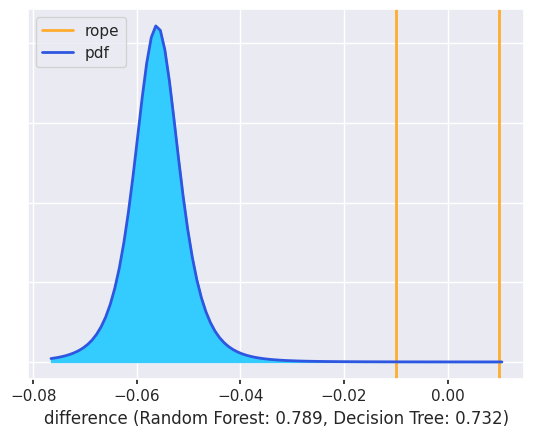

Comparación bayesiana entre Random Forest y AdaBoost en Recall: (0.10367411832781605, 0.7926712500454123, 0.10365463162677169)


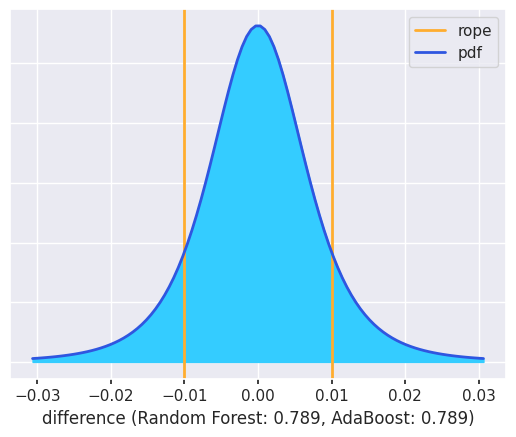

Comparación bayesiana entre Random Forest y CatBoost en Recall: (0.0071932372047150035, 0.2853623629045585, 0.7074443998907265)


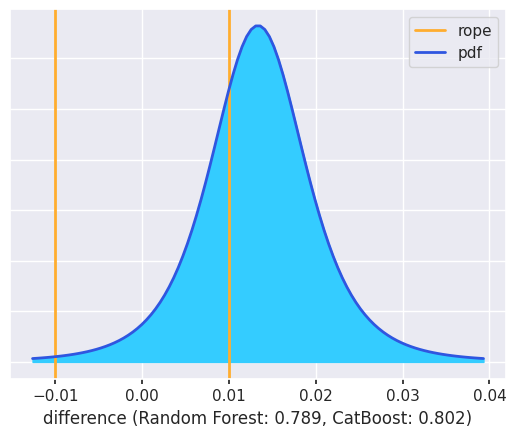

Comparación bayesiana entre Random Forest y Extra Trees en Recall: (0.7668801304390902, 0.22113873229683378, 0.011981137264076014)


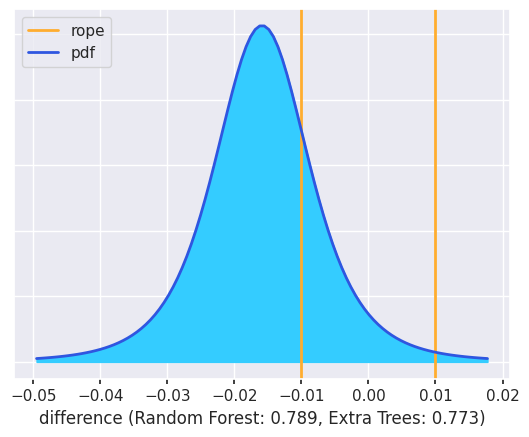

Comparación bayesiana entre Gradient Boosting y XGBoost en Recall: (0.04298184059616837, 0.953383706286909, 0.0036344531169225647)


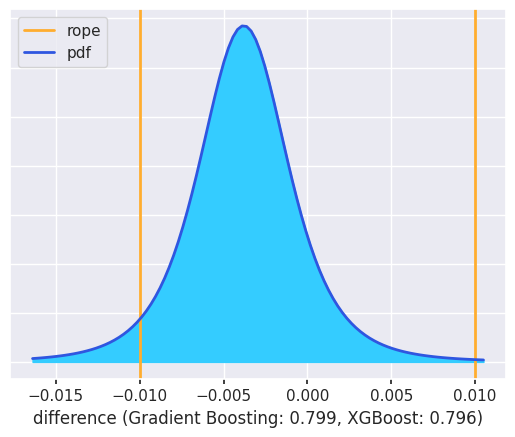

Comparación bayesiana entre Gradient Boosting y Support Vector Classifier en Recall: (0.7496059854383519, 0.24770962520296624, 0.0026843893586818712)


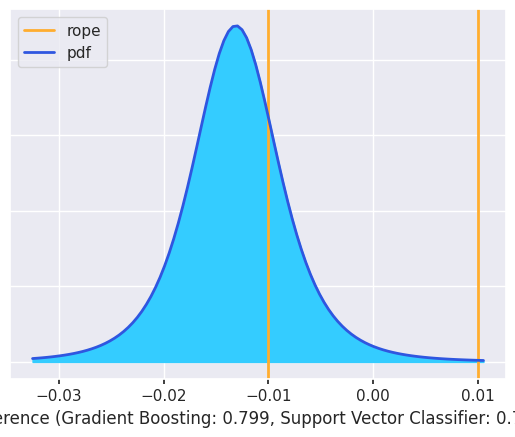

Comparación bayesiana entre Gradient Boosting y KNN Classifier en Recall: (0.9724365121627556, 0.025146730100087944, 0.0024167577371564386)


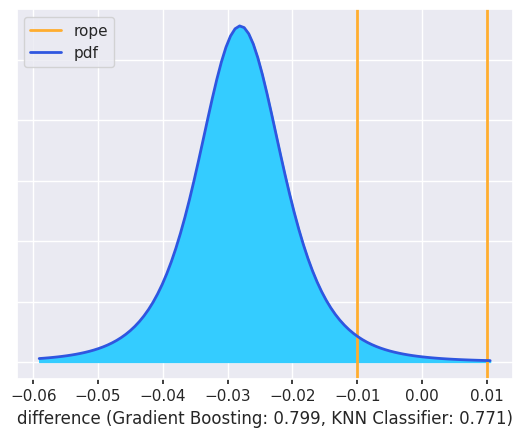

Comparación bayesiana entre Gradient Boosting y Decision Tree en Recall: (0.9996493912655551, 0.00024191785843796776, 0.00010869087600695604)


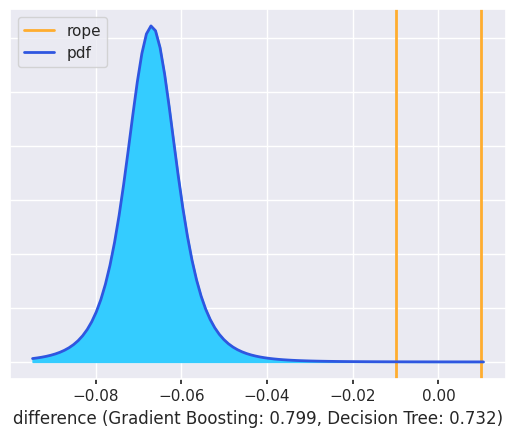

Comparación bayesiana entre Gradient Boosting y AdaBoost en Recall: (0.5558812596830759, 0.43477135971563285, 0.009347380601291255)


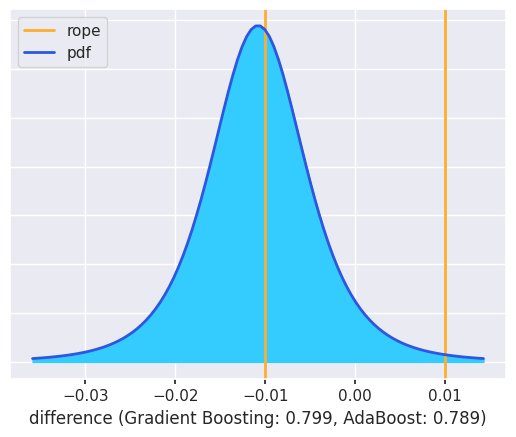

Comparación bayesiana entre Gradient Boosting y CatBoost en Recall: (0.025638890409475285, 0.8862425132244685, 0.08811859636605623)


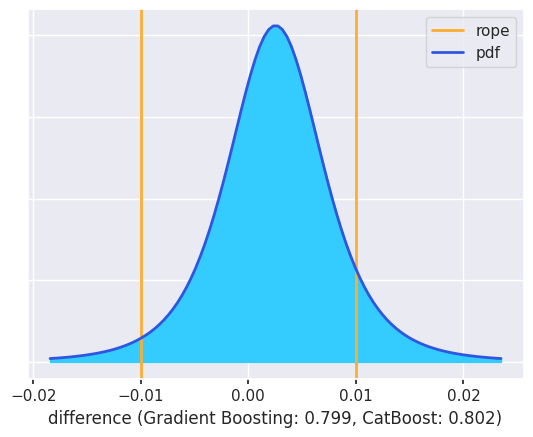

Comparación bayesiana entre Gradient Boosting y Extra Trees en Recall: (0.9585152478696437, 0.03788278901509334, 0.0036019631152629517)


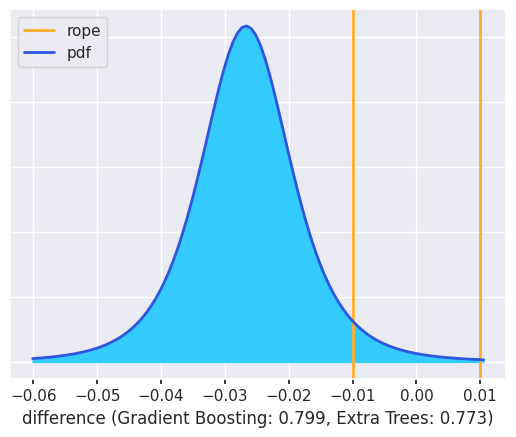

Comparación bayesiana entre XGBoost y Support Vector Classifier en Recall: (0.42228211172514696, 0.5756717508471554, 0.0020461374276976585)


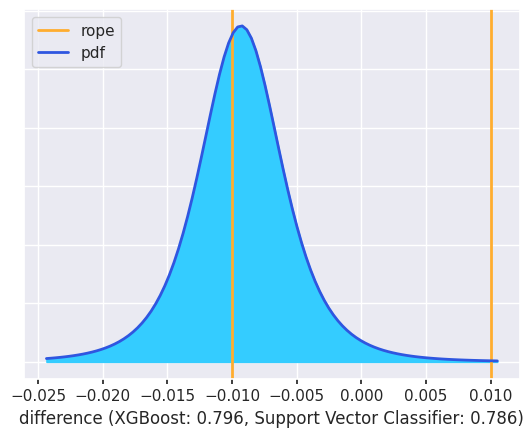

Comparación bayesiana entre XGBoost y KNN Classifier en Recall: (0.9318386230796193, 0.06261345085034398, 0.005547926070036735)


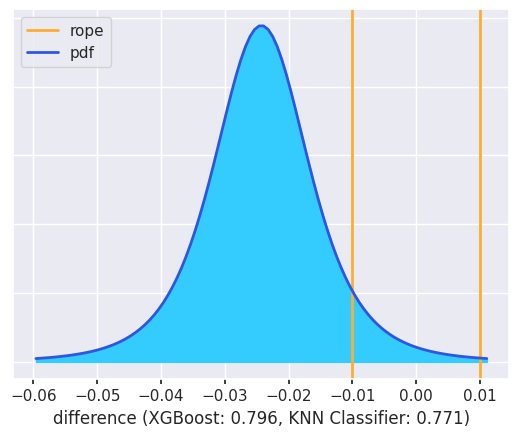

Comparación bayesiana entre XGBoost y Decision Tree en Recall: (0.9993981549868162, 0.00042639111940956376, 0.0001754538937742689)


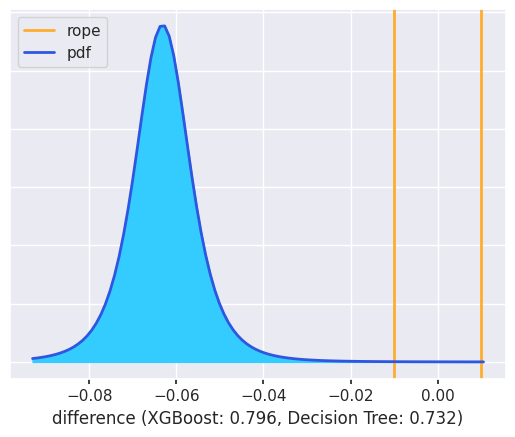

Comparación bayesiana entre XGBoost y AdaBoost en Recall: (0.3057563754240362, 0.6768200131383876, 0.017423611437576203)


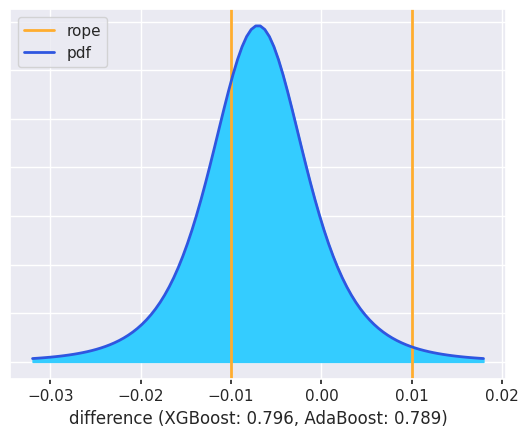

Comparación bayesiana entre XGBoost y CatBoost en Recall: (0.0038267730898084943, 0.8331345492683389, 0.16303867764185265)


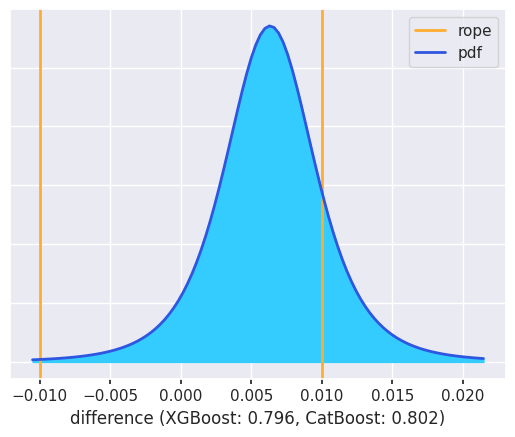

Comparación bayesiana entre XGBoost y Extra Trees en Recall: (0.9387680415053152, 0.0574429354439846, 0.0037890230507001688)


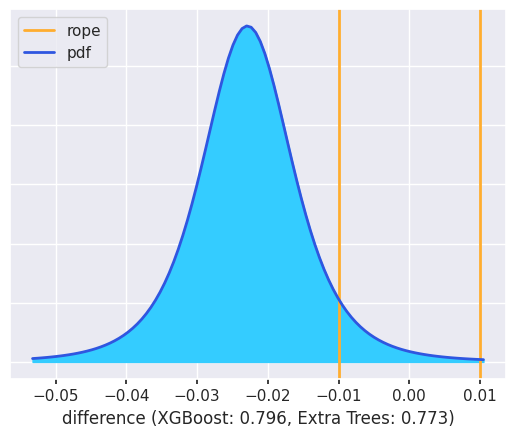

Comparación bayesiana entre Support Vector Classifier y KNN Classifier en Recall: (0.7423447695180972, 0.2461707591250326, 0.01148447135687014)


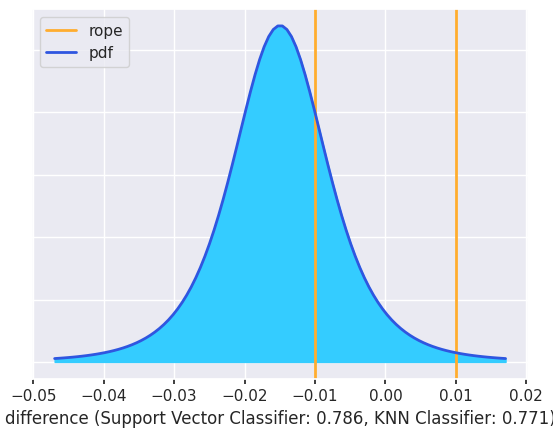

Comparación bayesiana entre Support Vector Classifier y Decision Tree en Recall: (0.9973839464074072, 0.0019694941495733698, 0.0006465594430193899)


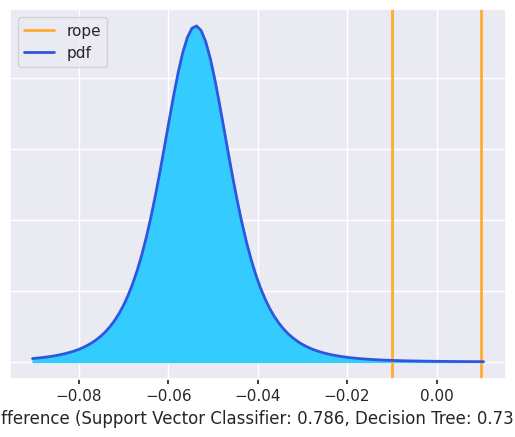

Comparación bayesiana entre Support Vector Classifier y AdaBoost en Recall: (0.07370716181629733, 0.7641277974384404, 0.16216504074526228)


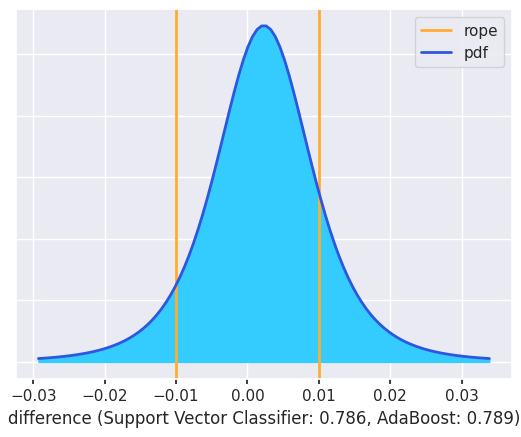

Comparación bayesiana entre Support Vector Classifier y CatBoost en Recall: (0.008237622332731813, 0.20732473188222444, 0.7844376457850437)


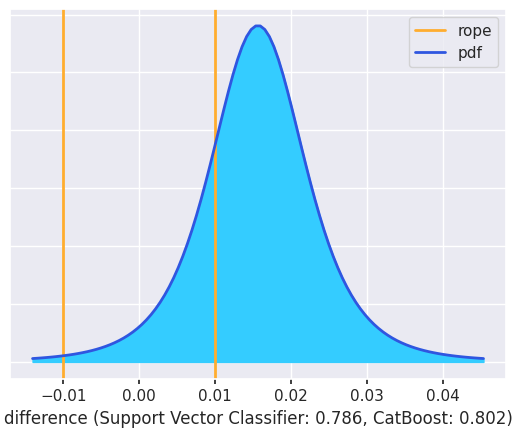

Comparación bayesiana entre Support Vector Classifier y Extra Trees en Recall: (0.6512573600205727, 0.323170350187029, 0.02557228979239834)


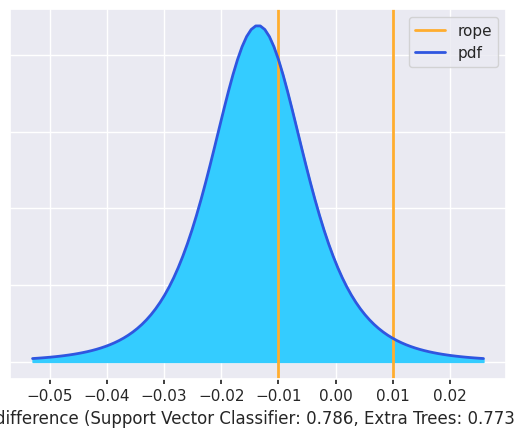

Comparación bayesiana entre KNN Classifier y Decision Tree en Recall: (0.99645574369234, 0.0030408283900509314, 0.000503427917609045)


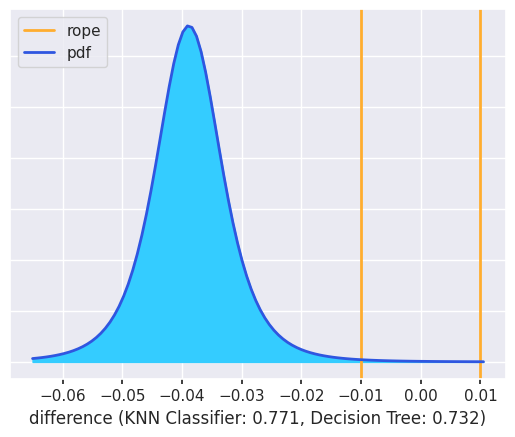

Comparación bayesiana entre KNN Classifier y AdaBoost en Recall: (0.003524476523320146, 0.12008238435796215, 0.8763931391187177)


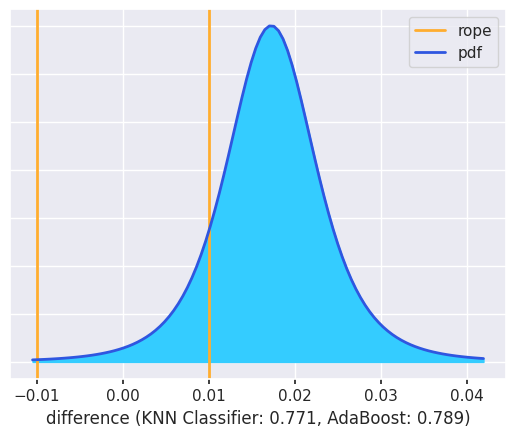

Comparación bayesiana entre KNN Classifier y CatBoost en Recall: (0.008100042759075032, 0.04820613869100865, 0.9436938185499163)


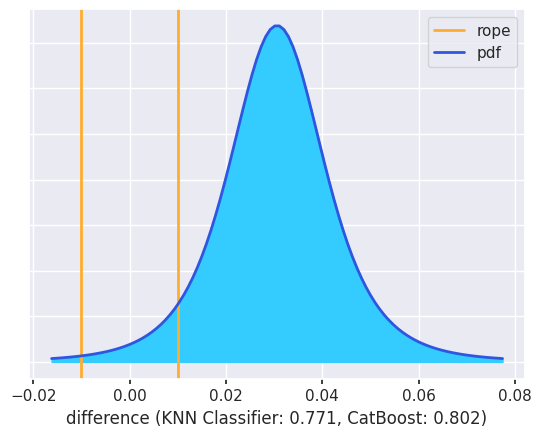

Comparación bayesiana entre KNN Classifier y Extra Trees en Recall: (0.1011557041173588, 0.7425132369267452, 0.15633105895589605)


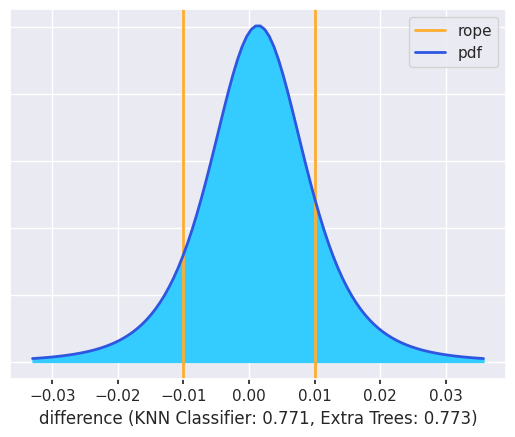

Comparación bayesiana entre Decision Tree y AdaBoost en Recall: (6.8832124156997e-05, 0.00021229858578120098, 0.9997188692900618)


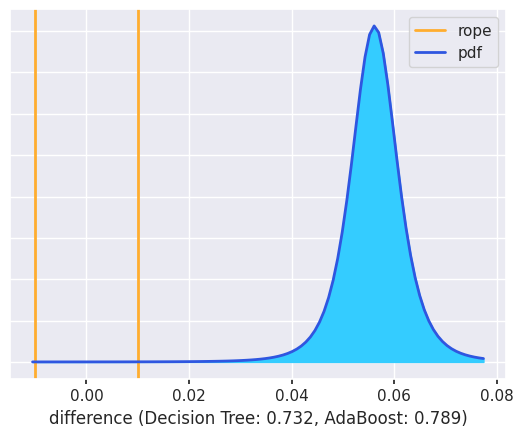

Comparación bayesiana entre Decision Tree y CatBoost en Recall: (0.00019047823955177666, 0.0003923456194722119, 0.999417176140976)


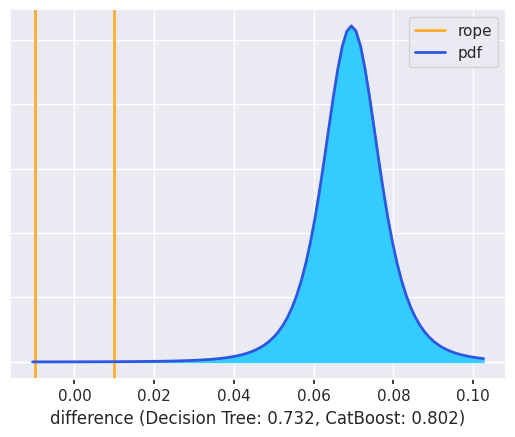

Comparación bayesiana entre Decision Tree y Extra Trees en Recall: (0.00029131936000528926, 0.0016919748526809109, 0.9980167057873138)


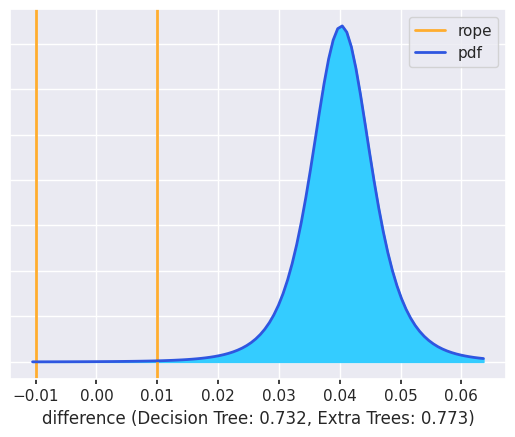

Comparación bayesiana entre AdaBoost y CatBoost en Recall: (0.012816358272243606, 0.3098609561093103, 0.6773226856184461)


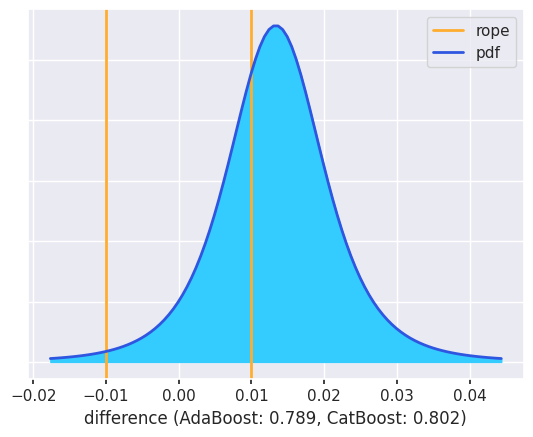

Comparación bayesiana entre AdaBoost y Extra Trees en Recall: (0.9554795417790558, 0.04422206327100531, 0.00029839494993888493)


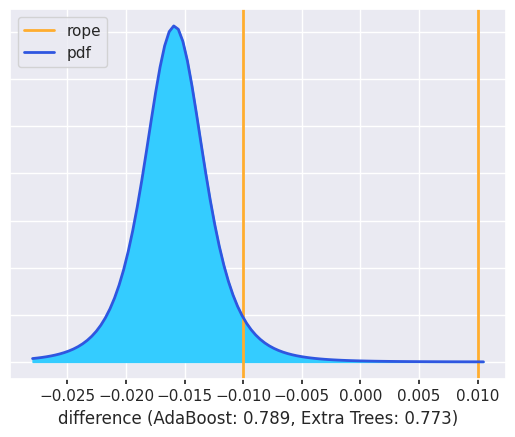

Comparación bayesiana entre CatBoost y Extra Trees en Recall: (0.9747500326364724, 0.022826325502840916, 0.002423641860686665)


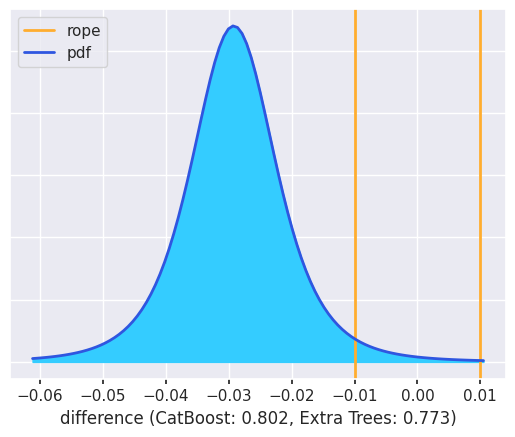

Imágenes guardadas en la carpeta temporal: C:\Users\MANUEL~1\AppData\Local\Temp\tmp3zhk21yv
Comparación bayesiana entre Logistic Regression y Random Forest en F1 Score: (0.0778778923499525, 0.8135930370364242, 0.10852907061362338)


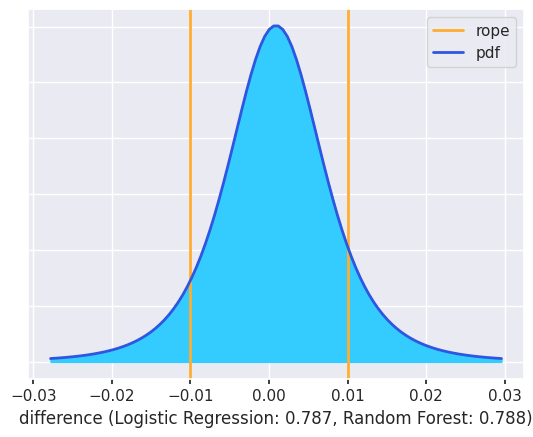

Comparación bayesiana entre Logistic Regression y Gradient Boosting en F1 Score: (0.03063232021597039, 0.4033043599150472, 0.5660633198689824)


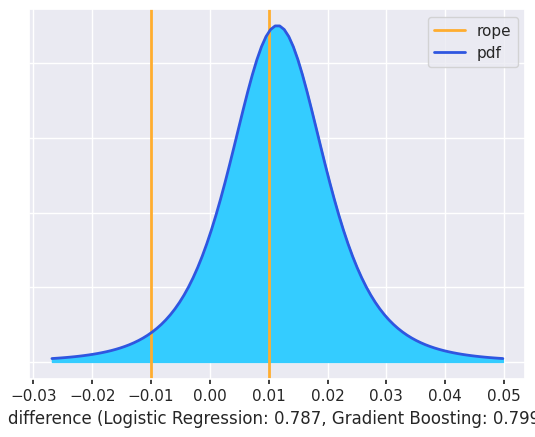

Comparación bayesiana entre Logistic Regression y XGBoost en F1 Score: (0.036893139918618784, 0.5614290836054978, 0.40167777647588343)


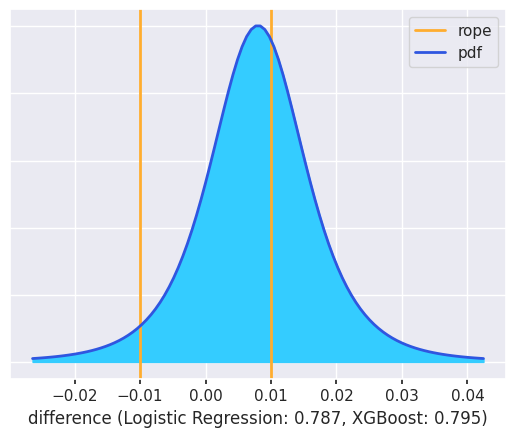

Comparación bayesiana entre Logistic Regression y Support Vector Classifier en F1 Score: (0.2507365102663576, 0.6406330767705024, 0.10863041296313991)


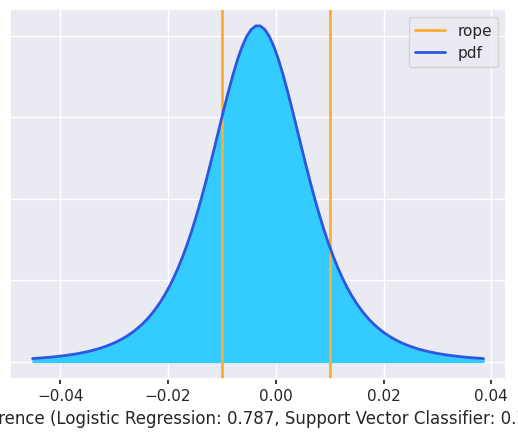

Comparación bayesiana entre Logistic Regression y KNN Classifier en F1 Score: (0.8012789352161518, 0.1905231207832877, 0.008197944000560509)


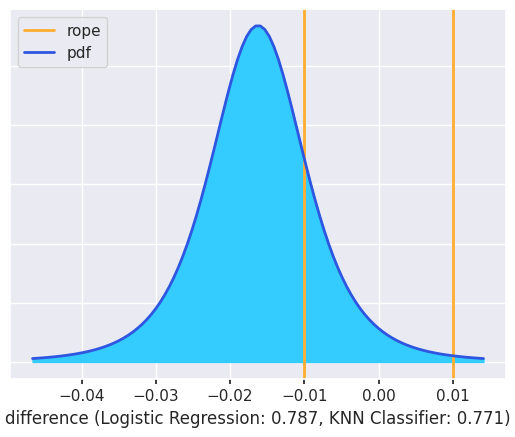

Comparación bayesiana entre Logistic Regression y Decision Tree en F1 Score: (0.999790132854988, 0.00016000970880525323, 4.9857436206779404e-05)


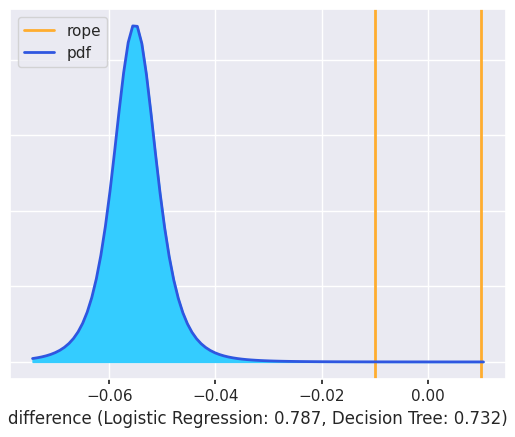

Comparación bayesiana entre Logistic Regression y AdaBoost en F1 Score: (0.03313886293125333, 0.9194157300781969, 0.04744540699054978)


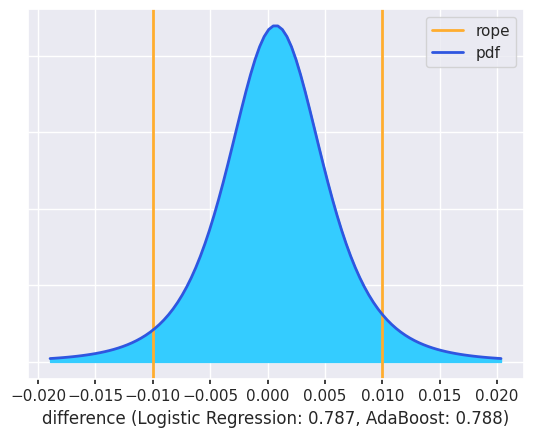

Comparación bayesiana entre Logistic Regression y CatBoost en F1 Score: (0.023643228969951826, 0.3002459306495613, 0.6761108403804869)


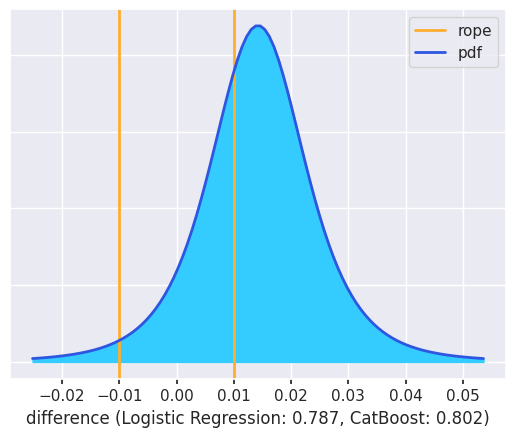

Comparación bayesiana entre Logistic Regression y Extra Trees en F1 Score: (0.9067718148720139, 0.09247887804947807, 0.0007493070785080658)


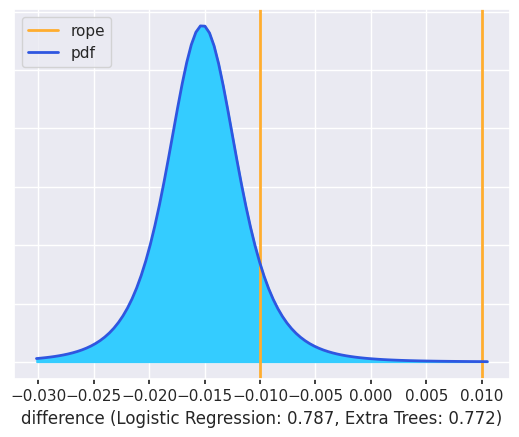

Comparación bayesiana entre Random Forest y Gradient Boosting en F1 Score: (0.007324616086927768, 0.4480662468880997, 0.5446091370249725)


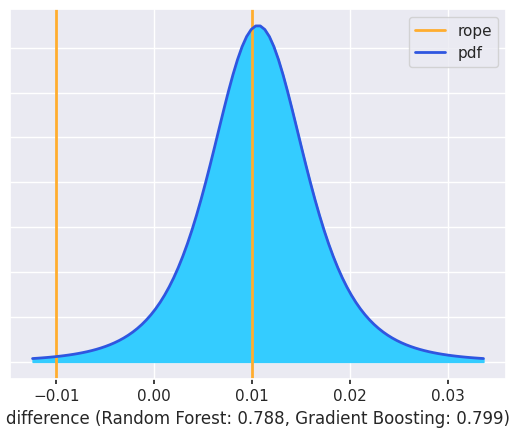

Comparación bayesiana entre Random Forest y XGBoost en F1 Score: (0.009795157613783578, 0.7092099347740787, 0.28099490761213775)


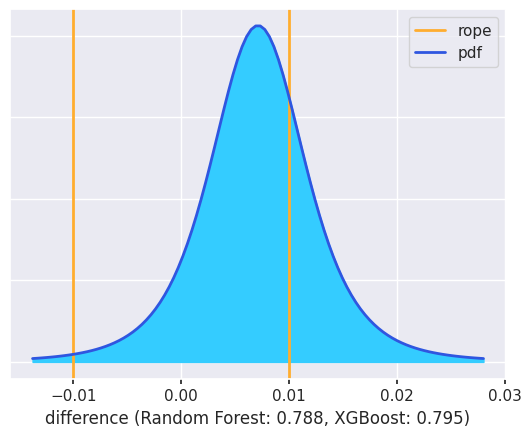

Comparación bayesiana entre Random Forest y Support Vector Classifier en F1 Score: (0.18336688576333823, 0.7822788720900958, 0.034354242146565905)


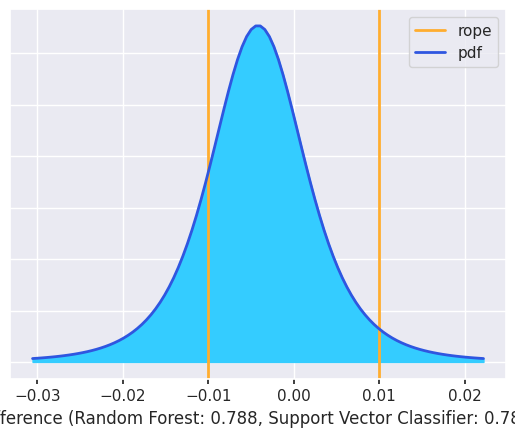

Comparación bayesiana entre Random Forest y KNN Classifier en F1 Score: (0.8153280848199412, 0.17552108864830684, 0.009150826531751921)


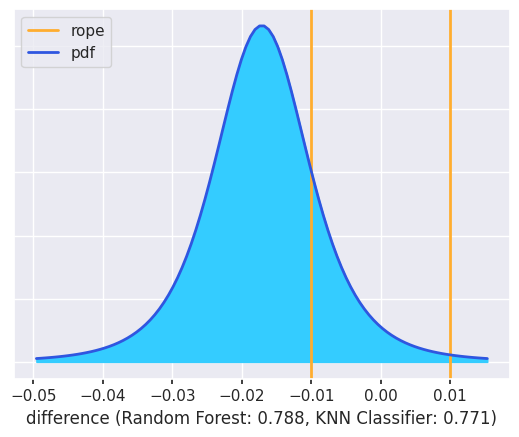

Comparación bayesiana entre Random Forest y Decision Tree en F1 Score: (0.9998111930117113, 0.00014296946393277388, 4.583752435594057e-05)


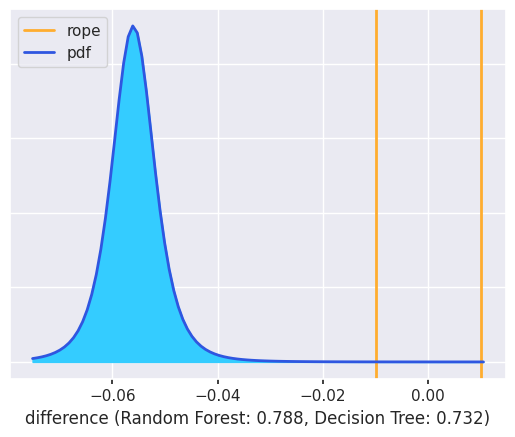

Comparación bayesiana entre Random Forest y AdaBoost en F1 Score: (0.10067225580864107, 0.8050193397406987, 0.09430840445066024)


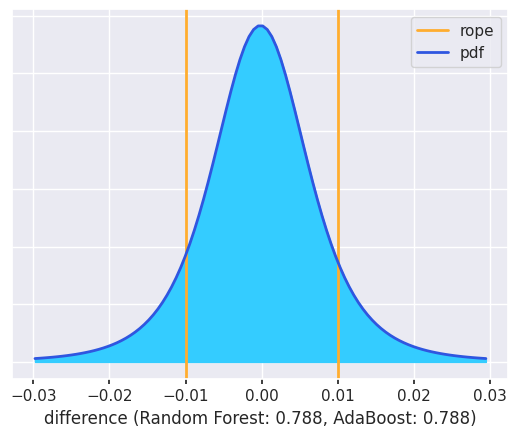

Comparación bayesiana entre Random Forest y CatBoost en F1 Score: (0.008320091584193182, 0.29218984209033383, 0.699490066325473)


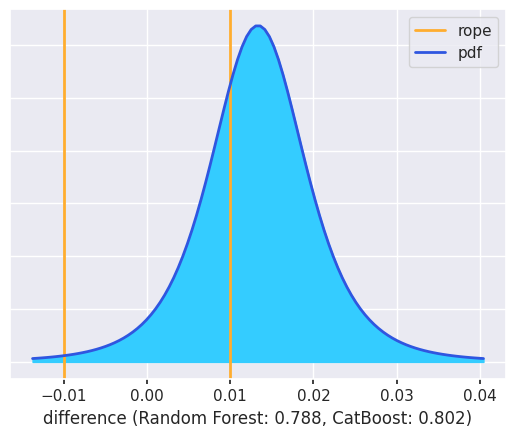

Comparación bayesiana entre Random Forest y Extra Trees en F1 Score: (0.7705222372018177, 0.21726976332394565, 0.012207999474236675)


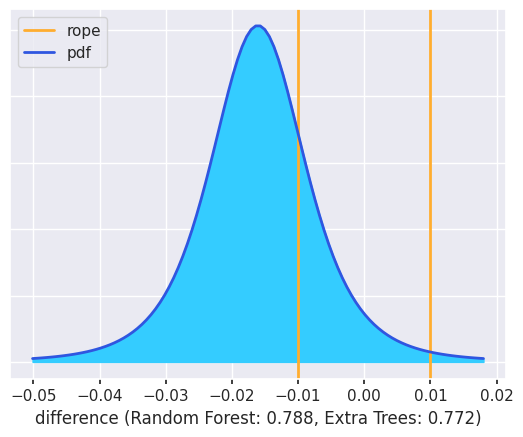

Comparación bayesiana entre Gradient Boosting y XGBoost en F1 Score: (0.03177266259896405, 0.9650742094936489, 0.0031531279073870877)


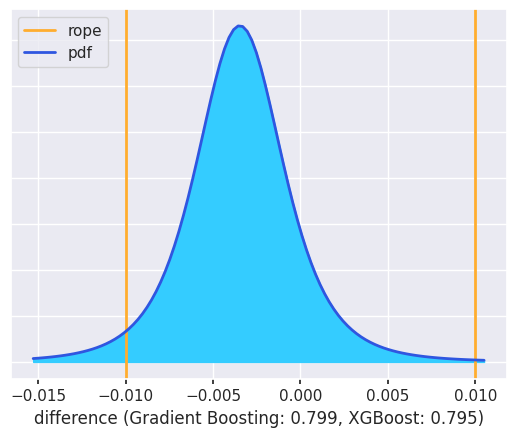

Comparación bayesiana entre Gradient Boosting y Support Vector Classifier en F1 Score: (0.8283638690938184, 0.16910349691477478, 0.0025326339914067963)


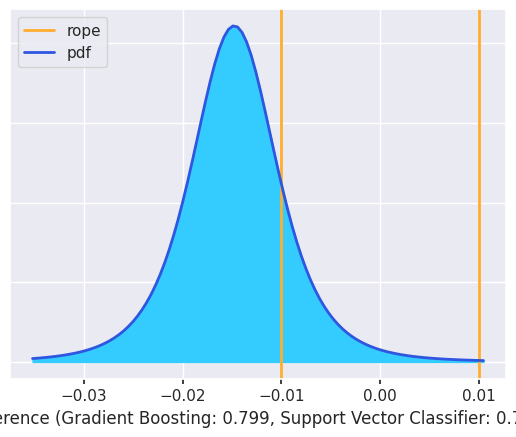

Comparación bayesiana entre Gradient Boosting y KNN Classifier en F1 Score: (0.9673987421260642, 0.02969688669860915, 0.0029043711753266033)


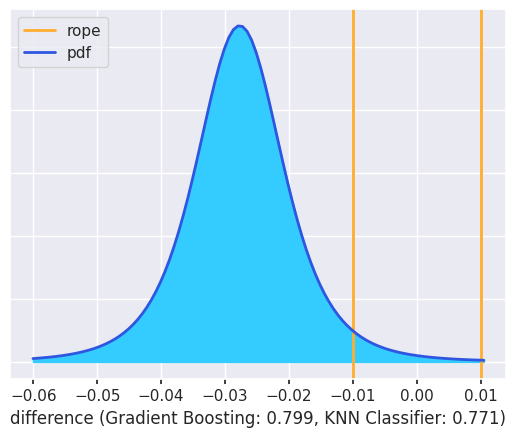

Comparación bayesiana entre Gradient Boosting y Decision Tree en F1 Score: (0.99959859311624, 0.00027737820376849687, 0.0001240286799915058)


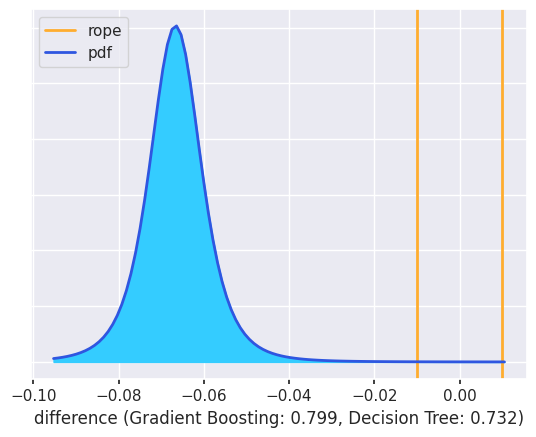

Comparación bayesiana entre Gradient Boosting y AdaBoost en F1 Score: (0.5528185882603518, 0.437564663993122, 0.00961674774652621)


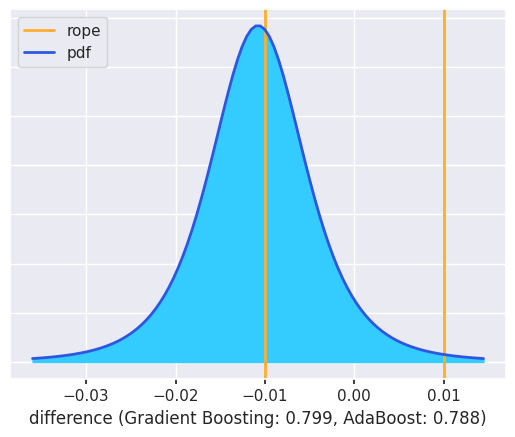

Comparación bayesiana entre Gradient Boosting y CatBoost en F1 Score: (0.023321989303765715, 0.8864232542881794, 0.09025475640805491)


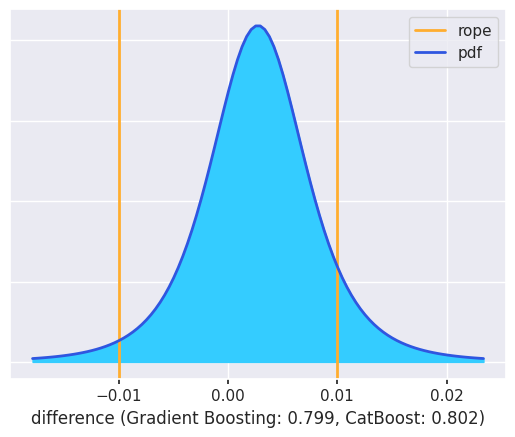

Comparación bayesiana entre Gradient Boosting y Extra Trees en F1 Score: (0.9541460800723089, 0.041720804451215954, 0.004133115476475102)


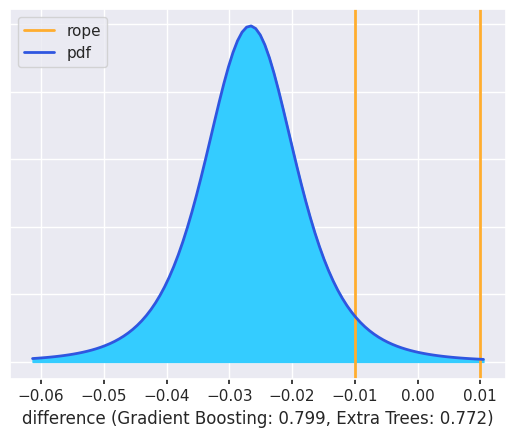

Comparación bayesiana entre XGBoost y Support Vector Classifier en F1 Score: (0.643630703087001, 0.3548906797841943, 0.0014786171288047045)


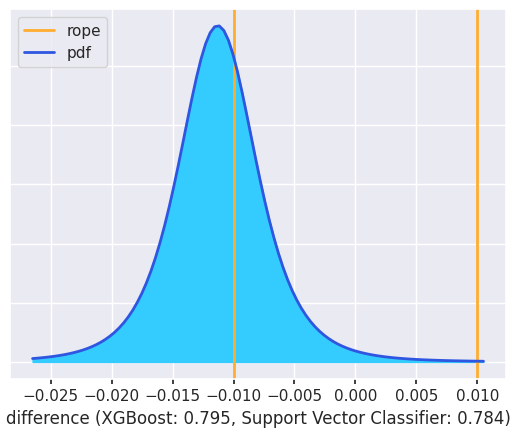

Comparación bayesiana entre XGBoost y KNN Classifier en F1 Score: (0.9299900816884491, 0.06423758632273435, 0.005772331988816548)


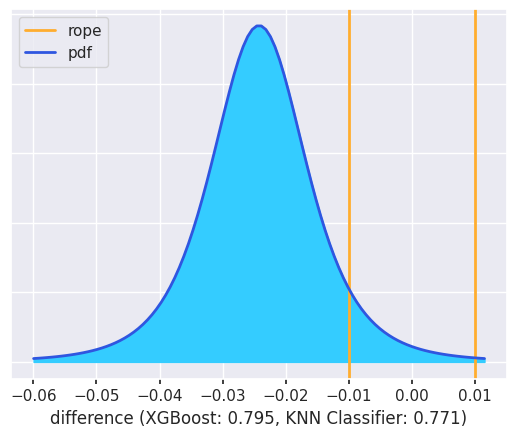

Comparación bayesiana entre XGBoost y Decision Tree en F1 Score: (0.9993906729619811, 0.00043157709431196345, 0.00017774994370689523)


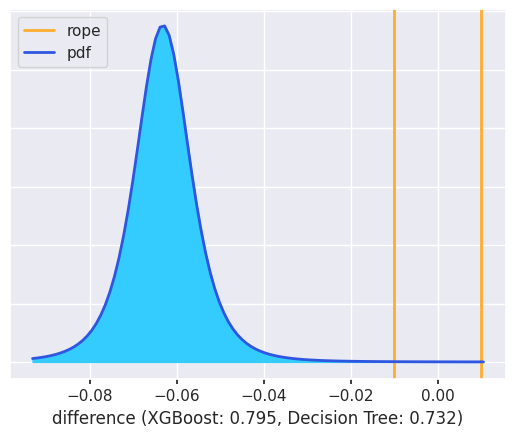

Comparación bayesiana entre XGBoost y AdaBoost en F1 Score: (0.3161338597577449, 0.6692716804129933, 0.014594459829261774)


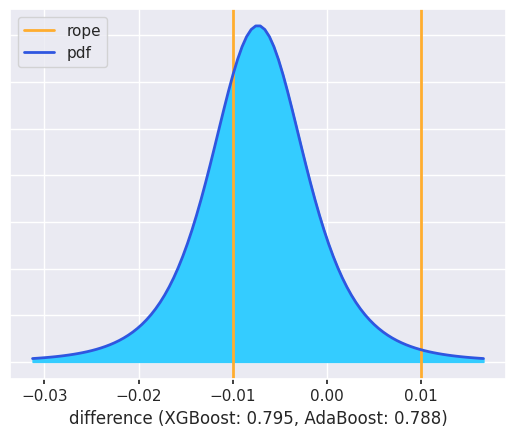

Comparación bayesiana entre XGBoost y CatBoost en F1 Score: (0.0042072437485175035, 0.8352713429939801, 0.16052141325750235)


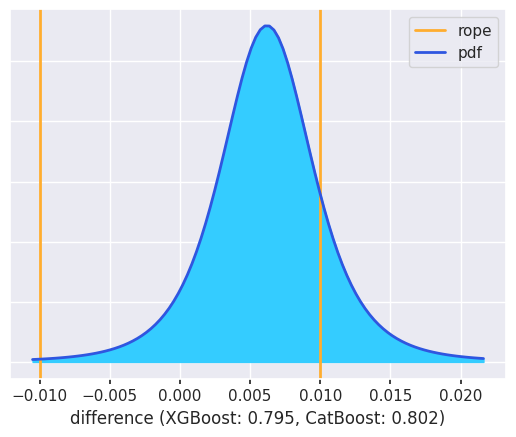

Comparación bayesiana entre XGBoost y Extra Trees en F1 Score: (0.9368728439173852, 0.05895493716236633, 0.004172218920248438)


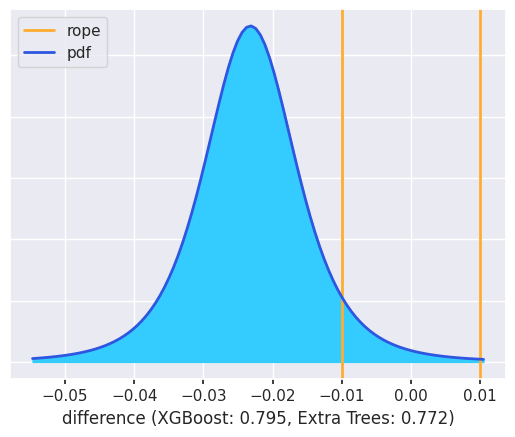

Comparación bayesiana entre Support Vector Classifier y KNN Classifier en F1 Score: (0.6369002315846262, 0.34161748881439113, 0.0214822796009827)


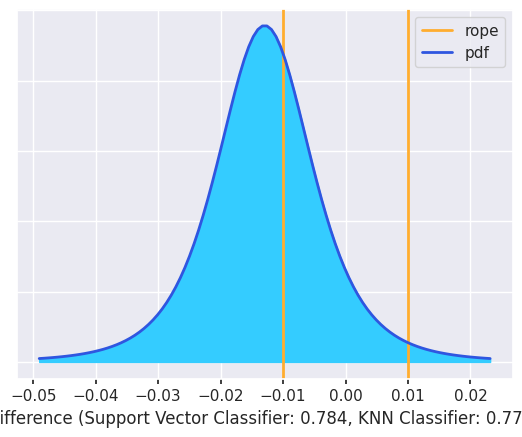

Comparación bayesiana entre Support Vector Classifier y Decision Tree en F1 Score: (0.9960825639951392, 0.0029787699288951197, 0.0009386660759657106)


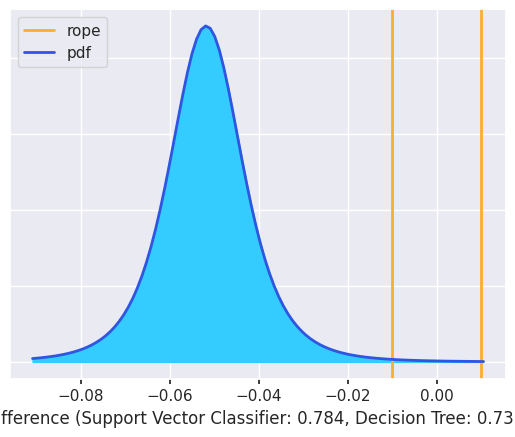

Comparación bayesiana entre Support Vector Classifier y AdaBoost en F1 Score: (0.06240386918575545, 0.7112777142599429, 0.22631841655430163)


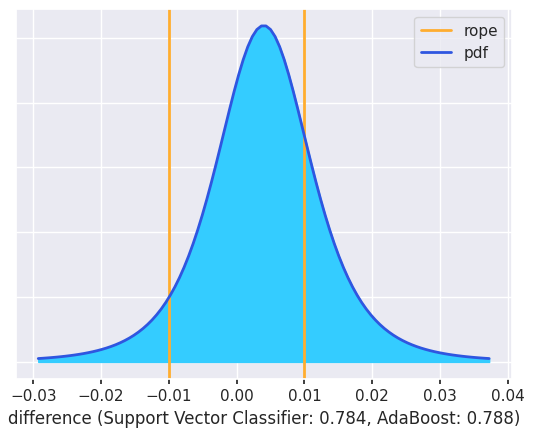

Comparación bayesiana entre Support Vector Classifier y CatBoost en F1 Score: (0.006128534823013667, 0.14468515854654362, 0.8491863066304427)


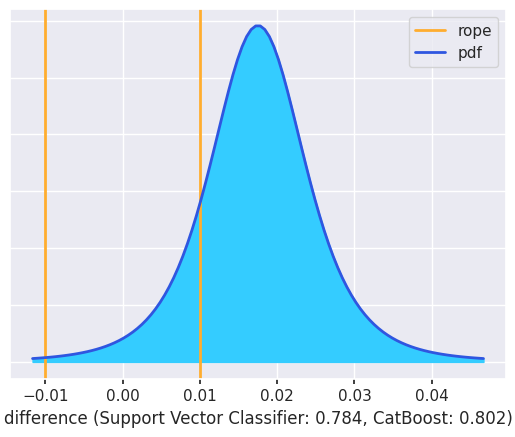

Comparación bayesiana entre Support Vector Classifier y Extra Trees en F1 Score: (0.576902401682643, 0.3860239902996867, 0.037073608017670345)


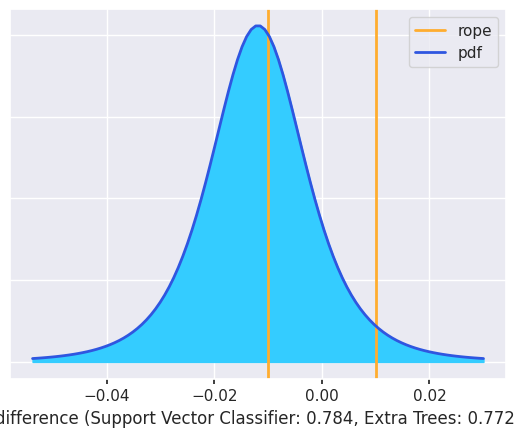

Comparación bayesiana entre KNN Classifier y Decision Tree en F1 Score: (0.9962371021329364, 0.0032246550326838763, 0.0005382428343797541)


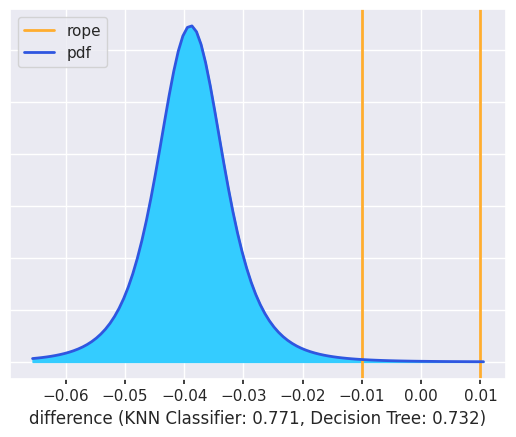

Comparación bayesiana entre KNN Classifier y AdaBoost en F1 Score: (0.004338546651557693, 0.13778858200724864, 0.8578728713411937)


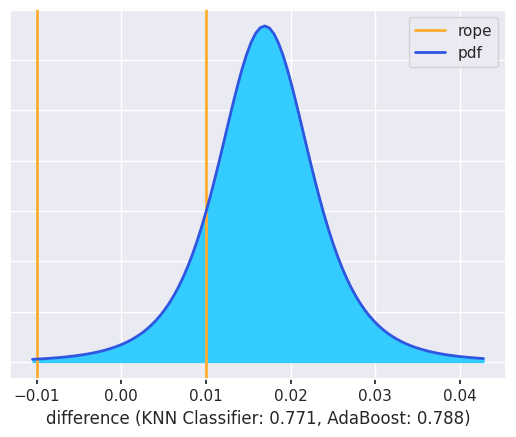

Comparación bayesiana entre KNN Classifier y CatBoost en F1 Score: (0.008771960638650801, 0.05117443193796023, 0.940053607423389)


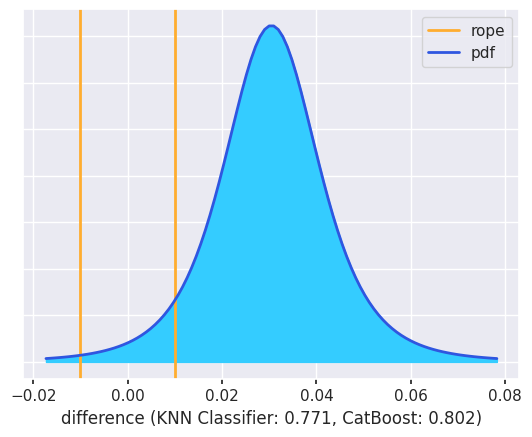

Comparación bayesiana entre KNN Classifier y Extra Trees en F1 Score: (0.10429351170224804, 0.7492953015884436, 0.1464111867093083)


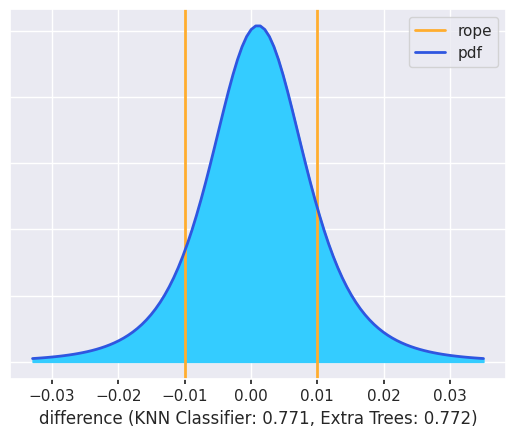

Comparación bayesiana entre Decision Tree y AdaBoost en F1 Score: (7.896550638872471e-05, 0.00024503629477379274, 0.9996759981988375)


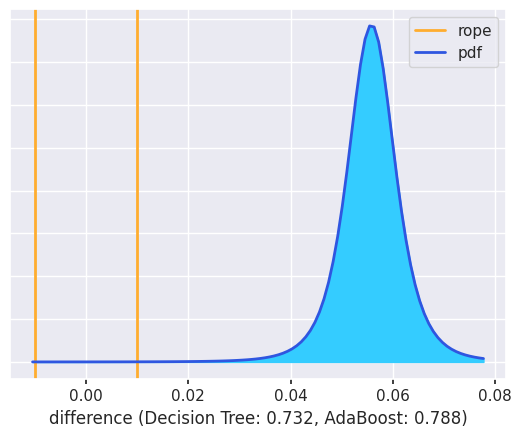

Comparación bayesiana entre Decision Tree y CatBoost en F1 Score: (0.00020903565914497552, 0.0004303661379811974, 0.9993605982028738)


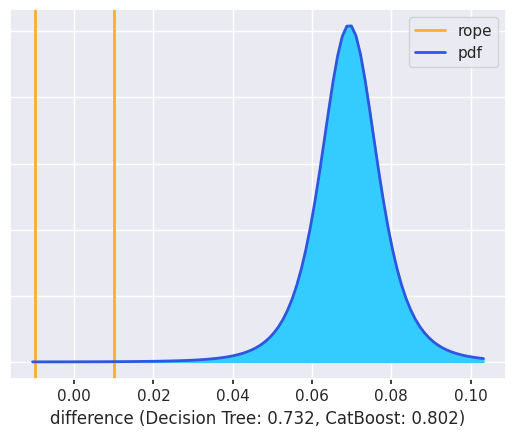

Comparación bayesiana entre Decision Tree y Extra Trees en F1 Score: (0.0003187301853312771, 0.0018694994946258925, 0.9978117703200429)


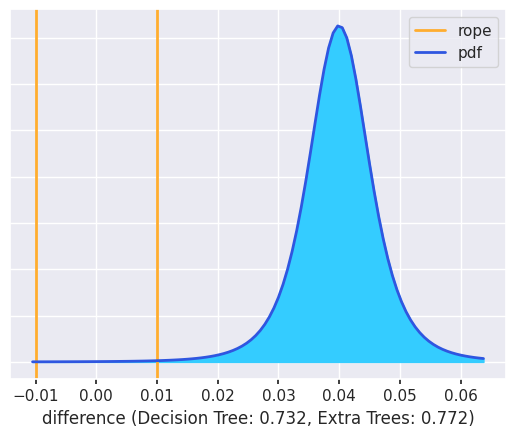

Comparación bayesiana entre AdaBoost y CatBoost en F1 Score: (0.011731826335589945, 0.2992987695171767, 0.6889694041472334)


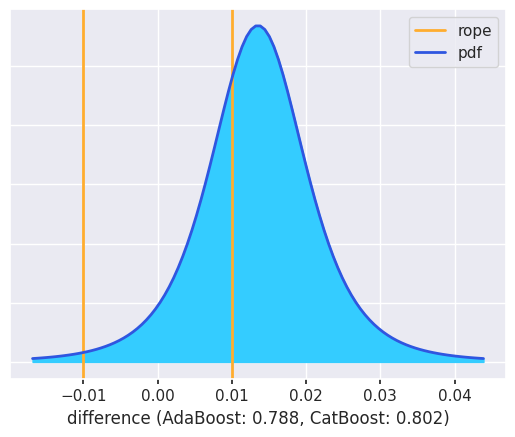

Comparación bayesiana entre AdaBoost y Extra Trees en F1 Score: (0.959104668714928, 0.04063304278819413, 0.0002622884968778161)


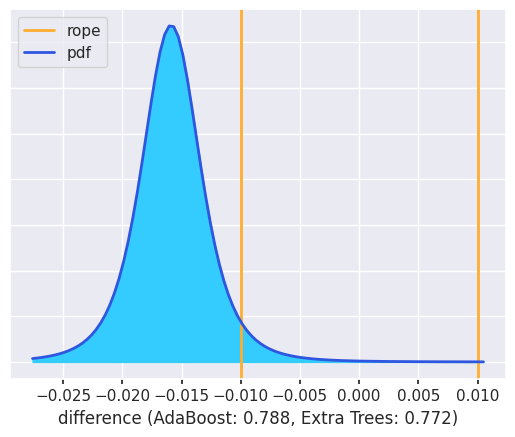

Comparación bayesiana entre CatBoost y Extra Trees en F1 Score: (0.970848210463869, 0.026184851364976724, 0.002966938171154232)


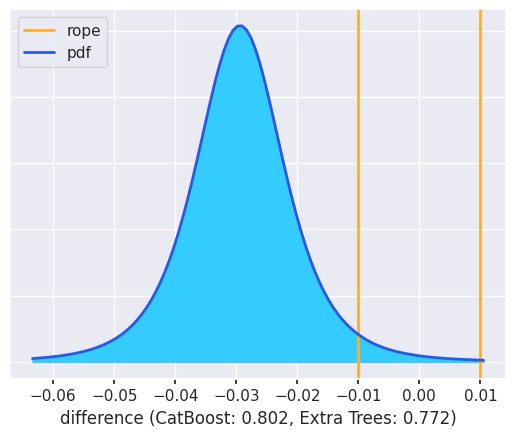

Imágenes guardadas en la carpeta temporal: C:\Users\MANUEL~1\AppData\Local\Temp\tmp_8cpsr3k
Comparación bayesiana entre Logistic Regression y Random Forest en ROC AUC: (0.7263710337334863, 0.2722711681532376, 0.0013577981132760764)


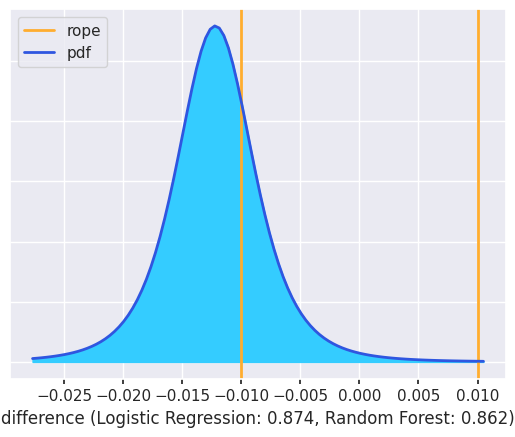

Comparación bayesiana entre Logistic Regression y Gradient Boosting en ROC AUC: (0.0004707113696581155, 0.46687552150674716, 0.5326537671235947)


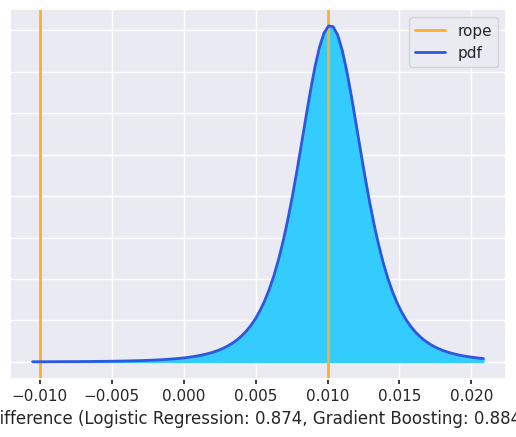

Comparación bayesiana entre Logistic Regression y XGBoost en ROC AUC: (0.0022235544311084727, 0.6329137061549994, 0.36486273941389213)


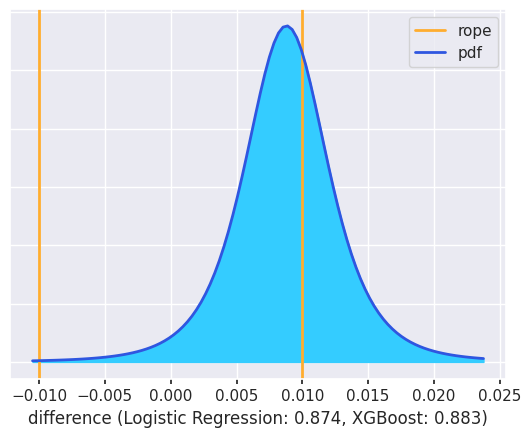

Comparación bayesiana entre Logistic Regression y Support Vector Classifier en ROC AUC: (0.9647300727461038, 0.03264659696012906, 0.0026233302937671565)


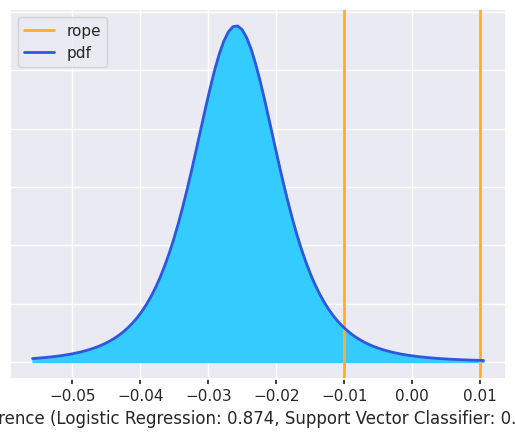

Comparación bayesiana entre Logistic Regression y KNN Classifier en ROC AUC: (0.9869658115725402, 0.01156902165458984, 0.001465166772870008)


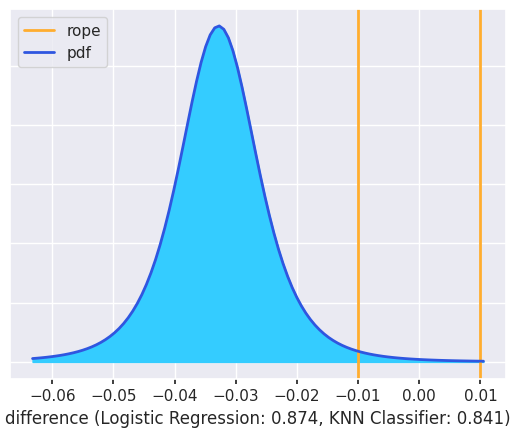

Comparación bayesiana entre Logistic Regression y Decision Tree en ROC AUC: (0.9999549799043014, 2.1617158805997683e-05, 2.3402936892624737e-05)


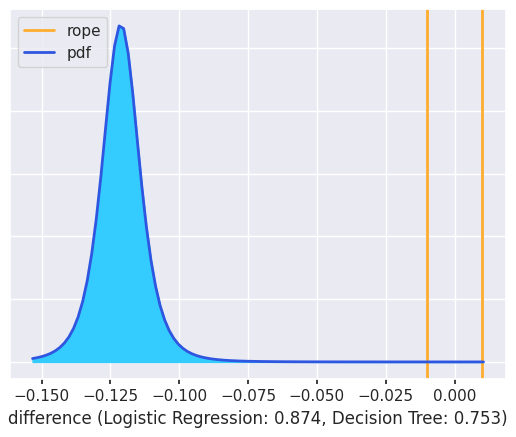

Comparación bayesiana entre Logistic Regression y AdaBoost en ROC AUC: (0.06158080405489946, 0.9201902951660064, 0.018228900779094115)


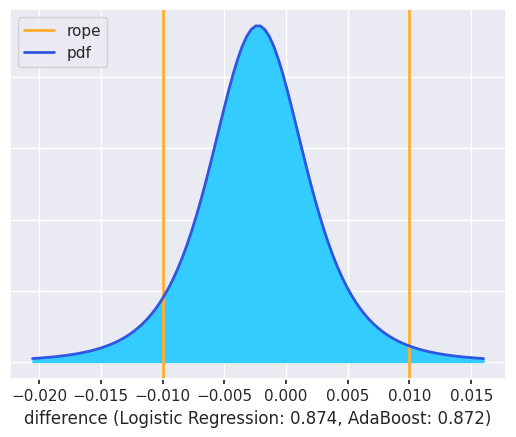

Comparación bayesiana entre Logistic Regression y CatBoost en ROC AUC: (0.0002665362852020804, 0.03955488877904445, 0.9601785749357534)


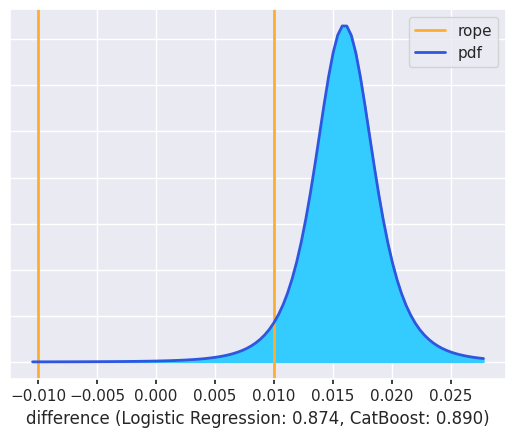

Comparación bayesiana entre Logistic Regression y Extra Trees en ROC AUC: (0.997156095468498, 0.002548727976933729, 0.0002951765545682328)


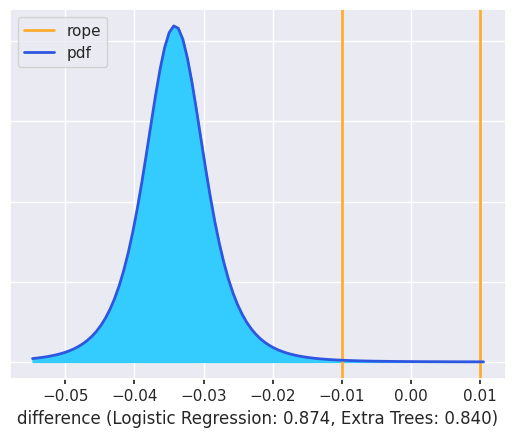

Comparación bayesiana entre Random Forest y Gradient Boosting en ROC AUC: (0.0016326869446741795, 0.03523133972145587, 0.9631359733338699)


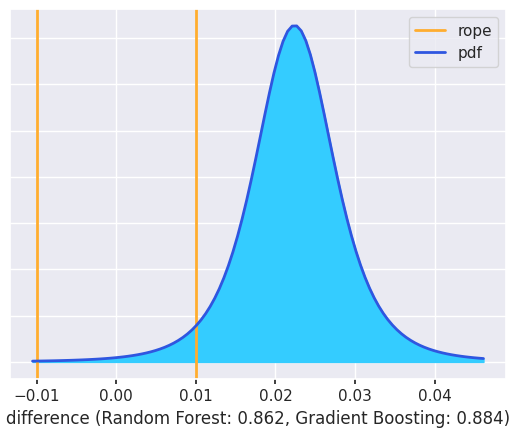

Comparación bayesiana entre Random Forest y XGBoost en ROC AUC: (0.002033082164896906, 0.049648666673756, 0.948318251161347)


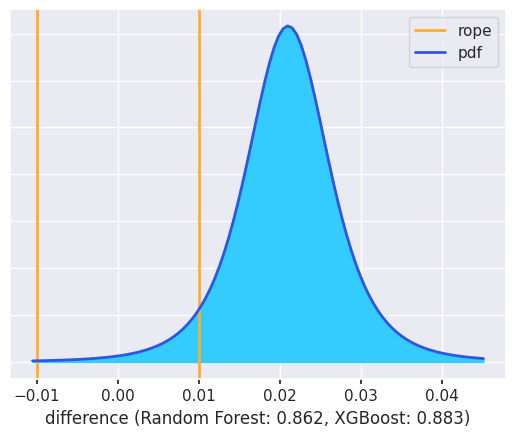

Comparación bayesiana entre Random Forest y Support Vector Classifier en ROC AUC: (0.6799486640422967, 0.30389142984422923, 0.016159906113474065)


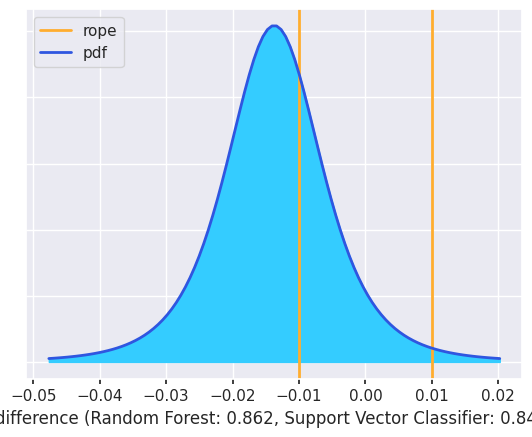

Comparación bayesiana entre Random Forest y KNN Classifier en ROC AUC: (0.8502880437857415, 0.136576267323686, 0.013135688890572483)


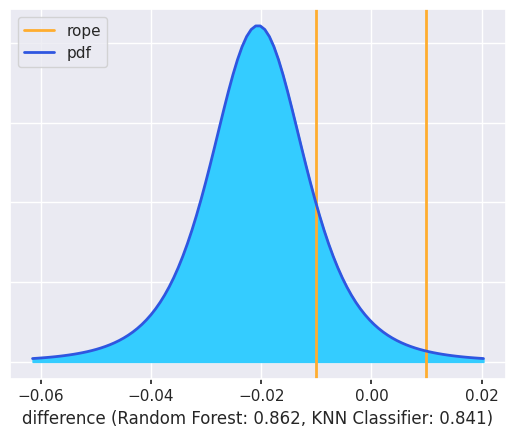

Comparación bayesiana entre Random Forest y Decision Tree en ROC AUC: (0.9999084226970474, 4.7208647627861033e-05, 4.436865532475576e-05)


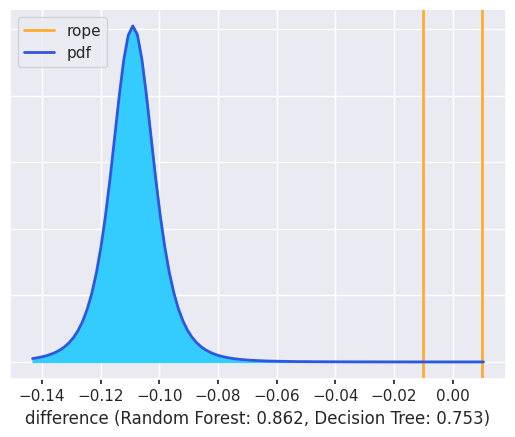

Comparación bayesiana entre Random Forest y AdaBoost en ROC AUC: (0.023832084845443094, 0.4795870041114343, 0.49658091104312263)


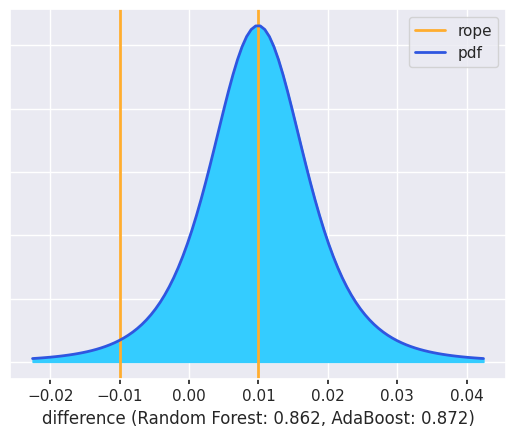

Comparación bayesiana entre Random Forest y CatBoost en ROC AUC: (0.0003343196344516326, 0.004855715490589718, 0.9948099648749587)


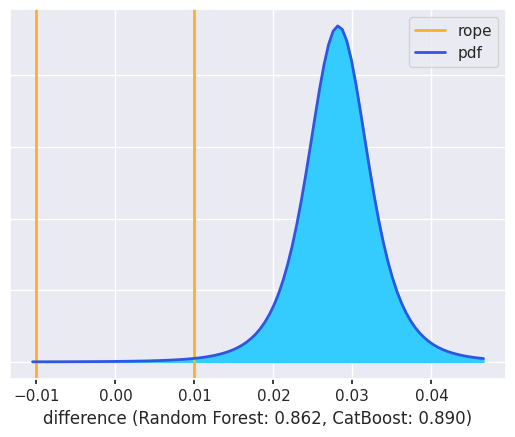

Comparación bayesiana entre Random Forest y Extra Trees en ROC AUC: (0.9944849326482406, 0.005375366157871375, 0.00013970119388806435)


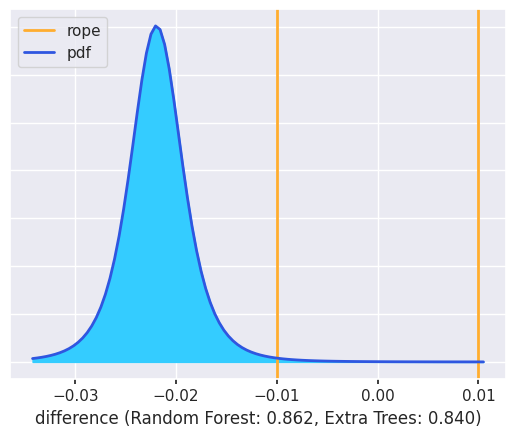

Comparación bayesiana entre Gradient Boosting y XGBoost en ROC AUC: (0.018428915156709667, 0.9740881932405754, 0.0074828916027149806)


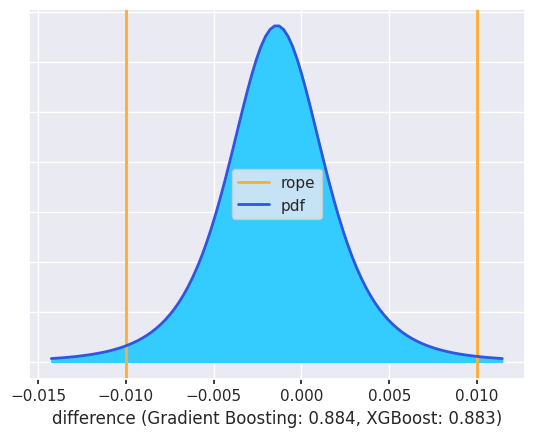

Comparación bayesiana entre Gradient Boosting y Support Vector Classifier en ROC AUC: (0.9946323311886638, 0.004693966286728135, 0.0006737025246080774)


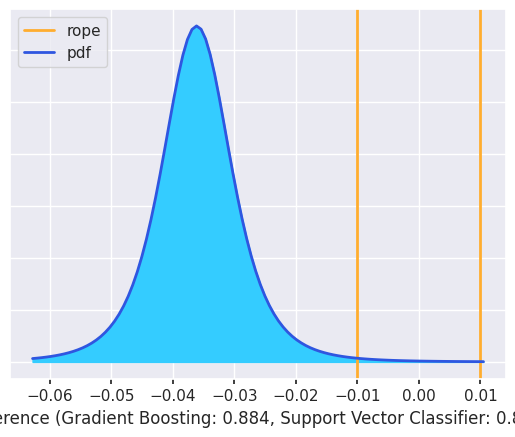

Comparación bayesiana entre Gradient Boosting y KNN Classifier en ROC AUC: (0.9960356764916493, 0.003270714937224528, 0.0006936085711262141)


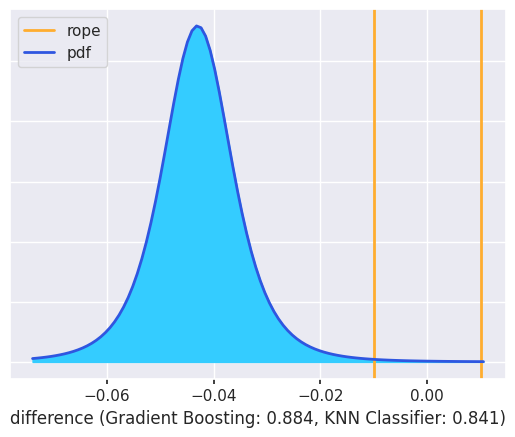

Comparación bayesiana entre Gradient Boosting y Decision Tree en ROC AUC: (0.9999461547249653, 2.4369193010187473e-05, 2.9476082024526562e-05)


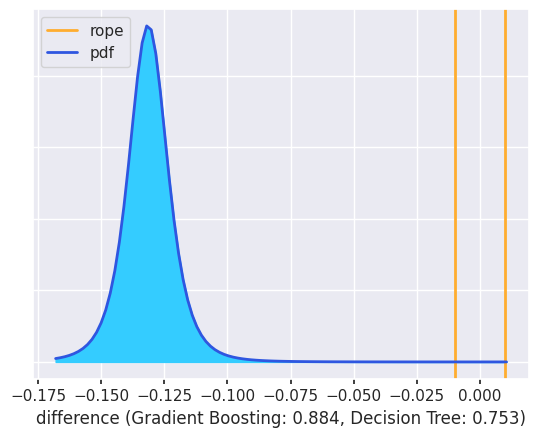

Comparación bayesiana entre Gradient Boosting y AdaBoost en ROC AUC: (0.7285580181362837, 0.2695455530461125, 0.001896428817603768)


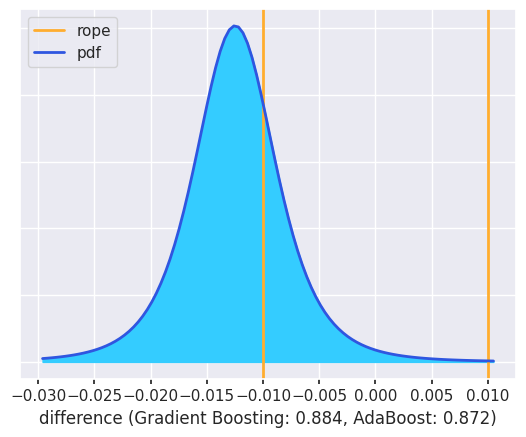

Comparación bayesiana entre Gradient Boosting y CatBoost en ROC AUC: (0.0008603577423063704, 0.9404257350081241, 0.058713907249569486)


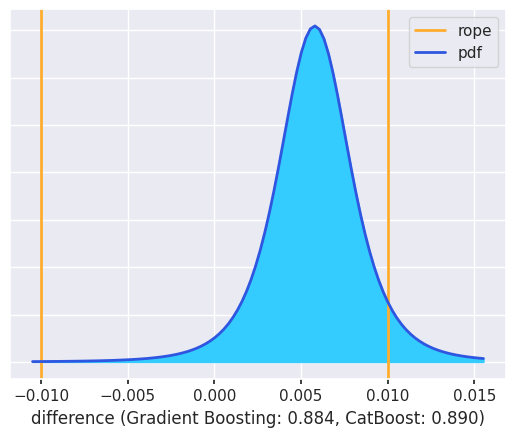

Comparación bayesiana entre Gradient Boosting y Extra Trees en ROC AUC: (0.9972959448224828, 0.002216264824755676, 0.00048779035276147464)


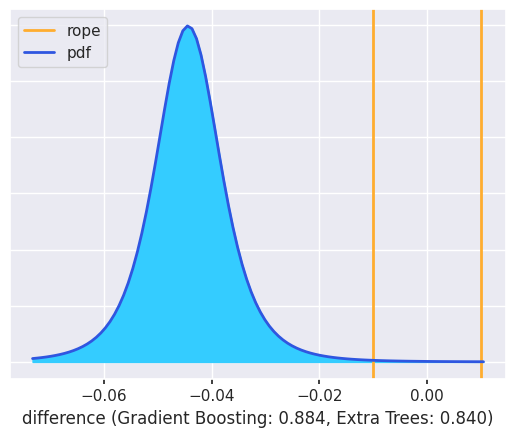

Comparación bayesiana entre XGBoost y Support Vector Classifier en ROC AUC: (0.9816920390421863, 0.015791715105052284, 0.002516245852761445)


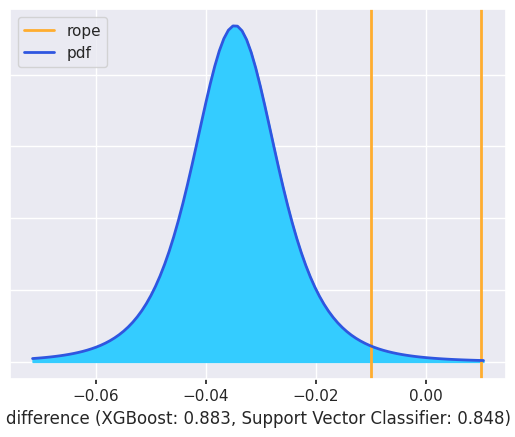

Comparación bayesiana entre XGBoost y KNN Classifier en ROC AUC: (0.9882539194827277, 0.009577609211658067, 0.0021684713056142613)


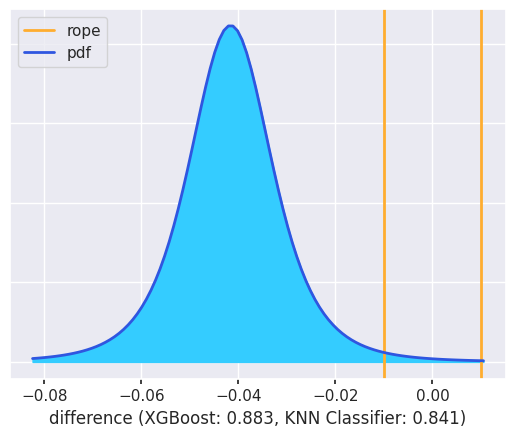

Comparación bayesiana entre XGBoost y Decision Tree en ROC AUC: (0.99994021061771, 2.726011452347521e-05, 3.252926776653453e-05)


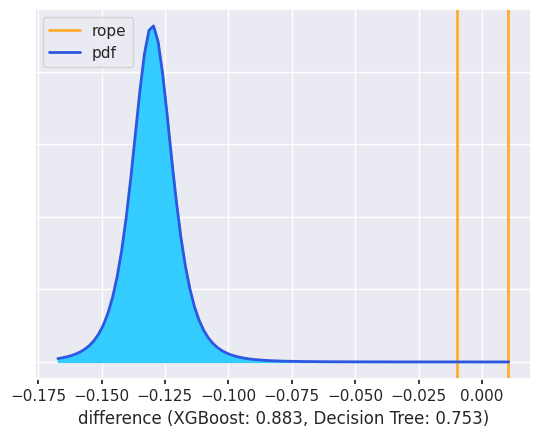

Comparación bayesiana entre XGBoost y AdaBoost en ROC AUC: (0.5774263682987585, 0.41525834355931124, 0.007315288141930276)


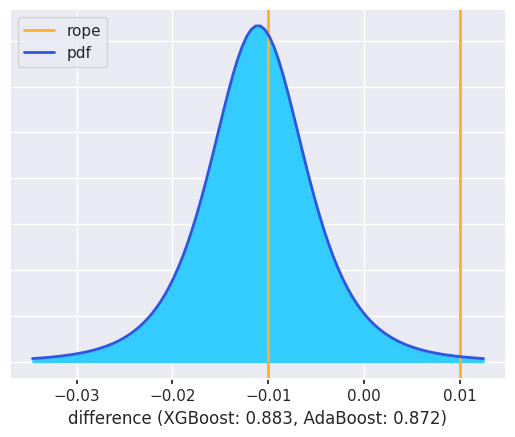

Comparación bayesiana entre XGBoost y CatBoost en ROC AUC: (0.0006412807108955935, 0.869944352636598, 0.12941436665250639)


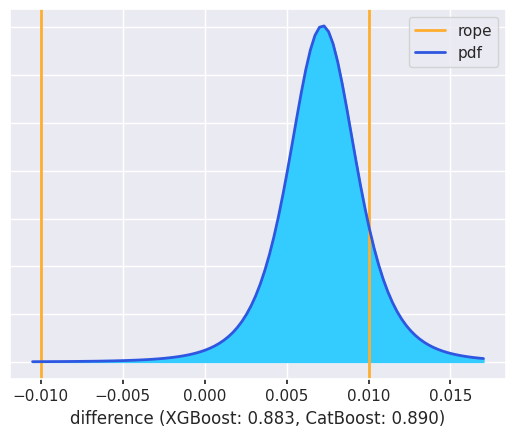

Comparación bayesiana entre XGBoost y Extra Trees en ROC AUC: (0.9976144395147284, 0.001983307028353587, 0.0004022534569180225)


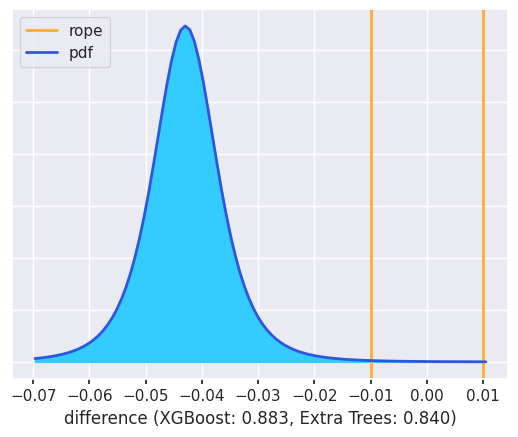

Comparación bayesiana entre Support Vector Classifier y KNN Classifier en ROC AUC: (0.33227801161406467, 0.6349387627053598, 0.03278322568057557)


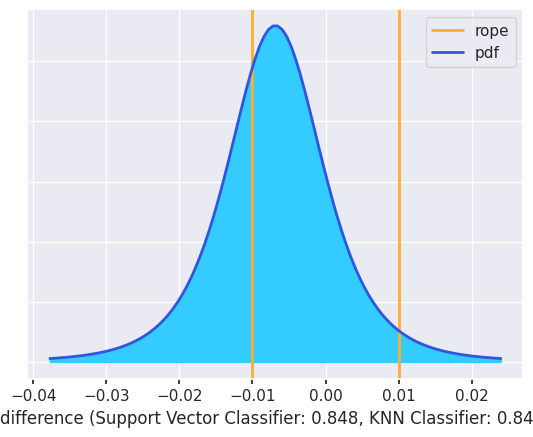

Comparación bayesiana entre Support Vector Classifier y Decision Tree en ROC AUC: (0.9997169479332407, 0.0001584402340503166, 0.00012461183270895404)


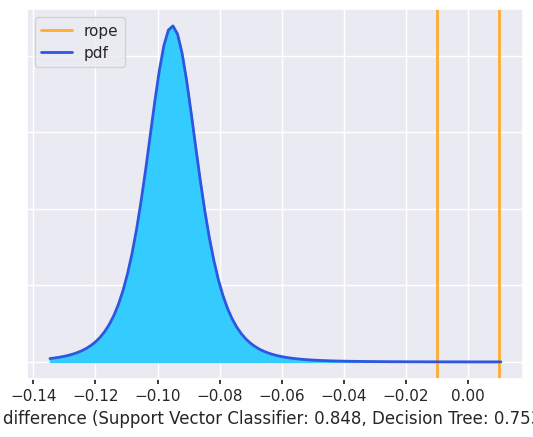

Comparación bayesiana entre Support Vector Classifier y AdaBoost en ROC AUC: (0.00771323336850195, 0.0799465073497937, 0.9123402592817044)


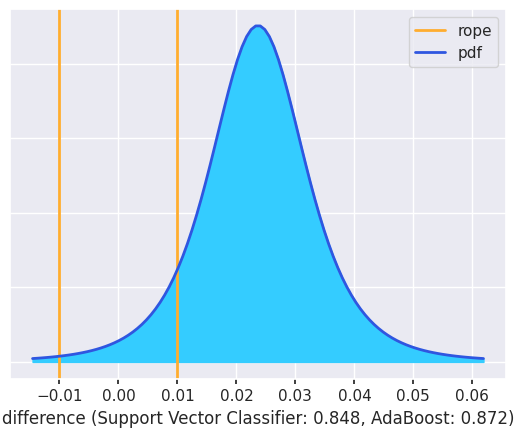

Comparación bayesiana entre Support Vector Classifier y CatBoost en ROC AUC: (0.0006037451387400609, 0.0030407331405301052, 0.9963555217207298)


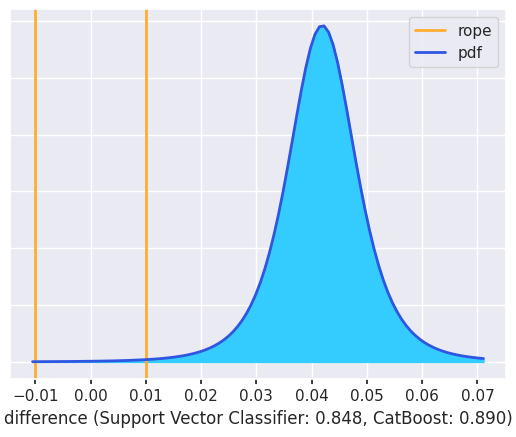

Comparación bayesiana entre Support Vector Classifier y Extra Trees en ROC AUC: (0.4312449774025532, 0.5033093596113377, 0.0654456629861091)


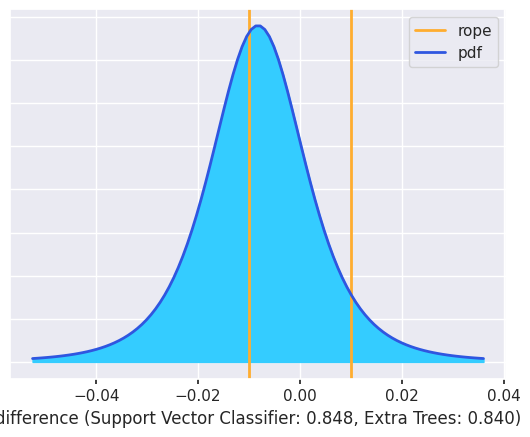

Comparación bayesiana entre KNN Classifier y Decision Tree en ROC AUC: (0.9997610524182067, 0.00014052459093993885, 9.842299085338624e-05)


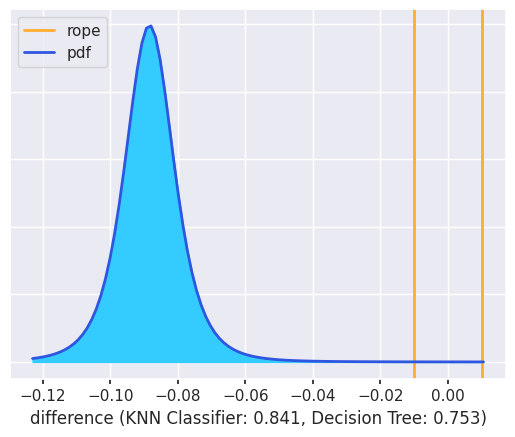

Comparación bayesiana entre KNN Classifier y AdaBoost en ROC AUC: (0.001325564506210301, 0.01270345554102692, 0.9859709799527627)


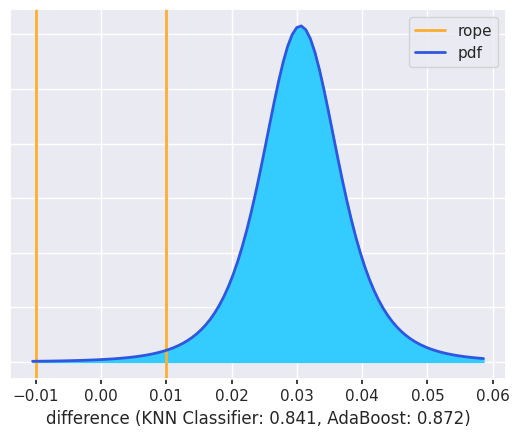

Comparación bayesiana entre KNN Classifier y CatBoost en ROC AUC: (0.0010897868118507521, 0.003829899544590787, 0.9950803136435584)


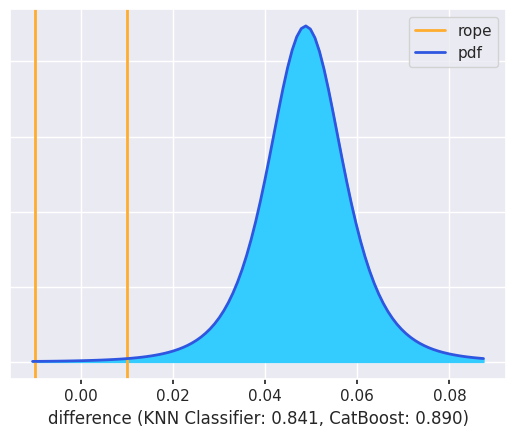

Comparación bayesiana entre KNN Classifier y Extra Trees en ROC AUC: (0.22579600266579286, 0.6066579144006262, 0.16754608293358098)


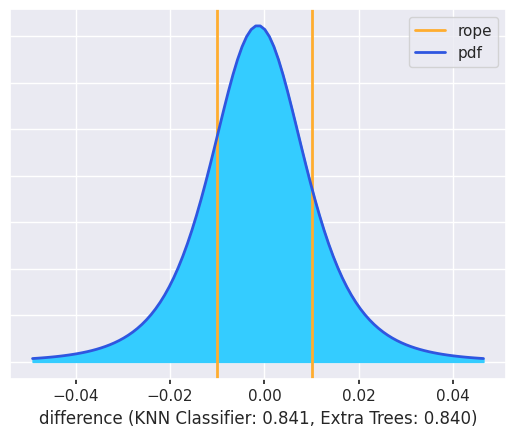

Comparación bayesiana entre Decision Tree y AdaBoost en ROC AUC: (8.45458824571412e-05, 7.90518457359779e-05, 0.9998364022718069)


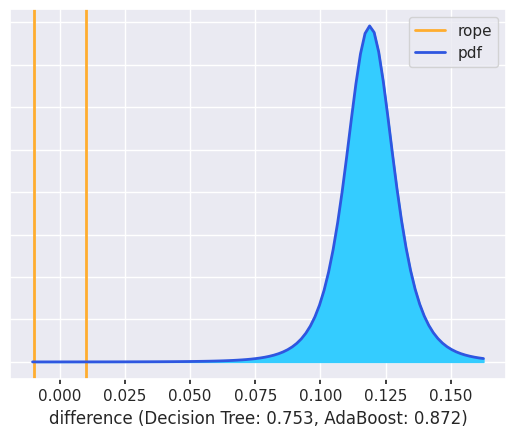

Comparación bayesiana entre Decision Tree y CatBoost en ROC AUC: (2.586011302836483e-05, 2.02120238221859e-05, 0.9999539278631494)


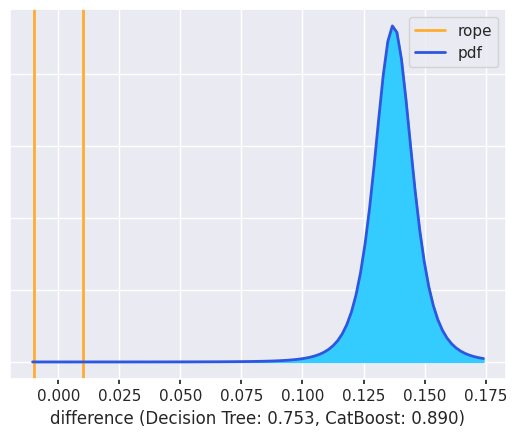

Comparación bayesiana entre Decision Tree y Extra Trees en ROC AUC: (0.00024897136803021715, 0.00035604894289809064, 0.9993949796890716)


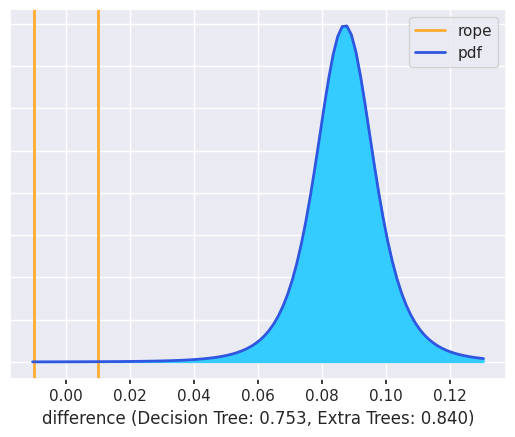

Comparación bayesiana entre AdaBoost y CatBoost en ROC AUC: (0.003138010393261881, 0.0965025458237716, 0.9003594437829665)


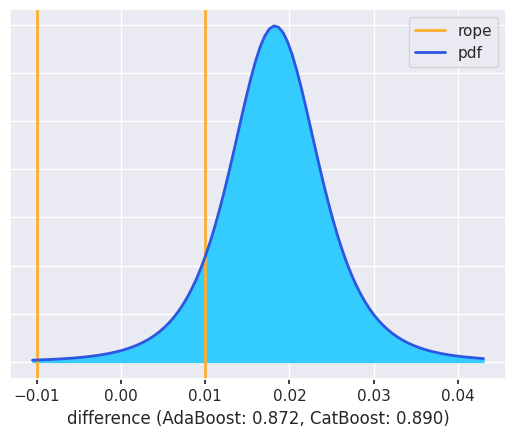

Comparación bayesiana entre AdaBoost y Extra Trees en ROC AUC: (0.9808697198360353, 0.01696810000801785, 0.0021621801559468246)


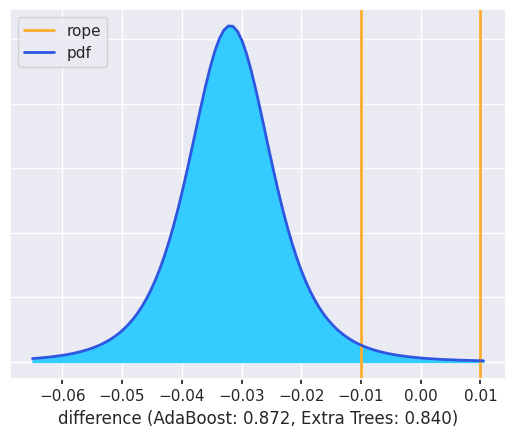

Comparación bayesiana entre CatBoost y Extra Trees en ROC AUC: (0.999263857202716, 0.0005812411443119059, 0.00015490165297205039)


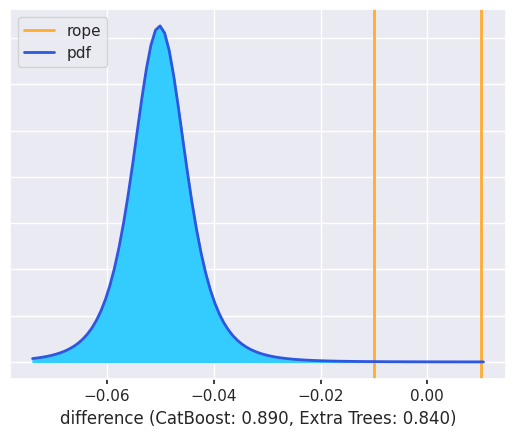

In [45]:
# Función para realizar comparaciones bayesianas entre todos los pares de clasificadores y generar gráficos
def comparaciones_bayesianas(df, nombre_metrica):
    
    rope = 0.01  # Región de Equivalencia Práctica (ROPE)
    bayes_comparison_results = {}

    # Crear una carpeta temporal
    with tempfile.TemporaryDirectory() as temp_dir:
        print(f"Imágenes guardadas en la carpeta temporal: {temp_dir}")
        
        # Comparar todos los pares únicos de modelos
        for i, modelo_1 in enumerate(df.columns):
            for j, modelo_2 in enumerate(df.columns):
                if i < j:  # Evitar comparaciones duplicadas y autocomparaciones
                    # Realizar la comparación bayesiana entre los dos modelos seleccionados usando two_on_single
                    probs, fig = baycomp.two_on_single(
                        df[modelo_1].values,  # Resultados del primer modelo
                        df[modelo_2].values,  # Resultados del segundo modelo
                        rope=rope,
                        plot=True,  # Generar el gráfico
                        names=(modelo_1, modelo_2)  # Nombres para los modelos
                    )
                    bayes_comparison_results[(modelo_1, modelo_2)] = probs
                    # Imprimir los resultados
                    print(f"Comparación bayesiana entre {modelo_1} y {modelo_2} en {nombre_metrica}: {probs}")

                    # Guardar el gráfico en la carpeta temporal
                    image_path = os.path.join(temp_dir, f"Comparacion_Bayesiana_{modelo_1}_vs_{modelo_2}_{nombre_metrica}.png")
                    fig.savefig(image_path)
                    plt.show()

    return bayes_comparison_results

# Realizar comparaciones bayesianas para cada métrica y generar los gráficos
resultados_bayesianos_accuracy = comparaciones_bayesianas(accuracy_df, 'Accuracy')
resultados_bayesianos_precision = comparaciones_bayesianas(precision_df, 'Precision')
resultados_bayesianos_recall = comparaciones_bayesianas(recall_df, 'Recall')
resultados_bayesianos_f1 = comparaciones_bayesianas(f1_df, 'F1 Score')
resultados_bayesianos_roc_auc = comparaciones_bayesianas(roc_auc_df, 'ROC AUC')


### Cruva ROC AUC de los mejores modelos

Learning rate set to 0.023581
0:	learn: 0.6800784	total: 5.88ms	remaining: 5.87s
1:	learn: 0.6680881	total: 11.5ms	remaining: 5.73s
2:	learn: 0.6569969	total: 15.6ms	remaining: 5.18s
3:	learn: 0.6463561	total: 19.9ms	remaining: 4.96s
4:	learn: 0.6383998	total: 24.9ms	remaining: 4.95s
5:	learn: 0.6284726	total: 28.5ms	remaining: 4.71s
6:	learn: 0.6211578	total: 32.6ms	remaining: 4.63s
7:	learn: 0.6143929	total: 37.3ms	remaining: 4.63s
8:	learn: 0.6065475	total: 41.1ms	remaining: 4.53s
9:	learn: 0.5985486	total: 44.3ms	remaining: 4.38s
10:	learn: 0.5919439	total: 47.4ms	remaining: 4.26s
11:	learn: 0.5853662	total: 51.4ms	remaining: 4.23s
12:	learn: 0.5798341	total: 55.5ms	remaining: 4.22s
13:	learn: 0.5746850	total: 59.4ms	remaining: 4.19s
14:	learn: 0.5699015	total: 63ms	remaining: 4.14s
15:	learn: 0.5652855	total: 67ms	remaining: 4.12s
16:	learn: 0.5603328	total: 71.2ms	remaining: 4.11s
17:	learn: 0.5553053	total: 75.1ms	remaining: 4.1s
18:	learn: 0.5510191	total: 79.6ms	remaining: 4.1

c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


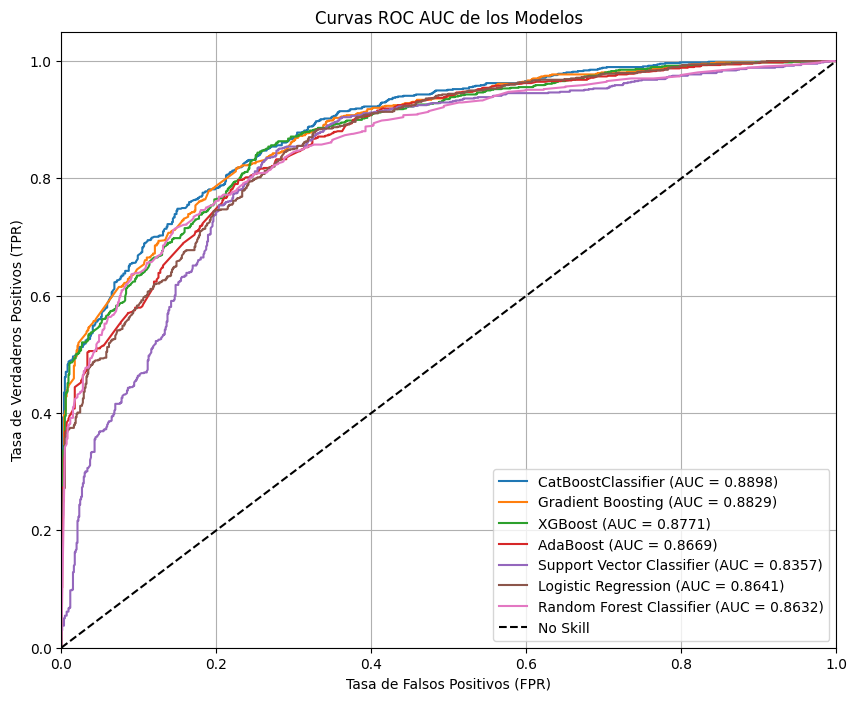

In [54]:
# Inicializar los clasificadores con los mejores parámetros (o con los predeterminados si aún no has hecho grid search)
models = {
    'CatBoostClassifier': CatBoostClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'XGBoost': XGBClassifier(random_state=42),
    'AdaBoost': AdaBoostClassifier(random_state=42),
    'Support Vector Classifier': SVC(probability=True, random_state=42),
    'Logistic Regression': LogisticRegression(random_state=42),
    'Random Forest Classifier': RandomForestClassifier(random_state=42)
    }

# Graficar las curvas ROC AUC
plt.figure(figsize=(10, 8))

for model_name, model in models.items():
    # Entrenar el modelo
    model.fit(X_train, y_train)
    
    # Predecir las probabilidades en el conjunto de prueba
    y_prob = model.predict_proba(X_test)[:, 1]  # Obtener la probabilidad de la clase positiva
    
    # Calcular las curvas ROC y AUC
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    auc_score = roc_auc_score(y_test, y_prob)
    
    # Graficar la curva ROC
    plt.plot(fpr, tpr, label=f'{model_name} (AUC = {auc_score:.4f})')

# Ajustar los ejes y etiquetas
plt.plot([0, 1], [0, 1], 'k--', label='No Skill')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Curvas ROC AUC de los Modelos')
plt.legend(loc='lower right')
plt.grid()
plt.show()

### Comparación Matrices de Confusión y Tiempo de Predicción

Learning rate set to 0.023581
0:	learn: 0.6800784	total: 3.61ms	remaining: 3.61s
1:	learn: 0.6680881	total: 7.01ms	remaining: 3.5s
2:	learn: 0.6569969	total: 10.5ms	remaining: 3.49s
3:	learn: 0.6463561	total: 15.9ms	remaining: 3.97s
4:	learn: 0.6383998	total: 21.5ms	remaining: 4.28s
5:	learn: 0.6284726	total: 25.3ms	remaining: 4.18s
6:	learn: 0.6211578	total: 29.2ms	remaining: 4.14s
7:	learn: 0.6143929	total: 33.1ms	remaining: 4.1s
8:	learn: 0.6065475	total: 36.9ms	remaining: 4.06s
9:	learn: 0.5985486	total: 40.8ms	remaining: 4.04s
10:	learn: 0.5919439	total: 45ms	remaining: 4.04s
11:	learn: 0.5853662	total: 49ms	remaining: 4.03s
12:	learn: 0.5798341	total: 52.6ms	remaining: 4s
13:	learn: 0.5746850	total: 55.3ms	remaining: 3.9s
14:	learn: 0.5699015	total: 58.8ms	remaining: 3.86s
15:	learn: 0.5652855	total: 62.4ms	remaining: 3.84s
16:	learn: 0.5603328	total: 65.7ms	remaining: 3.8s
17:	learn: 0.5553053	total: 70.1ms	remaining: 3.82s
18:	learn: 0.5510191	total: 74.1ms	remaining: 3.82s
19:

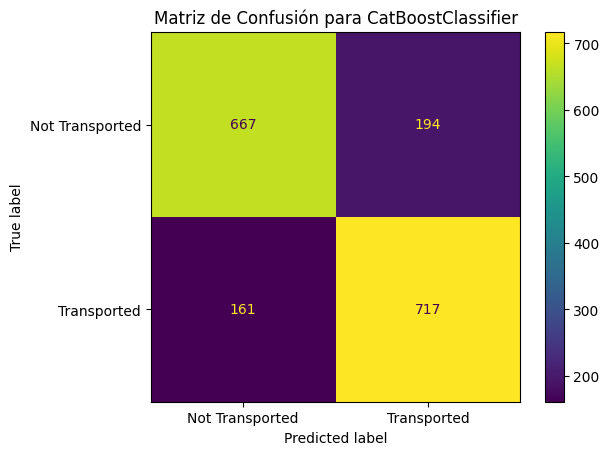

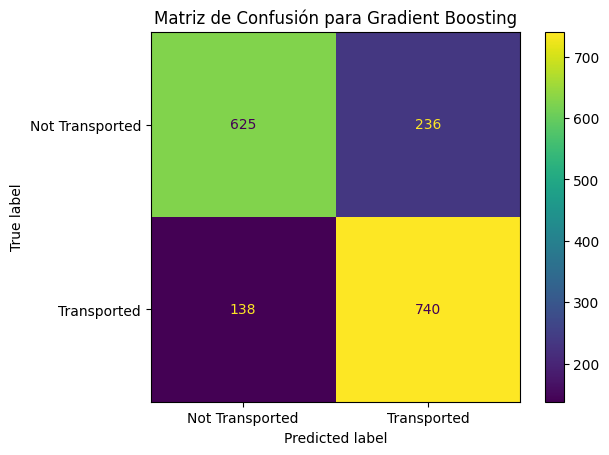

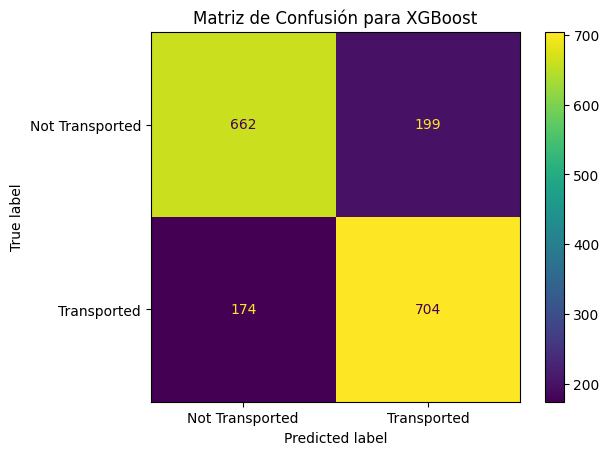

c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


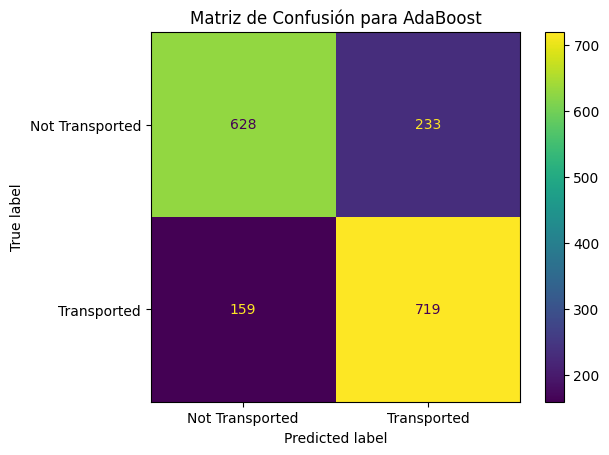

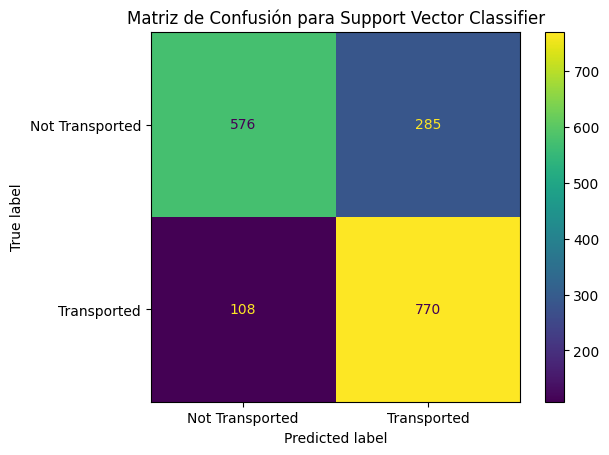

c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


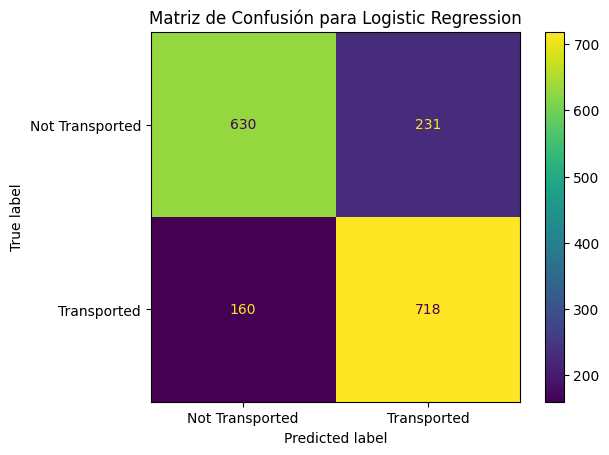

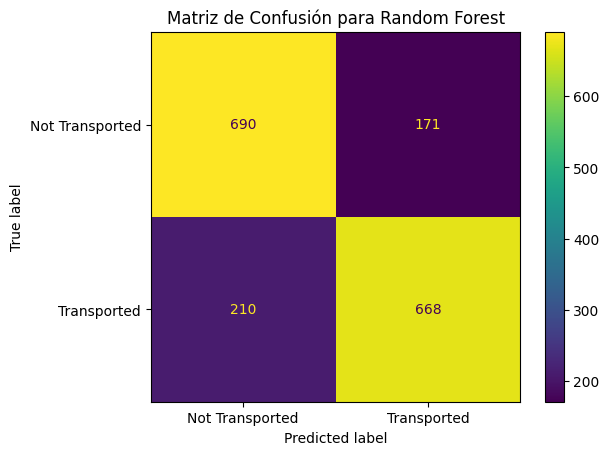

Tiempos de predicción (en segundos):
CatBoostClassifier: 4.4669 segundos
Gradient Boosting: 0.8010 segundos
XGBoost: 0.1337 segundos
AdaBoost: 0.2628 segundos
Support Vector Classifier: 5.5328 segundos
Logistic Regression: 0.0655 segundos
Random Forest: 0.6146 segundos


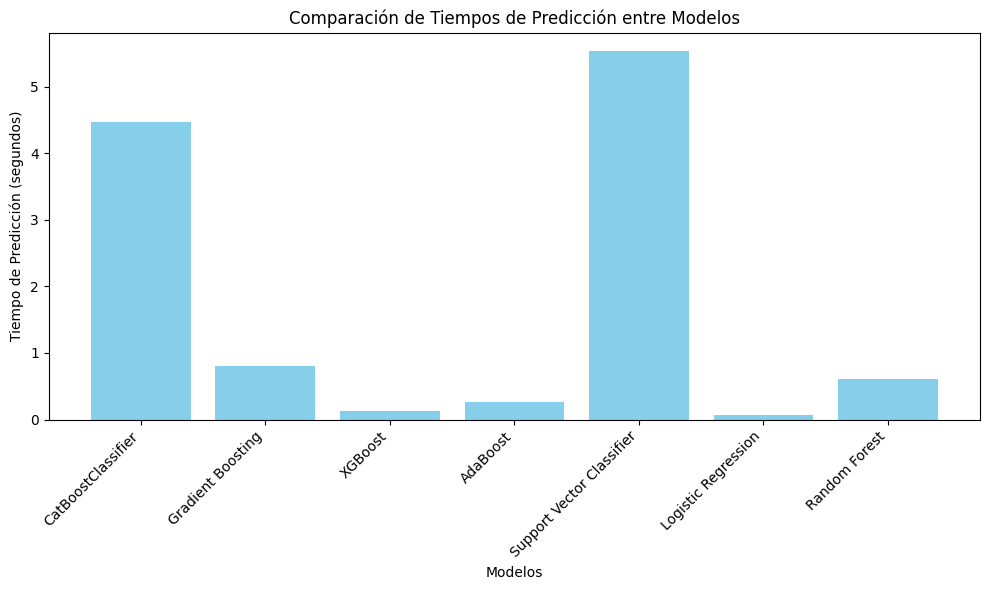

In [53]:
# Inicializar los clasificadores
models = {
    'CatBoostClassifier': CatBoostClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'XGBoost': XGBClassifier(random_state=42),
    'AdaBoost': AdaBoostClassifier(random_state=42),
    'Support Vector Classifier': SVC(probability=True, random_state=42),
    'Logistic Regression': LogisticRegression(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
}

# DataFrame para almacenar tiempos
prediction_times = {}

# Entrenamiento, predicción y medición de tiempos
for model_name, model in models.items():
    start_time = time.time()
    
    # Entrenar el modelo
    model.fit(X_train, y_train)
    
    # Predecir las etiquetas en el conjunto de prueba
    y_pred = model.predict(X_test)
    
    end_time = time.time()
    
    # Calcular el tiempo de predicción
    elapsed_time = end_time - start_time
    prediction_times[model_name] = elapsed_time

    # Calcular la matriz de confusión
    cm = confusion_matrix(y_test, y_pred)
    
    # Mostrar la matriz de confusión
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not Transported', 'Transported'])
    disp.plot()
    plt.title(f'Matriz de Confusión para {model_name}')
    plt.show()

# Imprimir los tiempos de predicción
print("Tiempos de predicción (en segundos):")
for model_name, elapsed_time in prediction_times.items():
    print(f"{model_name}: {elapsed_time:.4f} segundos")

# Visualizar los tiempos de predicción
plt.figure(figsize=(10, 6))
plt.bar(prediction_times.keys(), prediction_times.values(), color='skyblue')
plt.xlabel('Modelos')
plt.ylabel('Tiempo de Predicción (segundos)')
plt.title('Comparación de Tiempos de Predicción entre Modelos')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


### Evaluación Individual de los "Mejores Modelos"

#### Gradient Boosting

In [15]:
gb = GradientBoostingClassifier(n_estimators=100, random_state=42) 
# Entrenamiento final del modelo de descenso de gradiente en todo el conjunto de datos
gb.fit(X_train, y_train)
# Obtener predicciones en el conjunto completo para la matriz de confusión
y_pred_gb = gb.predict(X_test)

In [16]:
# Crear el clasificador AdaBoost
gb_clf = GradientBoostingClassifier(random_state=42)

# Definir los métodos de puntuación
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score),
    'roc_auc': make_scorer(roc_auc_score)
}

# Realizar validación cruzada
cv_results = cross_validate(
    gb_clf, X_train, y_train, cv=5, scoring=scoring,
    return_train_score=False
)

# Mostrar los resultados
print("Resultados de la Validación Cruzada para GradientBoost:")
for metric in scoring.keys():
    print(f"\n{metric.capitalize()}:")
    print(f"  Media: {np.mean(cv_results[f'test_{metric}']):.4f}")
    print(f"  Desviación estándar: {np.std(cv_results[f'test_{metric}']):.4f}")


Resultados de la Validación Cruzada para GradientBoost:

Accuracy:
  Media: 0.8063
  Desviación estándar: 0.0060

Precision:
  Media: 0.7881
  Desviación estándar: 0.0149

Recall:
  Media: 0.8423
  Desviación estándar: 0.0151

F1:
  Media: 0.8140
  Desviación estándar: 0.0037

Roc_auc:
  Media: 0.8061
  Desviación estándar: 0.0061


In [17]:
# Evaluar el modelo en el conjunto de prueba
accuracy_gb = accuracy_score(y_test, y_pred_gb)
print(f"Precisión en el conjunto de prueba: {accuracy_gb:.4f}")

# Imprimir el reporte de clasificación
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_gb))

Precisión en el conjunto de prueba: 0.7849

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.82      0.73      0.77       861
           1       0.76      0.84      0.80       878

    accuracy                           0.78      1739
   macro avg       0.79      0.78      0.78      1739
weighted avg       0.79      0.78      0.78      1739



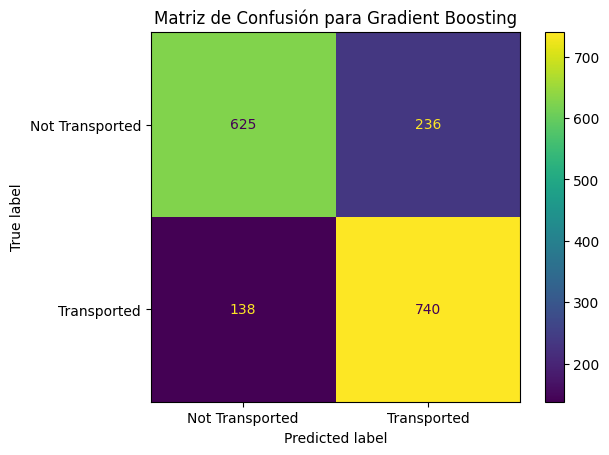

In [18]:
# Visualización de la matriz de confusión para el descenso de gradiente
cm_gb = confusion_matrix(y_test, y_pred_gb)
# Mostrar la matriz de confusión
ConfusionMatrixDisplay(cm_gb, display_labels=['Not Transported', 'Transported']).plot()
plt.title('Matriz de Confusión para Gradient Boosting')
plt.show()

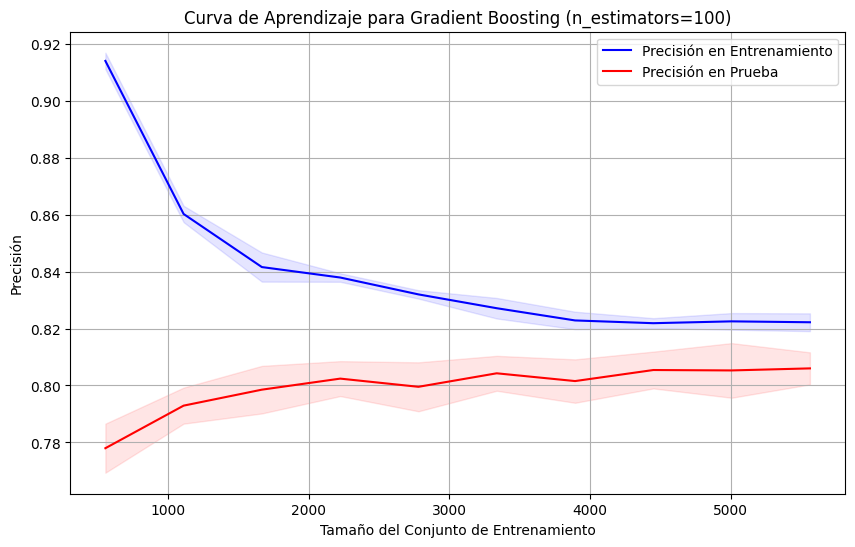

In [19]:
# Obtener las curvas de aprendizaje
train_sizes, train_scores, test_scores = learning_curve(
    gb, X_train, y_train, cv=5, scoring='accuracy',
    train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1
)

# Calcular las medias y desviaciones estándar
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Graficar la curva de aprendizaje
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Precisión en Entrenamiento', color='blue')
plt.plot(train_sizes, test_mean, label='Precisión en Prueba', color='red')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='red')

plt.title('Curva de Aprendizaje para Gradient Boosting (n_estimators=100)')
plt.xlabel('Tamaño del Conjunto de Entrenamiento')
plt.ylabel('Precisión')
plt.legend(loc='best')
plt.grid()
plt.show()

#### XGBoost

In [20]:
# Crear el clasificador XGBoost
xgb_clf = XGBClassifier(n_estimators=100, random_state=42)

# Entrenar el modelo XGBoost en el conjunto de entrenamiento
xgb_clf.fit(X_train, y_train)

# Obtener predicciones en el conjunto de prueba
y_pred_xgb = xgb_clf.predict(X_test)

In [21]:
# Definir los métodos de puntuación
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score),
    'roc_auc': make_scorer(roc_auc_score)
}

# Realizar validación cruzada para XGBoost
cv_results = cross_validate(
    xgb_clf, X_train, y_train, cv=5, scoring=scoring,
    return_train_score=False
)

# Mostrar los resultados de la validación cruzada
print("Resultados de la Validación Cruzada para XGBoost:")
for metric in scoring.keys():
    print(f"\n{metric.capitalize()}:")
    print(f"  Media: {np.mean(cv_results[f'test_{metric}']):.4f}")
    print(f"  Desviación estándar: {np.std(cv_results[f'test_{metric}']):.4f}")

Resultados de la Validación Cruzada para XGBoost:

Accuracy:
  Media: 0.8041
  Desviación estándar: 0.0101

Precision:
  Media: 0.8035
  Desviación estándar: 0.0152

Recall:
  Media: 0.8091
  Desviación estándar: 0.0135

F1:
  Media: 0.8062
  Desviación estándar: 0.0092

Roc_auc:
  Media: 0.8041
  Desviación estándar: 0.0102


In [22]:
# Evaluar el modelo en el conjunto de prueba
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
print(f"Precisión en el conjunto de prueba: {accuracy_xgb:.4f}")

# Imprimir el reporte de clasificación
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_xgb))

Precisión en el conjunto de prueba: 0.7855

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.79      0.77      0.78       861
           1       0.78      0.80      0.79       878

    accuracy                           0.79      1739
   macro avg       0.79      0.79      0.79      1739
weighted avg       0.79      0.79      0.79      1739



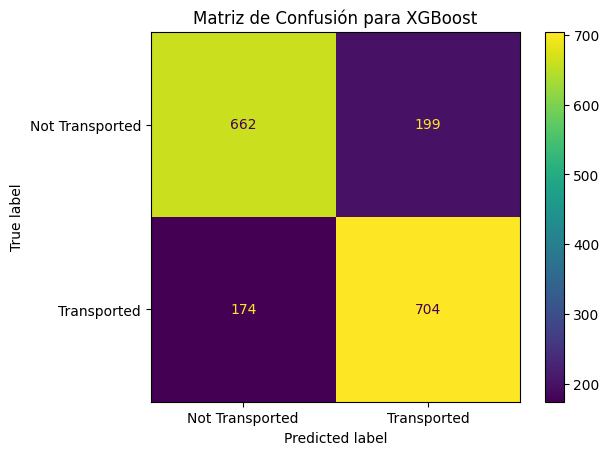

In [23]:
# Visualización de la matriz de confusión para XGBoost
cm_xgb = confusion_matrix(y_test, y_pred_xgb)
ConfusionMatrixDisplay(cm_xgb, display_labels=['Not Transported', 'Transported']).plot()
plt.title('Matriz de Confusión para XGBoost')
plt.show()

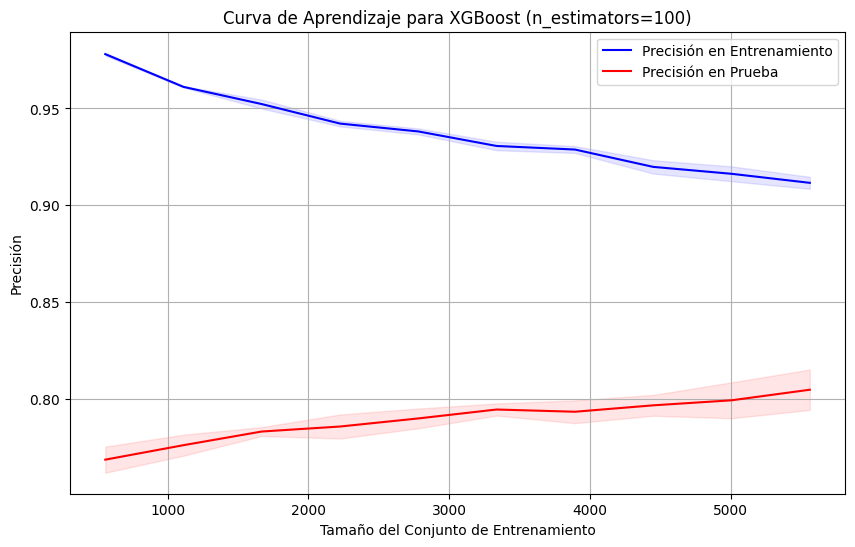

In [24]:
# Obtener las curvas de aprendizaje para XGBoost
train_sizes, train_scores, test_scores = learning_curve(
    xgb_clf, X_train, y_train, cv=5, scoring='accuracy',
    train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1
)

# Calcular las medias y desviaciones estándar
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Graficar la curva de aprendizaje
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Precisión en Entrenamiento', color='blue')
plt.plot(train_sizes, test_mean, label='Precisión en Prueba', color='red')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='red')

plt.title('Curva de Aprendizaje para XGBoost (n_estimators=100)')
plt.xlabel('Tamaño del Conjunto de Entrenamiento')
plt.ylabel('Precisión')
plt.legend(loc='best')
plt.grid()
plt.show()

#### AdaBoost

In [25]:
# Entrenar el modelo AdaBoost en crudo
ada_clf = AdaBoostClassifier(random_state=42)
ada_clf.fit(X_train, y_train)
# Realizar predicciones
y_pred_ada = ada_clf.predict(X_test)

c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


In [26]:
# Crear el clasificador AdaBoost
ada_clf = AdaBoostClassifier(random_state=42)

# Definir los métodos de puntuación
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score),
    'roc_auc': make_scorer(roc_auc_score)
}

# Realizar validación cruzada
cv_results = cross_validate(
    ada_clf, X_train, y_train, cv=5, scoring=scoring,
    return_train_score=False
)

# Mostrar los resultados
print("Resultados de la Validación Cruzada para AdaBoost:")
for metric in scoring.keys():
    print(f"\n{metric.capitalize()}:")
    print(f"  Media: {np.mean(cv_results[f'test_{metric}']):.4f}")
    print(f"  Desviación estándar: {np.std(cv_results[f'test_{metric}']):.4f}")


c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\Manuel Montufar\Documents\ProyectosManu\Escuela\Concentración\Reto\.venv\Lib\si

Resultados de la Validación Cruzada para AdaBoost:

Accuracy:
  Media: 0.7952
  Desviación estándar: 0.0106

Precision:
  Media: 0.7828
  Desviación estándar: 0.0185

Recall:
  Media: 0.8220
  Desviación estándar: 0.0113

F1:
  Media: 0.8017
  Desviación estándar: 0.0079

Roc_auc:
  Media: 0.7951
  Desviación estándar: 0.0107


In [27]:
# Evaluar el modelo en el conjunto de prueba
accuracy_ada = accuracy_score(y_test, y_pred_ada)
print(f"Precisión en el conjunto de prueba: {accuracy_ada:.4f}")

# Imprimir el reporte de clasificación
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_ada))

Precisión en el conjunto de prueba: 0.7746

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.80      0.73      0.76       861
           1       0.76      0.82      0.79       878

    accuracy                           0.77      1739
   macro avg       0.78      0.77      0.77      1739
weighted avg       0.78      0.77      0.77      1739



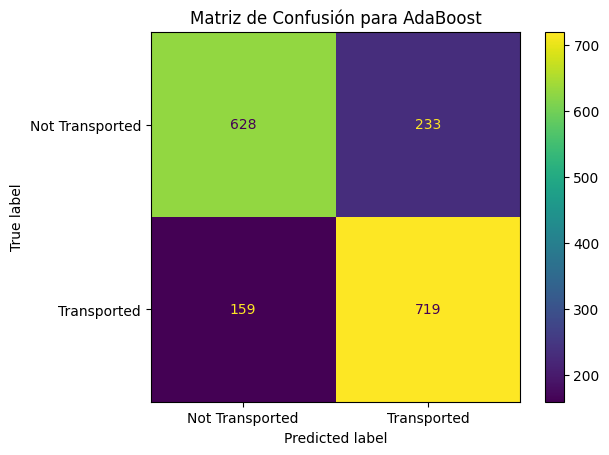

In [28]:
# Calcular la matriz de confusión
conf_matrix_ada = confusion_matrix(y_test, y_pred_ada)

# Mostrar la matriz de confusión
ConfusionMatrixDisplay(conf_matrix_ada, display_labels=['Not Transported', 'Transported']).plot()
plt.title('Matriz de Confusión para AdaBoost')
plt.show()

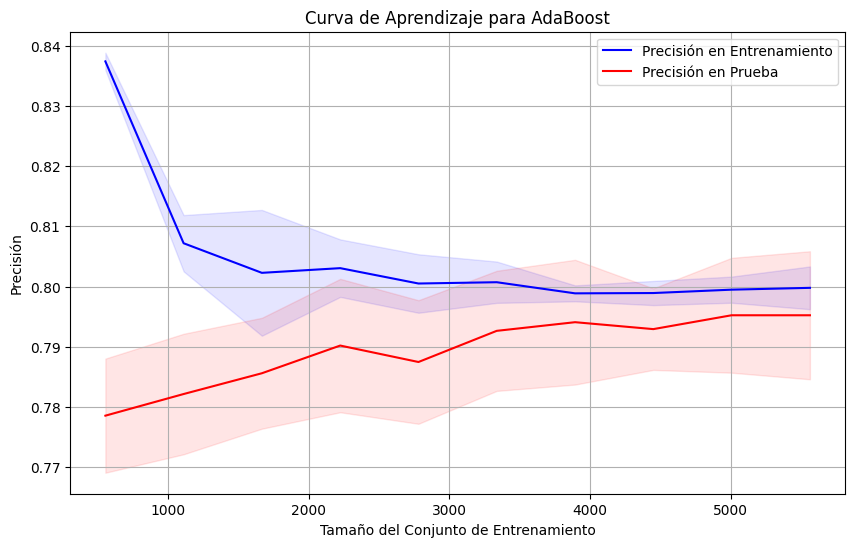

In [29]:
# Obtener las curvas de aprendizaje
train_sizes, train_scores, test_scores = learning_curve(
    ada_clf, X_train, y_train, cv=5, scoring='accuracy',
    train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1
)

# Calcular las medias y desviaciones estándar
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Graficar la curva de aprendizaje
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Precisión en Entrenamiento', color='blue')
plt.plot(train_sizes, test_mean, label='Precisión en Prueba', color='red')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='red')

plt.title('Curva de Aprendizaje para AdaBoost')
plt.xlabel('Tamaño del Conjunto de Entrenamiento')
plt.ylabel('Precisión')
plt.legend(loc='best')
plt.grid()
plt.show()

#### Logistic Regression

In [30]:
# Crear un pipeline con escalado y regresión logística
lr_clf = make_pipeline(StandardScaler(), LogisticRegression(random_state=42, max_iter=5000))

# Entrenar el modelo con el pipeline
lr_clf.fit(X_train, y_train)

# Obtener predicciones en el conjunto de prueba
y_pred_lr = lr_clf.predict(X_test)

In [31]:
# Definir los métodos de puntuación
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score),
    'roc_auc': make_scorer(roc_auc_score)
}

# Realizar validación cruzada
cv_results = cross_validate(
    lr_clf, X_train, y_train, cv=5, scoring=scoring,
    return_train_score=False
)

# Mostrar los resultados
print("Resultados de la Validación Cruzada para Logistic Regression:")
for metric in scoring.keys():
    print(f"\n{metric.capitalize()}:")
    print(f"  Media: {np.mean(cv_results[f'test_{metric}']):.4f}")
    print(f"  Desviación estándar: {np.std(cv_results[f'test_{metric}']):.4f}")

Resultados de la Validación Cruzada para Logistic Regression:

Accuracy:
  Media: 0.7936
  Desviación estándar: 0.0098

Precision:
  Media: 0.7856
  Desviación estándar: 0.0188

Recall:
  Media: 0.8126
  Desviación estándar: 0.0127

F1:
  Media: 0.7986
  Desviación estándar: 0.0069

Roc_auc:
  Media: 0.7935
  Desviación estándar: 0.0099


In [32]:
# Evaluar el modelo en el conjunto de prueba
accuracy_lr = accuracy_score(y_test, y_pred_lr)
print(f"Precisión en el conjunto de prueba: {accuracy_lr:.4f}")

# Imprimir el reporte de clasificación
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_lr))

Precisión en el conjunto de prueba: 0.7821

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.80      0.75      0.77       861
           1       0.77      0.82      0.79       878

    accuracy                           0.78      1739
   macro avg       0.78      0.78      0.78      1739
weighted avg       0.78      0.78      0.78      1739



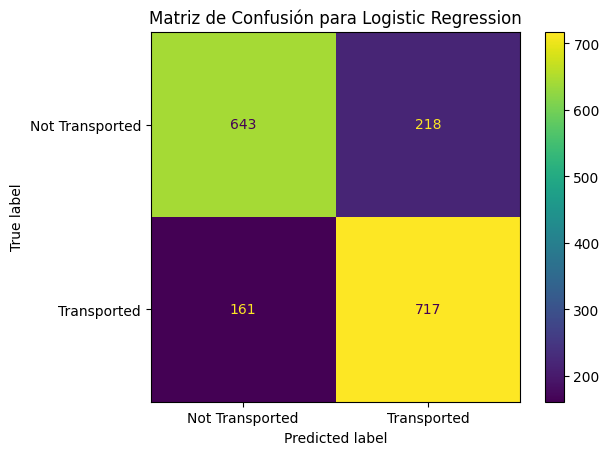

In [33]:
# Calcular la matriz de confusión
conf_matrix_lr = confusion_matrix(y_test, y_pred_lr)

# Mostrar la matriz de confusión
ConfusionMatrixDisplay(conf_matrix_lr, display_labels=['Not Transported', 'Transported']).plot()
plt.title('Matriz de Confusión para Logistic Regression')
plt.show()


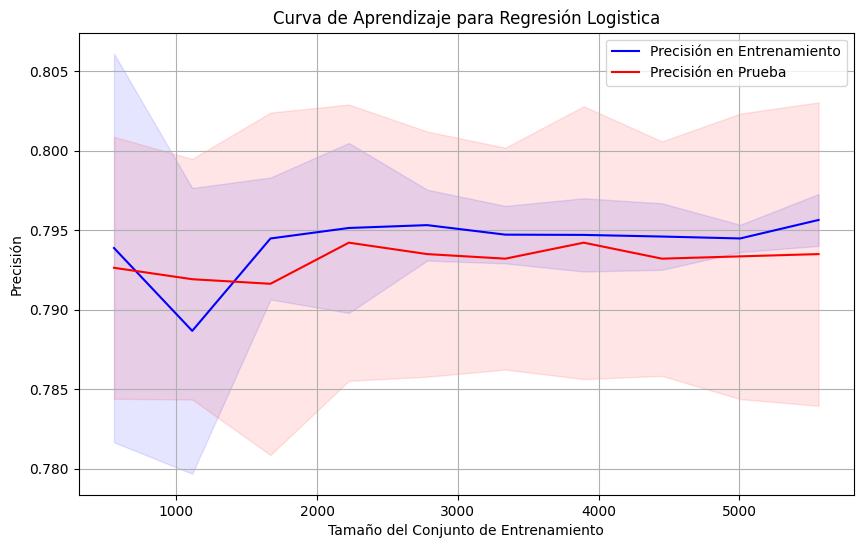

In [34]:
# Obtener las curvas de aprendizaje
train_sizes, train_scores, test_scores = learning_curve(
    lr_clf, X_train, y_train, cv=5, scoring='accuracy',
    train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1
)

# Calcular las medias y desviaciones estándar
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Graficar la curva de aprendizaje
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Precisión en Entrenamiento', color='blue')
plt.plot(train_sizes, test_mean, label='Precisión en Prueba', color='red')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='red')

plt.title('Curva de Aprendizaje para Regresión Logistica')
plt.xlabel('Tamaño del Conjunto de Entrenamiento')
plt.ylabel('Precisión')
plt.legend(loc='best')
plt.grid()
plt.show()

#### Support Vector Classifier

In [35]:
# Crear el clasificador SVC
svc_clf = SVC(random_state=42)
svc_clf.fit(X_train, y_train)
# Obtener predicciones en el conjunto de prueba
y_pred_svc = svc_clf.predict(X_test)

In [36]:
# Definir los métodos de puntuación
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score),
    'roc_auc': make_scorer(roc_auc_score)
}

# Realizar validación cruzada
cv_results_svc = cross_validate(
    svc_clf, X_train, y_train, cv=5, scoring=scoring,
    return_train_score=False
)

# Mostrar los resultados
print("Resultados de la Validación Cruzada para SVC:")
for metric in scoring.keys():
    print(f"\n{metric.capitalize()}:")
    print(f"  Media: {np.mean(cv_results_svc[f'test_{metric}']):.4f}")
    print(f"  Desviación estándar: {np.std(cv_results_svc[f'test_{metric}']):.4f}")

Resultados de la Validación Cruzada para SVC:

Accuracy:
  Media: 0.7869
  Desviación estándar: 0.0128

Precision:
  Media: 0.7430
  Desviación estándar: 0.0176

Recall:
  Media: 0.8829
  Desviación estándar: 0.0126

F1:
  Media: 0.8067
  Desviación estándar: 0.0093

Roc_auc:
  Media: 0.7863
  Desviación estándar: 0.0128


In [37]:
# Evaluar el modelo en el conjunto de prueba
accuracy_svc = accuracy_score(y_test, y_pred_svc)
print(f"Precisión en el conjunto de prueba: {accuracy_svc:.4f}")

# Imprimir el reporte de clasificación
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_svc))

Precisión en el conjunto de prueba: 0.7740

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.84      0.67      0.75       861
           1       0.73      0.88      0.80       878

    accuracy                           0.77      1739
   macro avg       0.79      0.77      0.77      1739
weighted avg       0.79      0.77      0.77      1739



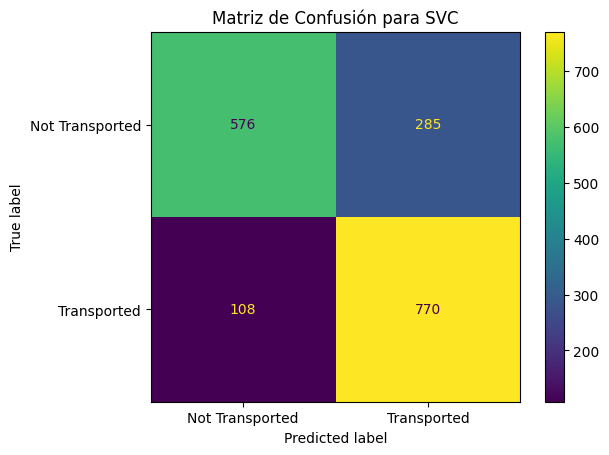

In [38]:
# Calcular la matriz de confusión
conf_matrix_svc = confusion_matrix(y_test, y_pred_svc)

# Mostrar la matriz de confusión
ConfusionMatrixDisplay(conf_matrix_svc, display_labels=['Not Transported', 'Transported']).plot()
plt.title('Matriz de Confusión para SVC')
plt.show()

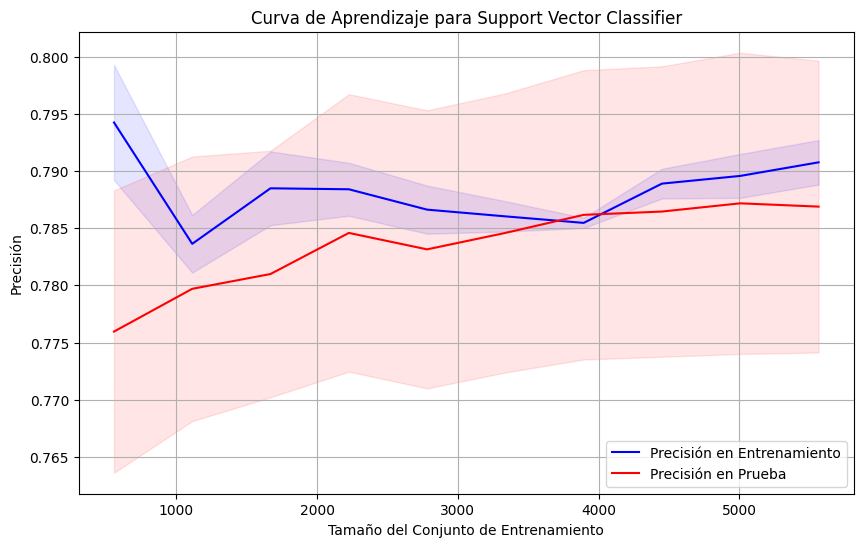

In [39]:
# Obtener las curvas de aprendizaje
train_sizes, train_scores, test_scores = learning_curve(
    svc_clf, X_train, y_train, cv=5, scoring='accuracy',
    train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1
)

# Calcular las medias y desviaciones estándar
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Graficar la curva de aprendizaje
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Precisión en Entrenamiento', color='blue')
plt.plot(train_sizes, test_mean, label='Precisión en Prueba', color='red')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='red')

plt.title('Curva de Aprendizaje para Support Vector Classifier')
plt.xlabel('Tamaño del Conjunto de Entrenamiento')
plt.ylabel('Precisión')
plt.legend(loc='best')
plt.grid()
plt.show()

#### Random Forest

In [40]:
# Crear el clasificador Random Forest
rf_clf = RandomForestClassifier(random_state=42)
rf_clf.fit(X_train, y_train)

# Obtener predicciones en el conjunto de prueba
y_pred_rf = rf_clf.predict(X_test)

In [41]:
# Definir los métodos de puntuación
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score),
    'roc_auc': make_scorer(roc_auc_score)
}

# Realizar validación cruzada
cv_results_rf = cross_validate(
    rf_clf, X_train, y_train, cv=5, scoring=scoring,
    return_train_score=False
)

# Mostrar los resultados
print("Resultados de la Validación Cruzada para Random Forest:")
for metric in scoring.keys():
    print(f"\n{metric.capitalize()}:")
    print(f"  Media: {np.mean(cv_results_rf[f'test_{metric}']):.4f}")
    print(f"  Desviación estándar: {np.std(cv_results_rf[f'test_{metric}']):.4f}")

Resultados de la Validación Cruzada para Random Forest:

Accuracy:
  Media: 0.7900
  Desviación estándar: 0.0035

Precision:
  Media: 0.8138
  Desviación estándar: 0.0108

Recall:
  Media: 0.7563
  Desviación estándar: 0.0150

F1:
  Media: 0.7838
  Desviación estándar: 0.0048

Roc_auc:
  Media: 0.7903
  Desviación estándar: 0.0035


In [42]:
# Evaluar el modelo en el conjunto de prueba
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print(f"Precisión en el conjunto de prueba: {accuracy_rf:.4f}")

# Imprimir el reporte de clasificación
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_rf))

Precisión en el conjunto de prueba: 0.7809

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.77      0.80      0.78       861
           1       0.80      0.76      0.78       878

    accuracy                           0.78      1739
   macro avg       0.78      0.78      0.78      1739
weighted avg       0.78      0.78      0.78      1739



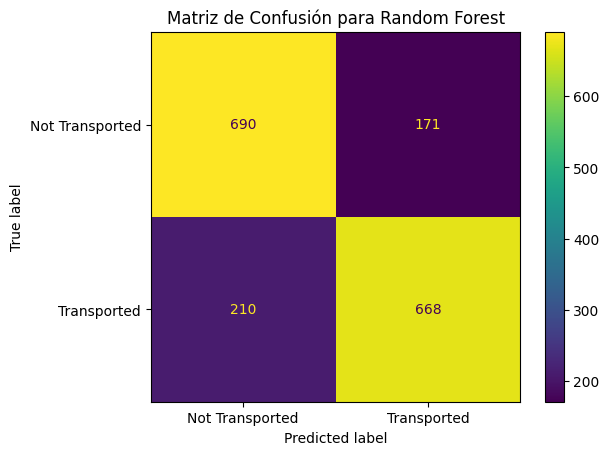

In [43]:
# Calcular la matriz de confusión
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)

# Mostrar la matriz de confusión
ConfusionMatrixDisplay(conf_matrix_rf, display_labels=['Not Transported', 'Transported']).plot()
plt.title('Matriz de Confusión para Random Forest')
plt.show()

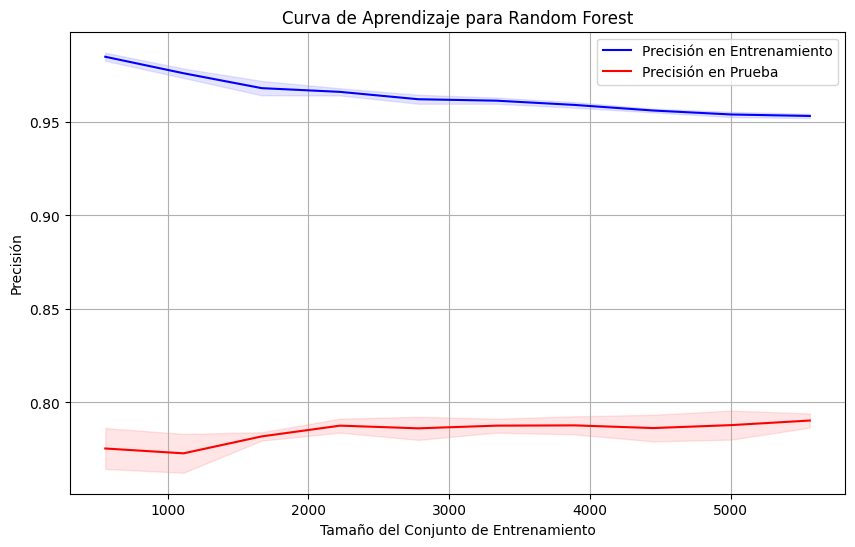

In [44]:
# Obtener las curvas de aprendizaje
train_sizes, train_scores, test_scores = learning_curve(
    rf_clf, X_train, y_train, cv=5, scoring='accuracy',
    train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1
)

# Calcular las medias y desviaciones estándar
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Graficar la curva de aprendizaje
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Precisión en Entrenamiento', color='blue')
plt.plot(train_sizes, test_mean, label='Precisión en Prueba', color='red')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='red')

plt.title('Curva de Aprendizaje para Random Forest')
plt.xlabel('Tamaño del Conjunto de Entrenamiento')
plt.ylabel('Precisión')
plt.legend(loc='best')
plt.grid()
plt.show()

#### CatBoost

In [46]:
# Crear el clasificador CatBoost
cat_clf = CatBoostClassifier(random_state=42, verbose=0)  # `verbose=0` para evitar demasiada salida
cat_clf.fit(X_train, y_train)

# Obtener predicciones en el conjunto de prueba
y_pred_cat = cat_clf.predict(X_test)

In [48]:
# Definir los métodos de puntuación
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score),
    'roc_auc': make_scorer(roc_auc_score)
}

# Realizar validación cruzada
cv_results_cat = cross_validate(
    cat_clf, X_train, y_train, cv=5, scoring=scoring,
    return_train_score=False
)

# Mostrar los resultados
print("Resultados de la Validación Cruzada para CatBoost:")
for metric in scoring.keys():
    print(f"\n{metric.capitalize()}:")
    print(f"  Media: {np.mean(cv_results_cat[f'test_{metric}']):.4f}")
    print(f"  Desviación estándar: {np.std(cv_results_cat[f'test_{metric}']):.4f}")


Resultados de la Validación Cruzada para CatBoost:

Accuracy:
  Media: 0.8096
  Desviación estándar: 0.0057

Precision:
  Media: 0.8011
  Desviación estándar: 0.0123

Recall:
  Media: 0.8277
  Desviación estándar: 0.0127

F1:
  Media: 0.8140
  Desviación estándar: 0.0047

Roc_auc:
  Media: 0.8095
  Desviación estándar: 0.0058


In [49]:
# Evaluar el modelo en el conjunto de prueba
accuracy_cat = accuracy_score(y_test, y_pred_cat)
print(f"Precisión en el conjunto de prueba: {accuracy_cat:.4f}")

# Imprimir el reporte de clasificación
print("\nReporte de Clasificación:")
print(classification_report(y_test, y_pred_cat))

Precisión en el conjunto de prueba: 0.7959

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.81      0.77      0.79       861
           1       0.79      0.82      0.80       878

    accuracy                           0.80      1739
   macro avg       0.80      0.80      0.80      1739
weighted avg       0.80      0.80      0.80      1739



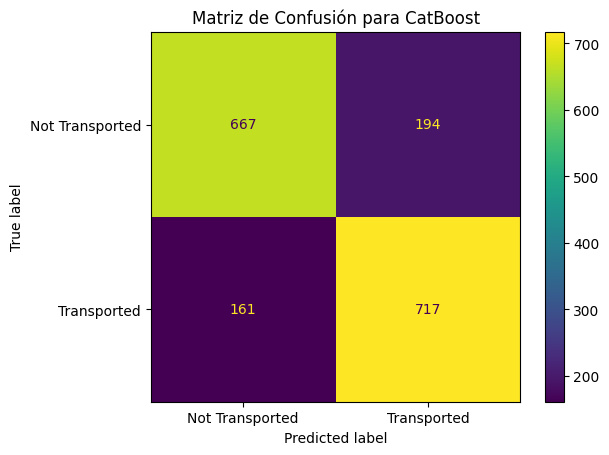

In [50]:
# Calcular la matriz de confusión
conf_matrix_cat = confusion_matrix(y_test, y_pred_cat)

# Mostrar la matriz de confusión
ConfusionMatrixDisplay(conf_matrix_cat, display_labels=['Not Transported', 'Transported']).plot()
plt.title('Matriz de Confusión para CatBoost')
plt.show()

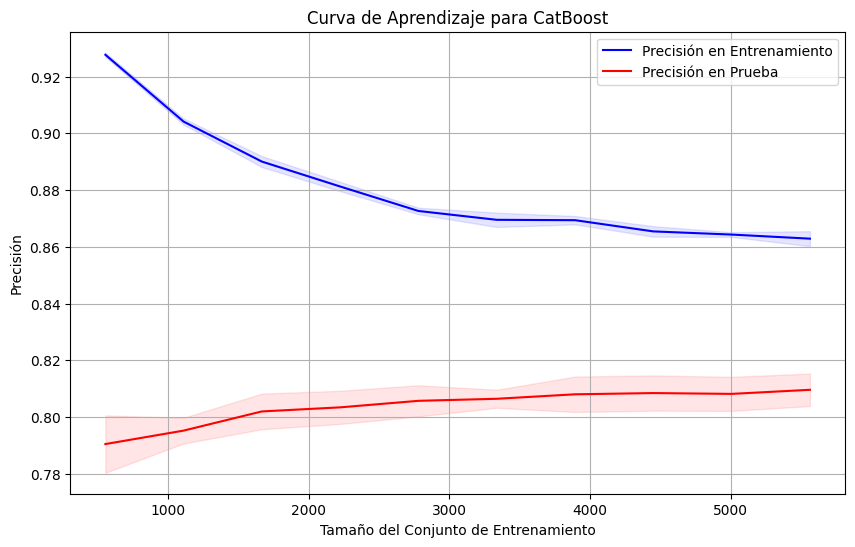

In [51]:
# Obtener las curvas de aprendizaje
train_sizes, train_scores, test_scores = learning_curve(
    cat_clf, X_train, y_train, cv=5, scoring='accuracy',
    train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1
)

# Calcular las medias y desviaciones estándar
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Graficar la curva de aprendizaje
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Precisión en Entrenamiento', color='blue')
plt.plot(train_sizes, test_mean, label='Precisión en Prueba', color='red')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='red')

plt.title('Curva de Aprendizaje para CatBoost')
plt.xlabel('Tamaño del Conjunto de Entrenamiento')
plt.ylabel('Precisión')
plt.legend(loc='best')
plt.grid()
plt.show()